In [1]:
# imports
import numpy as np
import csv
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import date, timedelta, datetime
import scipy.stats as stats
from matplotlib import cm
import random
from scipy.stats import zscore
from sklearn import preprocessing
import math
from matplotlib import style
import matplotlib as mpl

# Mobility/Restaurant Data (International)

In [2]:
# First, create a Dataframe using the Apple mobility data
apple_mob_file = "data/mobility-trends.csv"
apple_df = pd.read_csv(apple_mob_file)

apple_df.head()

,geo_type,region,transportation_type,date,value
0,country/region,Albania,driving,2020-01-13,100.00
1,country/region,Albania,driving,2020-01-14,95.30
2,country/region,Albania,driving,2020-01-15,101.43
3,country/region,Albania,driving,2020-01-16,97.20
4,country/region,Albania,driving,2020-01-17,103.55


In [3]:
# Next, create a Dataframe using the Google mobility data. We can combine this with the Apple Dataframe later.
google_mob_file = "data/regional-mobility.csv"
google_df = pd.read_csv(google_mob_file)

google_df.head()

,country,region,date,retail,grocery_and_pharmacy,parks,transit_stations,workplaces,residential
0,United Arab Emirates,Total,2020-02-15,0.0,4.0,5.0,0.0,2.0,1.0
1,United Arab Emirates,Total,2020-02-16,1.0,4.0,4.0,1.0,2.0,1.0
2,United Arab Emirates,Total,2020-02-17,-1.0,1.0,5.0,1.0,2.0,1.0
3,United Arab Emirates,Total,2020-02-18,-2.0,1.0,5.0,0.0,2.0,1.0
4,United Arab Emirates,Total,2020-02-19,-2.0,0.0,4.0,-1.0,2.0,1.0


In [4]:
# Now, create a Dataframe from the restaurant data.
restaurant_file = "data/restaurant-performance-country.csv"
restaurant_df = pd.read_csv(restaurant_file, index_col=0)

restaurant_df.head()

,country,percent_yoy_change,date
region_type,,,
countries,Global,-1,2020-02-18
countries,Global,3,2020-02-19
countries,Global,-1,2020-02-20
countries,Global,-2,2020-02-21
countries,Global,1,2020-02-22


In [5]:
# Finally, let's create a Dataframe of COVID-19 spread data for comparison.

covid_file = "WHO-COVID-19-global-data.csv"
covid_df = pd.read_csv(covid_file)

covid_df.head()

,Date_reported,Country_code,Country,WHO_region,New_cases,Cumulative_cases,New_deaths,Cumulative_deaths
0,2020-02-24,AF,Afghanistan,EMRO,1,1,0,0
1,2020-02-25,AF,Afghanistan,EMRO,0,1,0,0
2,2020-02-26,AF,Afghanistan,EMRO,0,1,0,0
3,2020-02-27,AF,Afghanistan,EMRO,0,1,0,0
4,2020-02-28,AF,Afghanistan,EMRO,0,1,0,0


In [6]:
# Let's combine the Apple and Google data into a single Dataframe
# First, let's sort the instances by country and remove instances without a country or that do not occur on a national level

apple_df = apple_df[apple_df.geo_type == 'country/region'] # Only keeps instances of countries, excludes cities
apple_df = apple_df.drop(columns=["geo_type"]) # Delete unnecessary column
apple_df = apple_df.rename(columns={"region": "country"}) # rename column for accuracy
# print(len(apple_df))

google_df = google_df[google_df.region == 'Total'] # Only keeps data for entire countries (not regions/cities)
google_df = google_df.drop(columns=["region"]) # Delete unnecessary column
# print(len(google_df))

# Now we can combine the two based on country value and date
mobility_df = pd.merge(apple_df, google_df, how="outer", on=["country", "date"])
mobility_df
# print(len(mobility_df))

,country,transportation_type,date,value,retail,grocery_and_pharmacy,parks,transit_stations,workplaces,residential
0,Albania,driving,2020-01-13,100.00,NaN,NaN,NaN,NaN,NaN,NaN
1,Albania,walking,2020-01-13,100.00,NaN,NaN,NaN,NaN,NaN,NaN
2,Albania,driving,2020-01-14,95.30,NaN,NaN,NaN,NaN,NaN,NaN
3,Albania,walking,2020-01-14,100.68,NaN,NaN,NaN,NaN,NaN,NaN
4,Albania,driving,2020-01-15,101.43,NaN,NaN,NaN,NaN,NaN,NaN
5,Albania,walking,2020-01-15,98.93,NaN,NaN,NaN,NaN,NaN,NaN
6,Albania,driving,2020-01-16,97.20,NaN,NaN,NaN,NaN,NaN,NaN
7,Albania,walking,2020-01-16,98.46,NaN,NaN,NaN,NaN,NaN,NaN
8,Albania,driving,2020-01-17,103.55,NaN,NaN,NaN,NaN,NaN,NaN
9,Albania,walking,2020-01-17,100.85,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
# Now, let's remove any rows with "null" values (this means they did not appear in both Dataframes)
mobility_df.dropna()

,country,transportation_type,date,value,retail,grocery_and_pharmacy,parks,transit_stations,workplaces,residential
276,Argentina,driving,2020-02-15,127.62,1.0,-3.0,-3.0,4.0,-1.0,0.0
277,Argentina,walking,2020-02-15,103.47,1.0,-3.0,-3.0,4.0,-1.0,0.0
278,Argentina,driving,2020-02-16,88.20,-6.0,-6.0,-14.0,-2.0,-4.0,2.0
279,Argentina,walking,2020-02-16,69.12,-6.0,-6.0,-14.0,-2.0,-4.0,2.0
280,Argentina,driving,2020-02-17,92.28,-10.0,-8.0,-23.0,-2.0,7.0,1.0
281,Argentina,walking,2020-02-17,93.42,-10.0,-8.0,-23.0,-2.0,7.0,1.0
282,Argentina,driving,2020-02-18,98.15,3.0,3.0,-2.0,9.0,9.0,-1.0
283,Argentina,walking,2020-02-18,111.49,3.0,3.0,-2.0,9.0,9.0,-1.0
284,Argentina,driving,2020-02-19,98.96,1.0,0.0,10.0,8.0,11.0,-2.0
285,Argentina,walking,2020-02-19,107.02,1.0,0.0,10.0,8.0,11.0,-2.0


In [8]:
# Now, let's add COVID data to the mobility Dataframe

covid_df = covid_df.drop(columns=[" Country_code", " WHO_region"]) # delete extraneous columns
covid_df = covid_df.rename(columns={"Date_reported": "date", " Country": "country"}) # Reformat column names to match mobility df

mobility_df = pd.merge(mobility_df, covid_df, how="outer", on=["country", "date"])
mobility_df = mobility_df.dropna() # Remove instances without both COVID and mobility data
mobility_df


,country,transportation_type,date,value,retail,grocery_and_pharmacy,parks,transit_stations,workplaces,residential,New_cases,Cumulative_cases,New_deaths,Cumulative_deaths
310,Argentina,driving,2020-03-03,88.90,0.0,5.0,-6.0,8.0,16.0,-1.0,1.0,1.0,0.0,0.0
311,Argentina,walking,2020-03-03,104.39,0.0,5.0,-6.0,8.0,16.0,-1.0,1.0,1.0,0.0,0.0
312,Argentina,driving,2020-03-04,92.74,-1.0,3.0,-1.0,8.0,18.0,-2.0,0.0,1.0,0.0,0.0
313,Argentina,walking,2020-03-04,108.23,-1.0,3.0,-1.0,8.0,18.0,-2.0,0.0,1.0,0.0,0.0
314,Argentina,driving,2020-03-05,97.45,1.0,4.0,-9.0,10.0,18.0,-1.0,0.0,1.0,0.0,0.0
315,Argentina,walking,2020-03-05,113.92,1.0,4.0,-9.0,10.0,18.0,-1.0,0.0,1.0,0.0,0.0
316,Argentina,driving,2020-03-06,118.32,6.0,8.0,-7.0,12.0,18.0,-2.0,1.0,2.0,0.0,0.0
317,Argentina,walking,2020-03-06,126.70,6.0,8.0,-7.0,12.0,18.0,-2.0,1.0,2.0,0.0,0.0
318,Argentina,driving,2020-03-07,122.78,5.0,7.0,-10.0,8.0,3.0,1.0,7.0,9.0,1.0,1.0
319,Argentina,walking,2020-03-07,112.81,5.0,7.0,-10.0,8.0,3.0,1.0,7.0,9.0,1.0,1.0


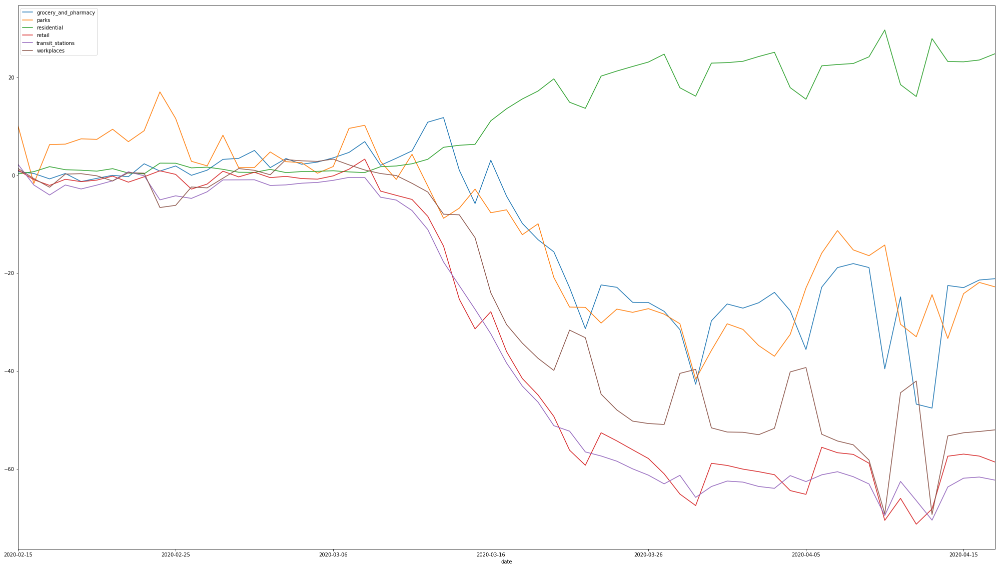

In [9]:
# Just for reference, let's get a simple visualization of the mobility data over time

mobility_date = mobility_df.sort_index(level=["date"])
mobility_date['retail'] = mobility_date['retail'].astype('double') 
mobility_date['grocery_and_pharmacy'] = mobility_date['grocery_and_pharmacy'].astype('double') 
mobility_date['parks'] = mobility_date['parks'].astype('double') 
mobility_date['transit_stations'] = mobility_date['transit_stations'].astype('double') 
mobility_date['workplaces'] = mobility_date['workplaces'].astype('double') 
mobility_date['residential'] = mobility_date['residential'].astype('double') 
mobility_date = mobility_date.groupby(['date']).mean()

# Let's remove the "value" column and COVID case/death columns so that we can just see the different modes of mobility
mobility_date = mobility_date[mobility_date.columns.difference(['value', " Cumulative_cases", " Cumulative_deaths", " New_cases", " New_deaths"])]


mobility_date.plot(figsize=(35,20))

In [10]:
# Out of curiosity, let's get a list of countries included in the above Dataframe, as well as the country count
countries_list = mobility_df["country"].unique()
print("Number of countries included: ", len(countries_list), "\n", countries_list)

Number of countries included:  49 
 ['Argentina' 'Australia' 'Austria' 'Belgium' 'Brazil' 'Bulgaria'
 'Cambodia' 'Canada' 'Chile' 'Colombia' 'Croatia' 'Denmark' 'Egypt'
 'Estonia' 'Finland' 'France' 'Germany' 'Greece' 'Hungary' 'India'
 'Indonesia' 'Ireland' 'Israel' 'Italy' 'Japan' 'Latvia' 'Lithuania'
 'Luxembourg' 'Malaysia' 'Mexico' 'Netherlands' 'New Zealand' 'Norway'
 'Philippines' 'Poland' 'Portugal' 'Romania' 'Saudi Arabia' 'Singapore'
 'Slovakia' 'Slovenia' 'South Africa' 'Spain' 'Sweden' 'Switzerland'
 'Thailand' 'Turkey' 'United Arab Emirates' 'Uruguay']


In [11]:
# And let's see the date range we are working with now.
print("Start date: ", mobility_df.date.min(), "\nEnd date: ", mobility_df.date.max())

Start date:  2020-02-15 
End date:  2020-04-17


In [12]:
# Let's see that restaurant dataframe again

restaurant_df

,country,percent_yoy_change,date
region_type,,,
countries,Global,-1,2020-02-18
countries,Global,3,2020-02-19
countries,Global,-1,2020-02-20
countries,Global,-2,2020-02-21
countries,Global,1,2020-02-22
countries,Global,4,2020-02-23
countries,Global,1,2020-02-24
countries,Global,1,2020-02-25
countries,Global,-2,2020-02-26


In [13]:
# We only want data for specific countries, so let's get rid of all the "Global" values, and also any rows with null values

restaurant_df.dropna() # drops any possible rows with null values
restaurant_df = restaurant_df[restaurant_df.country != 'Global'] # Only keeps instances of countries, excludes global data instances

restaurant_df

,country,percent_yoy_change,date
region_type,,,
countries,Australia,-3,2020-02-18
countries,Australia,-6,2020-02-19
countries,Australia,-3,2020-02-20
countries,Australia,-1,2020-02-21
countries,Australia,0,2020-02-22
countries,Australia,0,2020-02-23
countries,Australia,0,2020-02-24
countries,Australia,-2,2020-02-25
countries,Australia,-2,2020-02-26


In [14]:
# Now, just like with the mobility data, let's add in data on COVID cases

restaurant_df = pd.merge(restaurant_df, covid_df, how="outer", on=["country", "date"])
restaurant_df = restaurant_df.dropna() # Remove instances without both COVID and restaurant data
restaurant_df

,country,percent_yoy_change,date,New_cases,Cumulative_cases,New_deaths,Cumulative_deaths
0,Australia,-3.0,2020-02-18,0.0,15.0,0.0,0.0
1,Australia,-6.0,2020-02-19,0.0,15.0,0.0,0.0
2,Australia,-3.0,2020-02-20,0.0,15.0,0.0,0.0
3,Australia,-1.0,2020-02-21,2.0,17.0,0.0,0.0
4,Australia,0.0,2020-02-22,4.0,21.0,0.0,0.0
5,Australia,0.0,2020-02-23,1.0,22.0,0.0,0.0
6,Australia,0.0,2020-02-24,0.0,22.0,0.0,0.0
7,Australia,-2.0,2020-02-25,1.0,23.0,0.0,0.0
8,Australia,-2.0,2020-02-26,0.0,23.0,0.0,0.0
9,Australia,-7.0,2020-02-27,0.0,23.0,0.0,0.0


In [15]:
# Again, out of curiosity, let's find out which countries are included in this data

restaurant_countries_list = restaurant_df["country"].unique()
print("Number of countries included: ", len(restaurant_countries_list), "\n", restaurant_countries_list)

Number of countries included:  5 
 ['Australia' 'Canada' 'Germany' 'Ireland' 'Mexico']


In [16]:
# And the date range
print("Start date: ", restaurant_df.date.min(), "\nEnd date: ", restaurant_df.date.max())


Start date:  2020-02-18 
End date:  2020-07-12


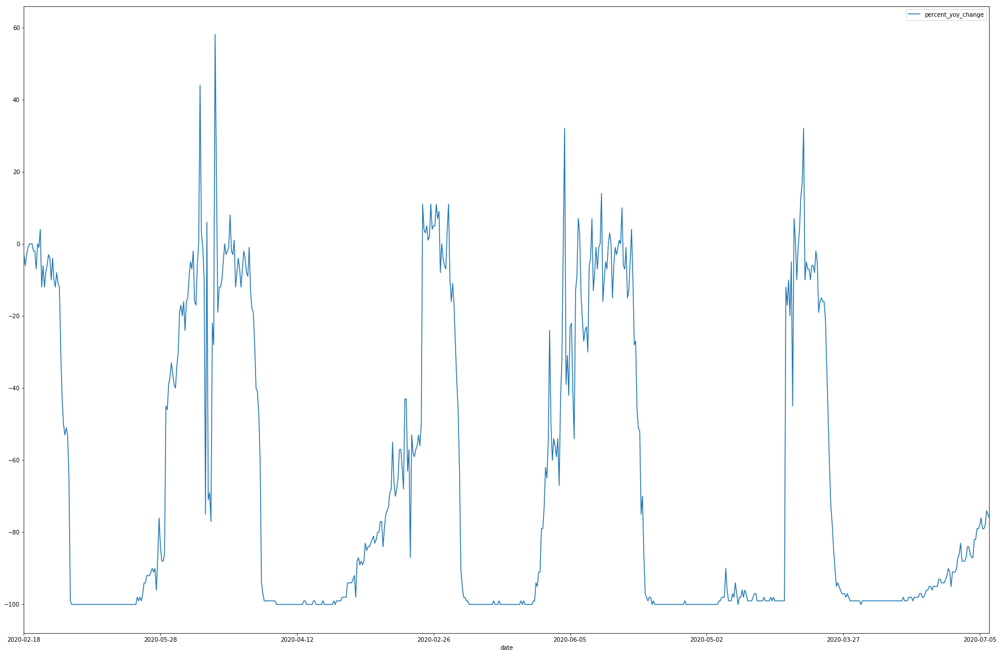

In [17]:
# Just for reference, let's look at the time series data for restaurant performance across all countries

restaurant_df.plot("date", "percent_yoy_change", figsize=(30,20))

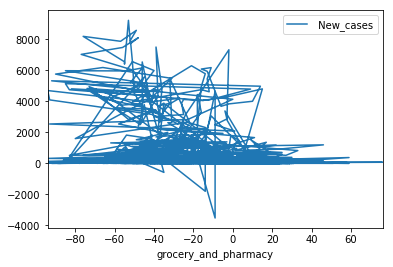

In [18]:
# Let's start out plotting correlation between various types of mobility and new cases of COVID-19
# Note that this is on a global scale (we can break it up by country later)
# First, plotting grocery and pharmacy trips
mobility_df.plot("grocery_and_pharmacy", " New_cases")

In [19]:
# Let's try breaking that down by month
feb_df = mobility_df[mobility_df["date"].str.contains("2020-02")]
march_df = mobility_df[mobility_df["date"].str.contains("2020-03")]
april_df = mobility_df[mobility_df["date"].str.contains("2020-04")]

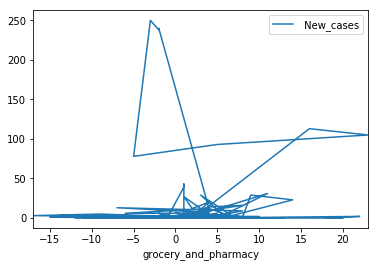

In [20]:
feb_df.plot("grocery_and_pharmacy", " New_cases")

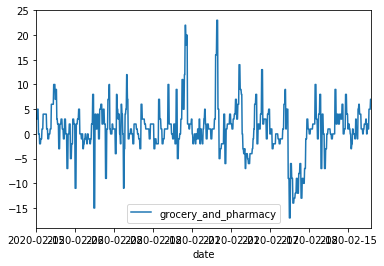

In [21]:
# What did grocery/pharmacy trends look like overall in February?
feb_df.plot("date", "grocery_and_pharmacy")

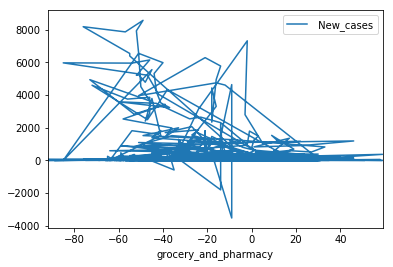

In [22]:
march_df.plot("grocery_and_pharmacy", " New_cases")

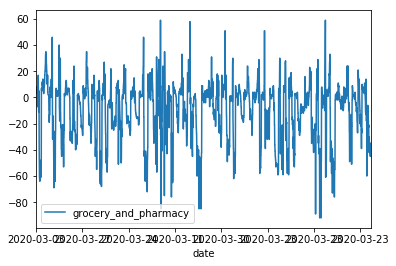

In [23]:
march_df.plot("date", "grocery_and_pharmacy")

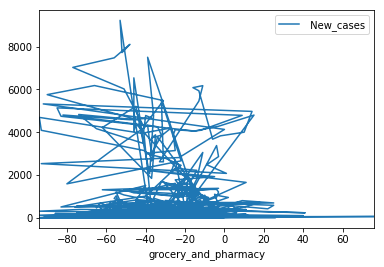

In [24]:
april_df.plot("grocery_and_pharmacy", " New_cases")

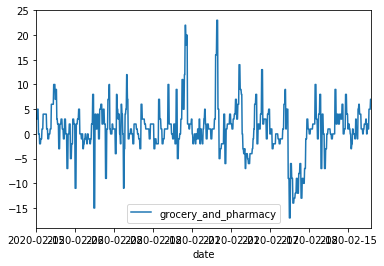

In [25]:
feb_df.plot("date", "grocery_and_pharmacy")

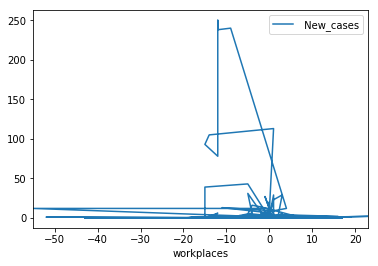

In [26]:
# Let's try looking at workplace travel
feb_df.plot("workplaces", " New_cases")

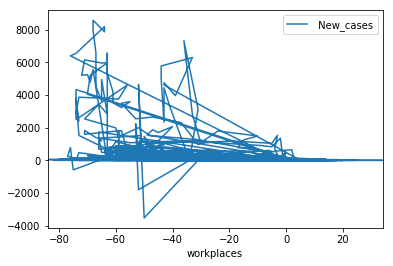

In [27]:
march_df.plot("workplaces", " New_cases")

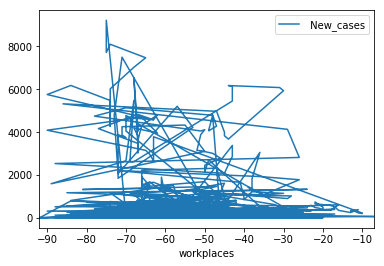

In [28]:
april_df.plot("workplaces", " New_cases")

In [29]:
# Maybe this will work better if I break it down by country as well. Let's use Italy as an example.
italy_feb_df = feb_df[feb_df["country"].str.contains("Italy")]
italy_march_df = march_df[march_df["country"].str.contains("Italy")]
italy_april_df = april_df[april_df["country"].str.contains("Italy")]

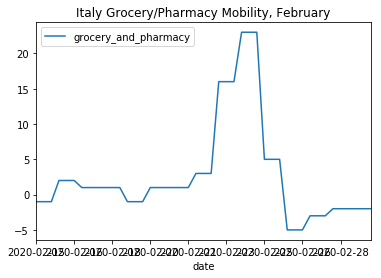

In [30]:
# Let's see what the grocery/pharmacy trends look like over time now
italy_feb_df.plot("date", "grocery_and_pharmacy", title="Italy Grocery/Pharmacy Mobility, February")

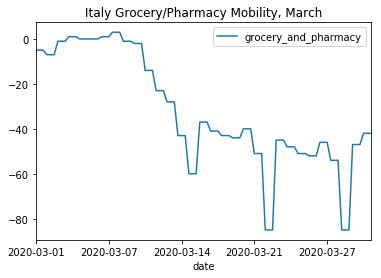

In [31]:
italy_march_df.plot("date", "grocery_and_pharmacy", title="Italy Grocery/Pharmacy Mobility, March")

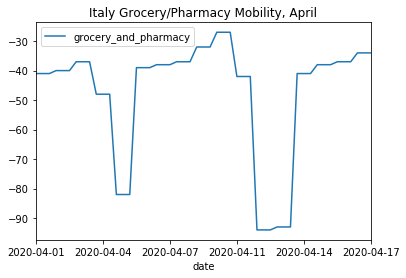

In [32]:
italy_april_df.plot("date", "grocery_and_pharmacy", title="Italy Grocery/Pharmacy Mobility, April")

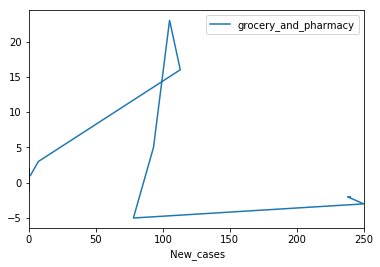

In [33]:
# There are still multiple entries for each date, but this makes things easier to see.
# Now let's look at correlation between grocery/pharmacy visits and new cases.
italy_feb_df.plot(" New_cases", "grocery_and_pharmacy")

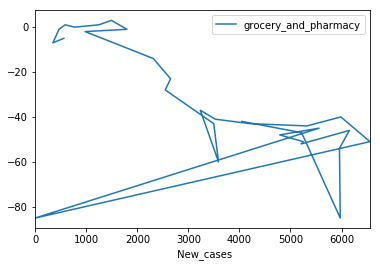

In [34]:
italy_march_df.plot(" New_cases", "grocery_and_pharmacy")

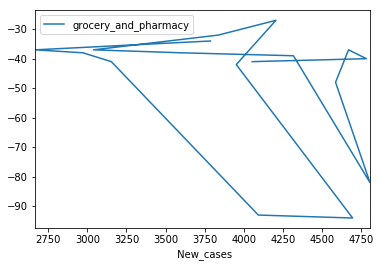

In [35]:
italy_april_df.plot(" New_cases", "grocery_and_pharmacy")

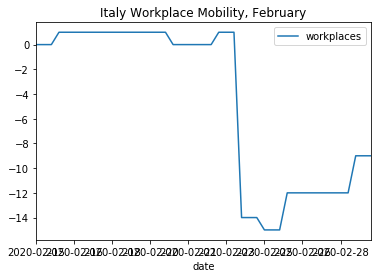

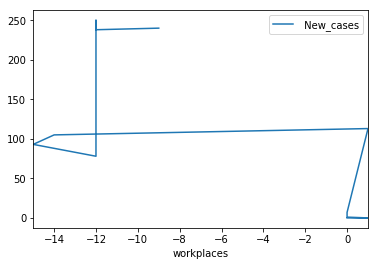

In [36]:
# Let's try workplaces
italy_feb_df.plot("date", "workplaces", title="Italy Workplace Mobility, February")
italy_feb_df.plot("workplaces", " New_cases")

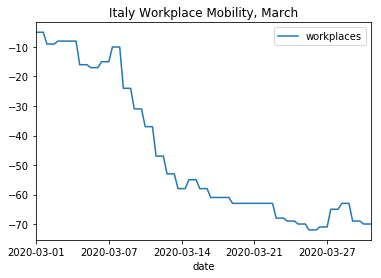

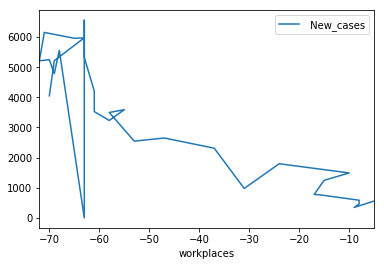

In [37]:
italy_march_df.plot("date", "workplaces", title="Italy Workplace Mobility, March")
italy_march_df.plot("workplaces", " New_cases")

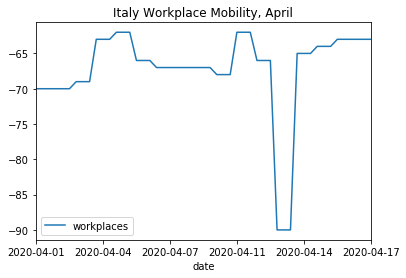

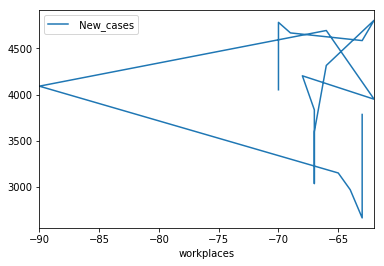

In [38]:
italy_april_df.plot("date", "workplaces", title="Italy Workplace Mobility, April")
italy_april_df.plot("workplaces", " New_cases")

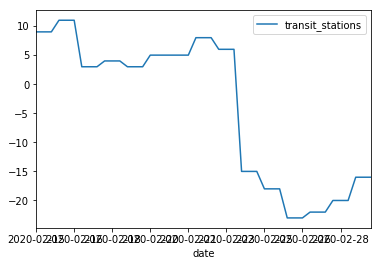

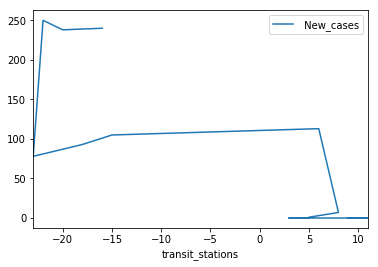

In [39]:
# Let's try with transit stations now.
italy_feb_df.plot("date", "transit_stations")
italy_feb_df.plot("transit_stations", " New_cases")

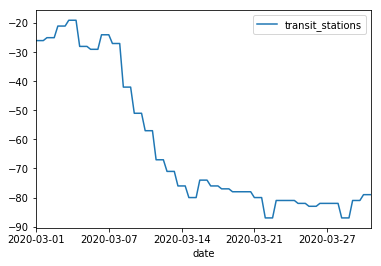

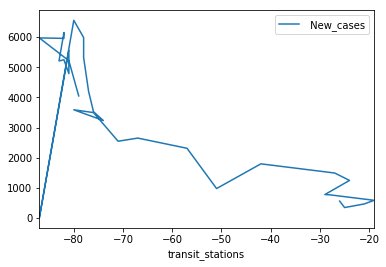

In [40]:
italy_march_df.plot("date", "transit_stations")
italy_march_df.plot("transit_stations", " New_cases")

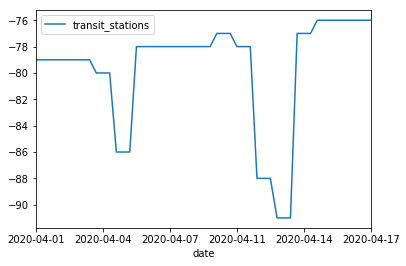

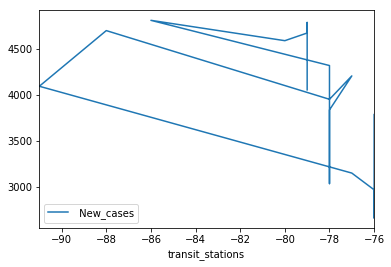

In [41]:
italy_april_df.plot("date", "transit_stations")
italy_april_df.plot("transit_stations", " New_cases")

In [42]:
# So far, I'm seeing the greatest correlation between mobility and new cases in Italy during the month of March (makes sense to me)

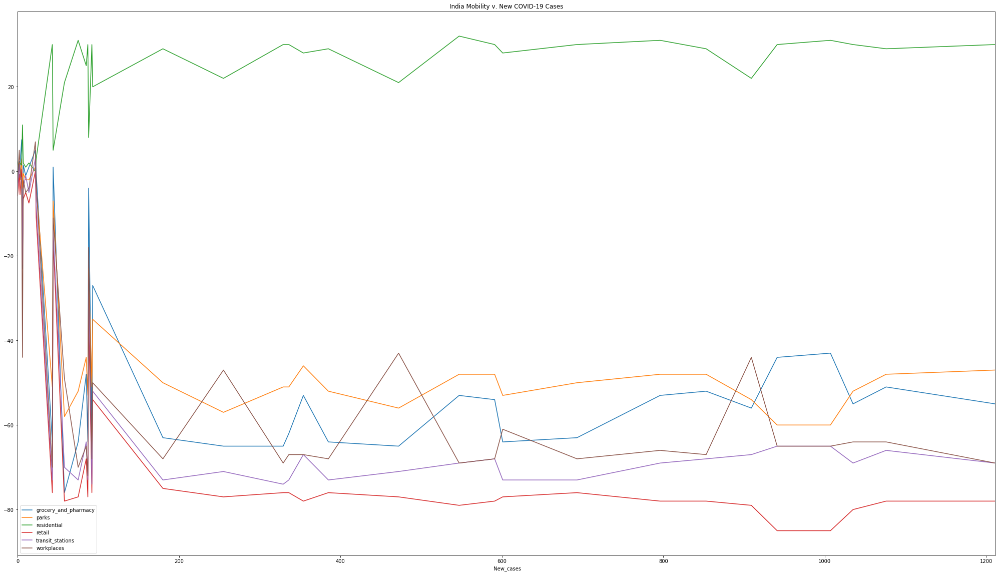

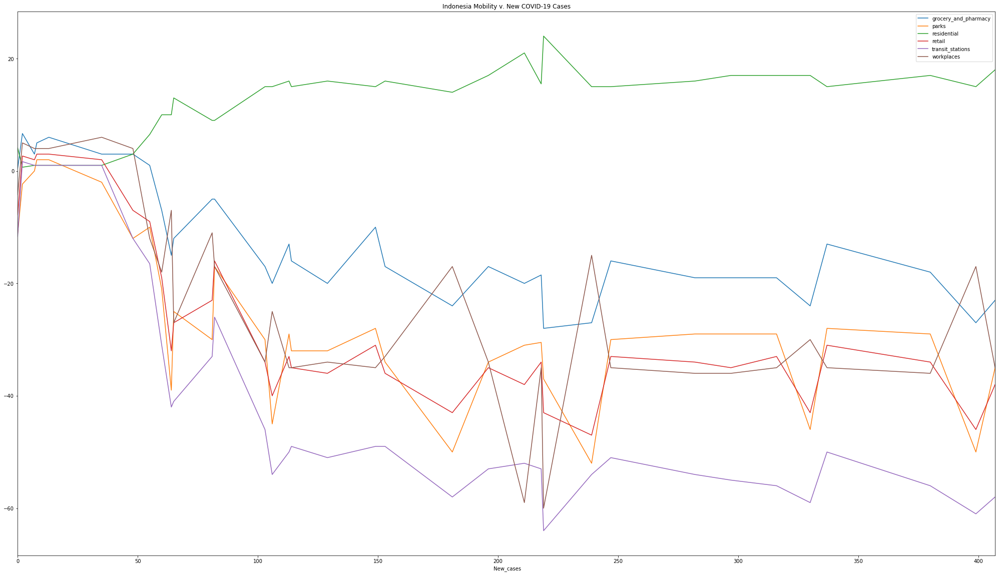

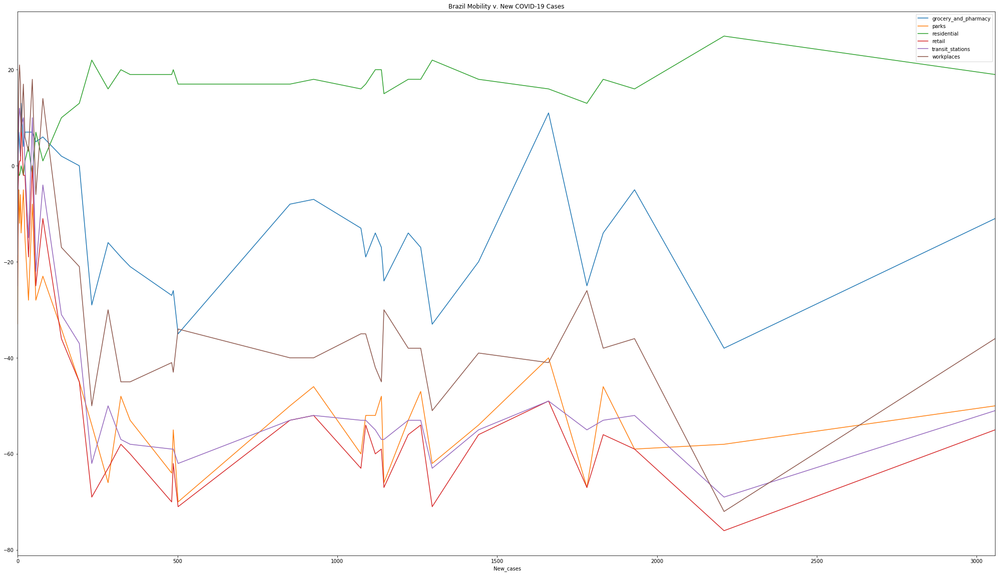

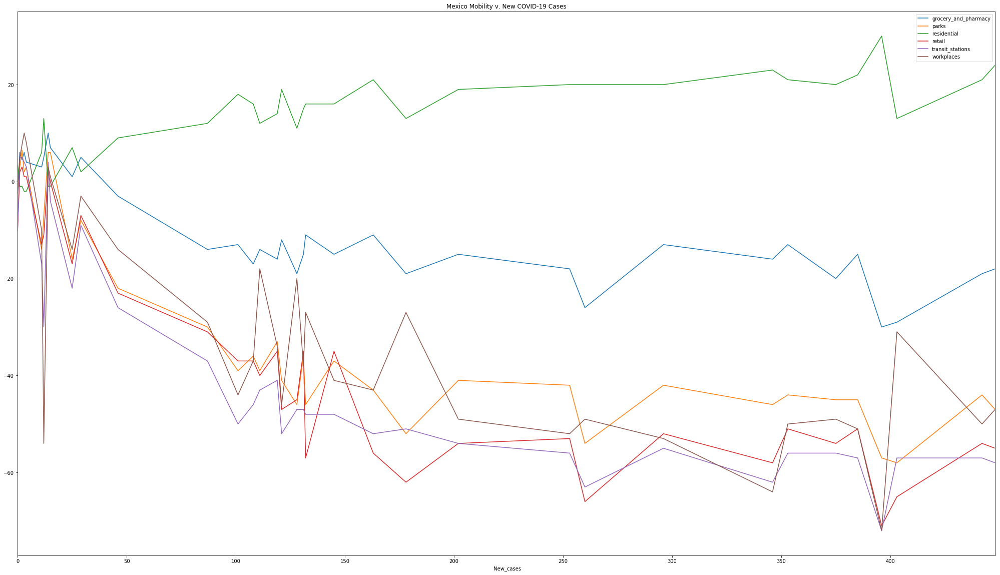

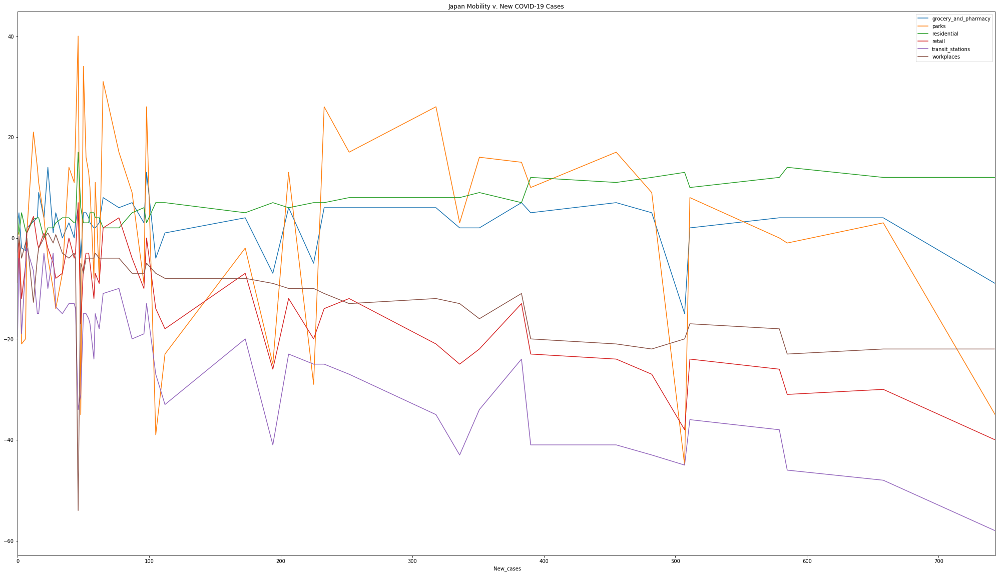

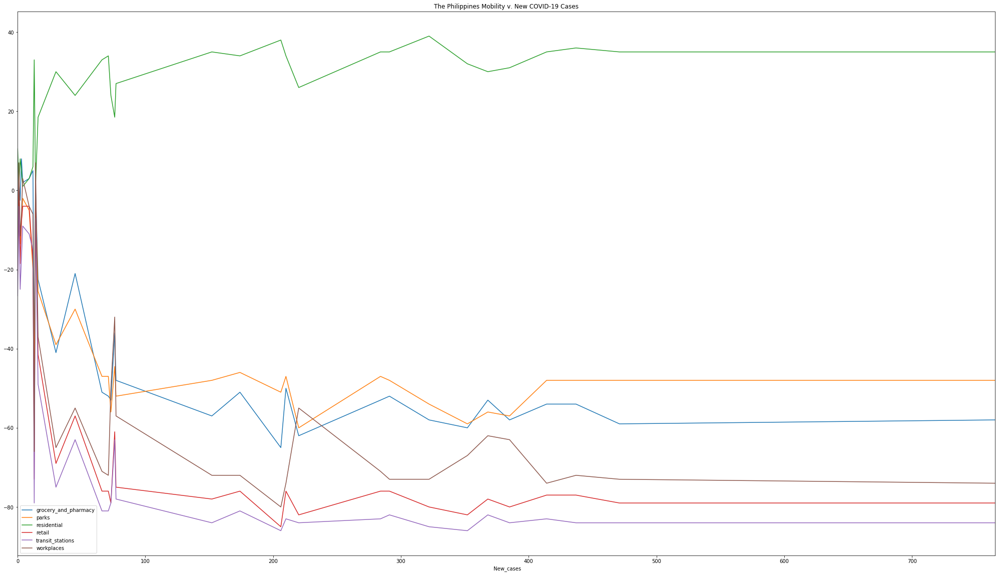

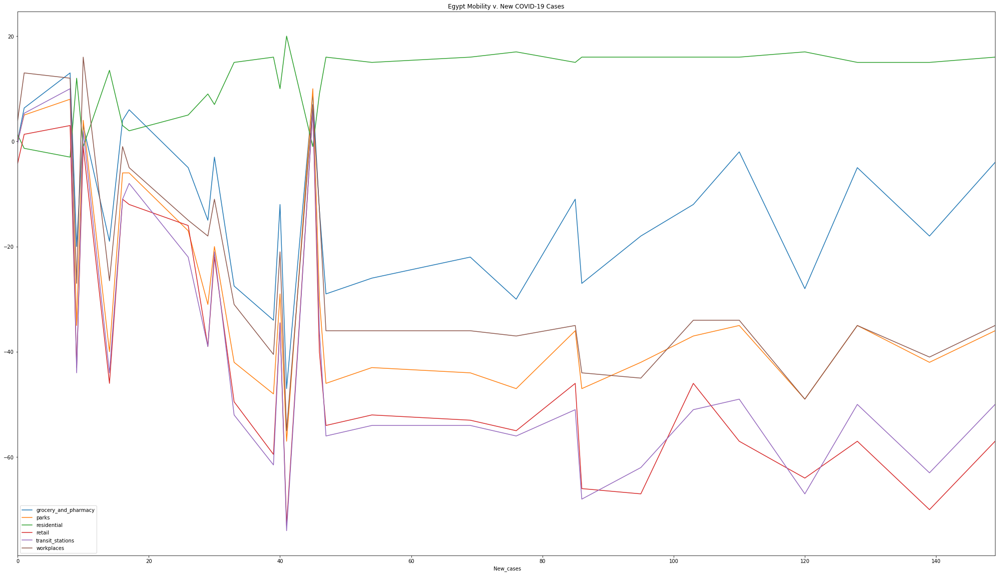

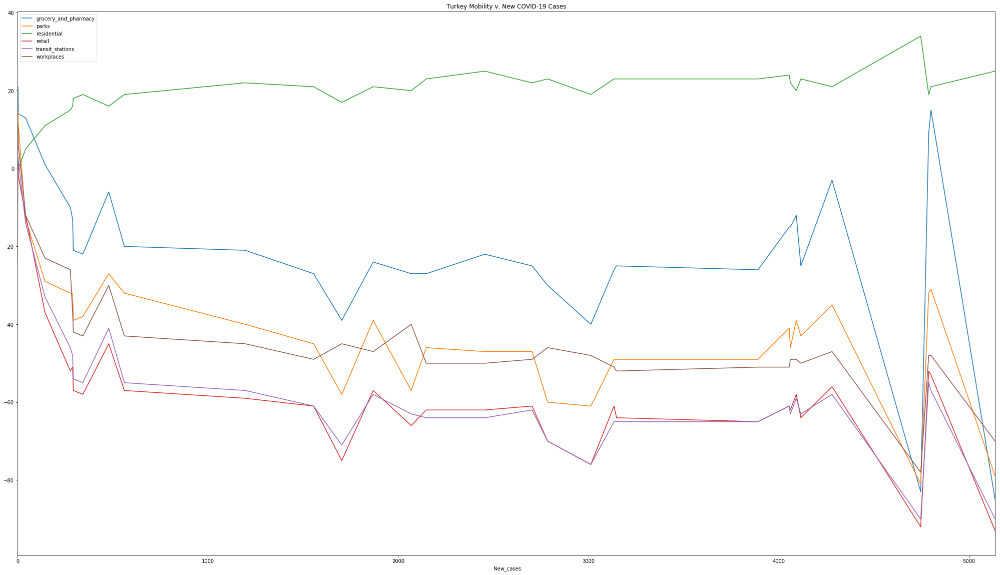

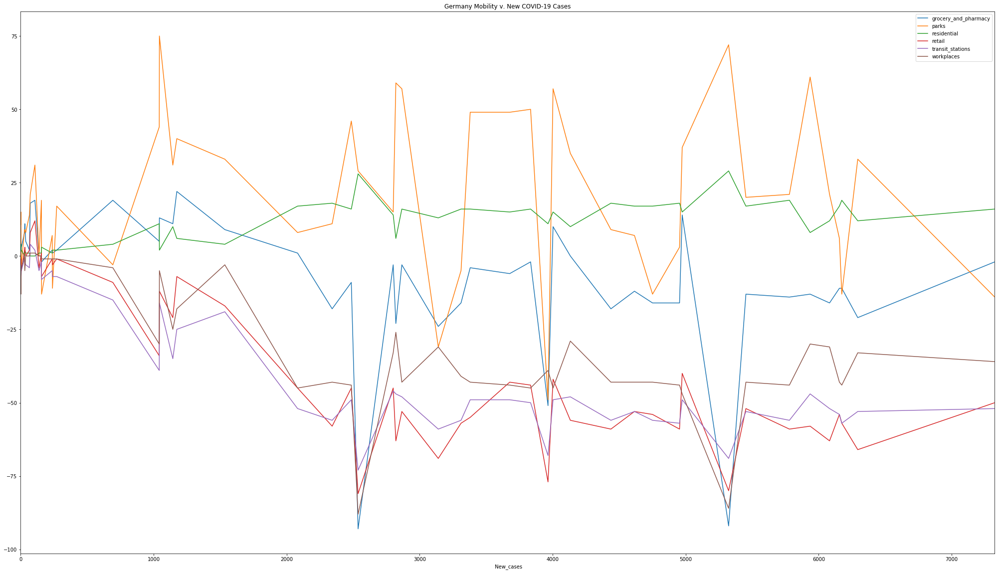

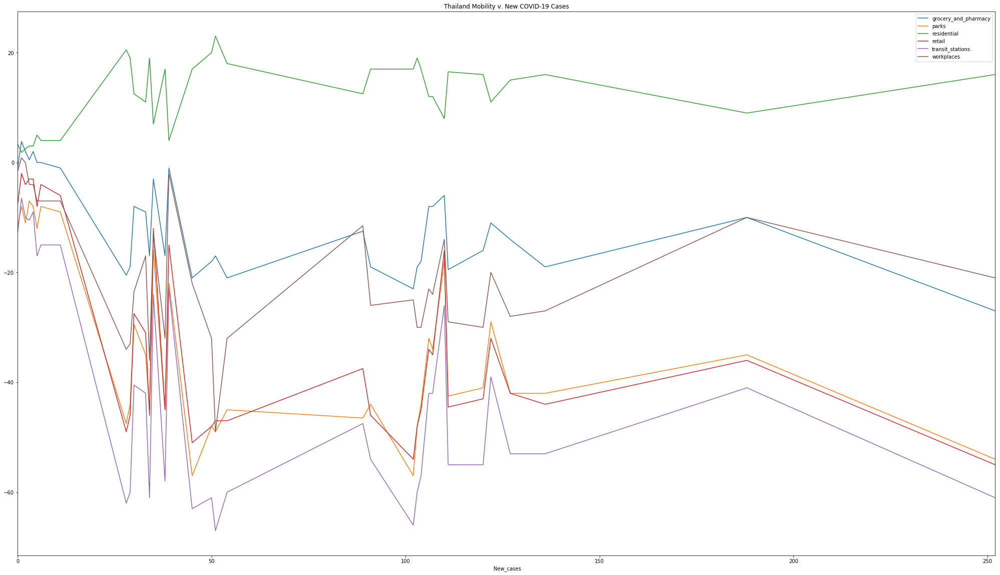

In [43]:
# Let's see if we can find any countries where mobility corresponds more clearly to new COVID infection rates
# We can check just the 10 largest countries in the dataset

india_df = mobility_df[mobility_df["country"].str.contains("India")]
# Let's format our dataframe the same way we did the earlier DF for all countries combined, but this time using cumulative cases instead of time
india_df = india_df.sort_index(level=[" New_cases"])
india_df = india_df.groupby([' New_cases']).mean()
# Let's remove the "value" column and COVID case/death columns so that we can just see the different modes of mobility
india_df = india_df[india_df.columns.difference(['value', " Cumulative_deaths", " Cumulative_cases", " New_deaths"])]

# Now, we repeat this process for each of the remaining top-10 countries
indonesia_df = mobility_df[mobility_df["country"].str.contains("Indonesia")]
indonesia_df = indonesia_df.sort_index(level=[" New_cases"])
indonesia_df = indonesia_df.groupby([' New_cases']).mean()
indonesia_df = indonesia_df[indonesia_df.columns.difference(['value', " Cumulative_deaths", " Cumulative_cases", " New_deaths"])]

brazil_df = mobility_df[mobility_df["country"].str.contains("Brazil")]
brazil_df = brazil_df.sort_index(level=[" New_cases"])
brazil_df = brazil_df.groupby([' New_cases']).mean()
brazil_df = brazil_df[brazil_df.columns.difference(['value', " Cumulative_deaths", " Cumulative_cases", " New_deaths"])]

mexico_df = mobility_df[mobility_df["country"].str.contains("Mexico")]
mexico_df = mexico_df.sort_index(level=[" New_cases"])
mexico_df = mexico_df.groupby([' New_cases']).mean()
mexico_df = mexico_df[mexico_df.columns.difference(['value', " Cumulative_deaths", " Cumulative_cases", " New_deaths"])]

japan_df = mobility_df[mobility_df["country"].str.contains("Japan")]
japan_df = japan_df.sort_index(level=[" New_cases"])
japan_df = japan_df.groupby([' New_cases']).mean()
japan_df = japan_df[japan_df.columns.difference(['value', " Cumulative_deaths", " Cumulative_cases", " New_deaths"])]

philippines_df = mobility_df[mobility_df["country"].str.contains("Philippines")]
philippines_df = philippines_df.sort_index(level=[" New_cases"])
philippines_df = philippines_df.groupby([' New_cases']).mean()
philippines_df = philippines_df[philippines_df.columns.difference(['value', " Cumulative_deaths", " Cumulative_cases", " New_deaths"])]

egypt_df = mobility_df[mobility_df["country"].str.contains("Egypt")]
egypt_df = egypt_df.sort_index(level=[" New_cases"])
egypt_df = egypt_df.groupby([' New_cases']).mean()
egypt_df = egypt_df[egypt_df.columns.difference(['value', " Cumulative_deaths", " Cumulative_cases", " New_deaths"])]

turkey_df = mobility_df[mobility_df["country"].str.contains("Turkey")]
turkey_df = turkey_df.sort_index(level=[" New_cases"])
turkey_df = turkey_df.groupby([' New_cases']).mean()
turkey_df = turkey_df[turkey_df.columns.difference(['value', " Cumulative_deaths", " Cumulative_cases", " New_deaths"])]

germany_df = mobility_df[mobility_df["country"].str.contains("Germany")]
germany_df = germany_df.sort_index(level=[" New_cases"])
germany_df = germany_df.groupby([' New_cases']).mean()
germany_df = germany_df[germany_df.columns.difference(['value', " Cumulative_deaths", " Cumulative_cases", " New_deaths"])]

thailand_df = mobility_df[mobility_df["country"].str.contains("Thailand")]
thailand_df = thailand_df.sort_index(level=[" New_cases"])
thailand_df = thailand_df.groupby([' New_cases']).mean()
thailand_df = thailand_df[thailand_df.columns.difference(['value', " Cumulative_deaths", " Cumulative_cases", " New_deaths"])]

# Finally, we can plot the data for these 10 countries
india_df.plot(figsize=(35,20), title="India Mobility v. New COVID-19 Cases")
indonesia_df.plot(figsize=(35,20), title="Indonesia Mobility v. New COVID-19 Cases")
brazil_df.plot(figsize=(35,20), title="Brazil Mobility v. New COVID-19 Cases")
mexico_df.plot(figsize=(35,20), title="Mexico Mobility v. New COVID-19 Cases")
japan_df.plot(figsize=(35,20), title="Japan Mobility v. New COVID-19 Cases")
philippines_df.plot(figsize=(35,20), title="The Philippines Mobility v. New COVID-19 Cases")
egypt_df.plot(figsize=(35,20), title="Egypt Mobility v. New COVID-19 Cases")
turkey_df.plot(figsize=(35,20), title="Turkey Mobility v. New COVID-19 Cases")
germany_df.plot(figsize=(35,20), title="Germany Mobility v. New COVID-19 Cases")
thailand_df.plot(figsize=(35,20), title="Thailand Mobility v. New COVID-19 Cases")


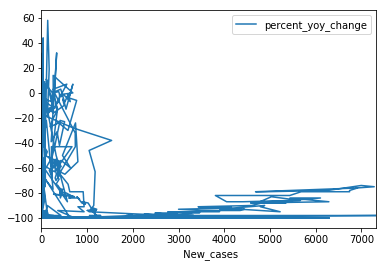

In [44]:
# Let's start out plotting correlation between restaurant performance and new cases of COVID-19
# Note that this is on a global scale (we can break it up by country later)
restaurant_df.plot(" New_cases", "percent_yoy_change")

Looks like restaurant performance was generally higher when the number of new cases in a given country was below 1,000. However, this could be due to mandatory restaurant closures at a certain date.

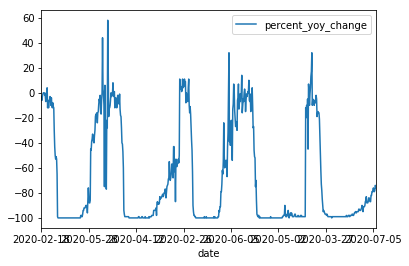

In [45]:
# Let's see how restaurant performace changed over time instead
restaurant_df.plot("date", "percent_yoy_change")

Now we get 5 spikes. I wonder if each spike reflects restaurant closures in each of the 5 countries included in the dataset? Let's look at the countries individually.

In [46]:
# Let's break this up into 5 dataframes, one for each country
aus_df = restaurant_df[restaurant_df["country"].str.contains("Australia")]
can_df = restaurant_df[restaurant_df["country"].str.contains("Canada")]
ger_df = restaurant_df[restaurant_df["country"].str.contains("Germany")]
ire_df = restaurant_df[restaurant_df["country"].str.contains("Ireland")]
mex_df = restaurant_df[restaurant_df["country"].str.contains("Mexico")]

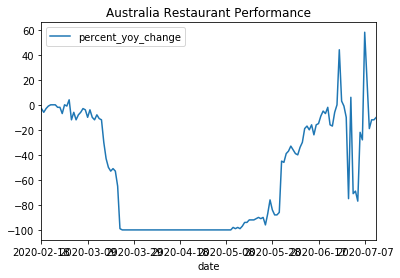

In [47]:
# Now, let's see how restaurant performance changed over time in each individual country

aus_df.plot("date", "percent_yoy_change", title="Australia Restaurant Performance")

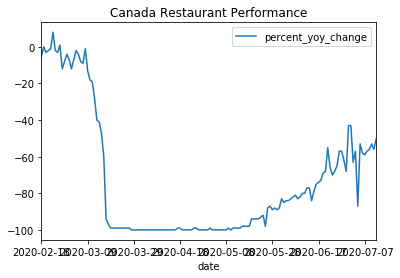

In [48]:
can_df.plot("date", "percent_yoy_change", title="Canada Restaurant Performance")

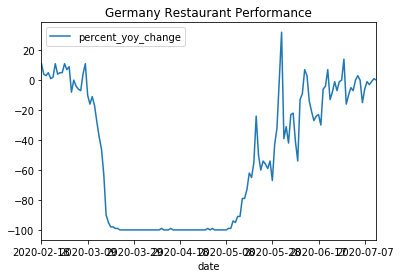

In [49]:
ger_df.plot("date", "percent_yoy_change", title="Germany Restaurant Performance")

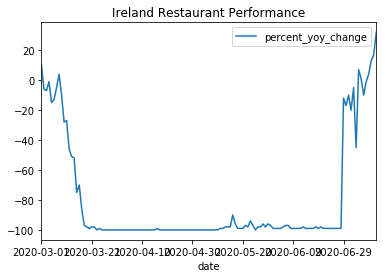

In [50]:
ire_df.plot("date", "percent_yoy_change", title="Ireland Restaurant Performance")

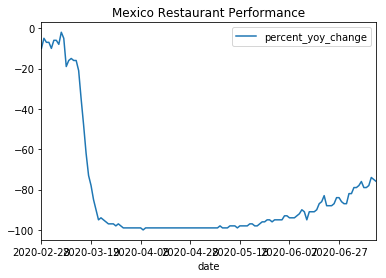

In [51]:
mex_df.plot("date", "percent_yoy_change", title="Mexico Restaurant Performance")

In these plots, we can see high performance on earlier dates, followed by a steep decline (presumably due to mandatory restaurant closures), a low plateau, and then an increase at later dates (possibly due to restaurant reopenings, or maybe increasing business through alternative avenues like takeout).

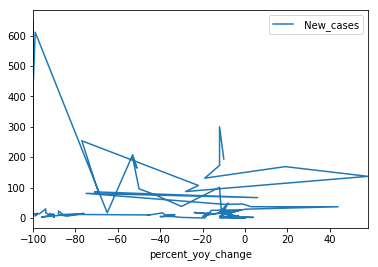

In [52]:
# Now, let's see if these dips in restaurant performance (possibly due to mandatory closures) had any correlation with the number of new COVID cases in each individual country

aus_df.plot("percent_yoy_change", " New_cases")

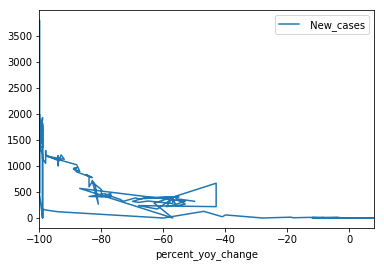

In [53]:
can_df.plot("percent_yoy_change", " New_cases")

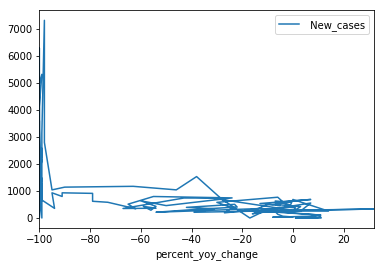

In [54]:
ger_df.plot("percent_yoy_change", " New_cases")

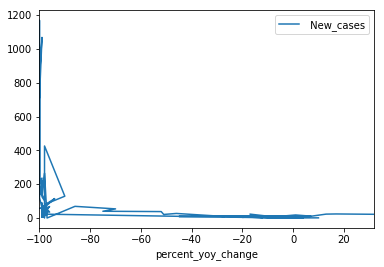

In [55]:
ire_df.plot("percent_yoy_change", " New_cases")

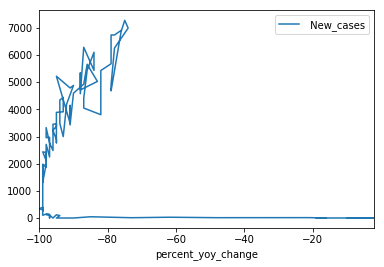

In [56]:
mex_df.plot("percent_yoy_change", " New_cases")

Interestingly, the number of new cases seems to decrease as restaurant business increases. This is most likely due to the fact that restaurants closed when new case rates were high, and then slowly reopened as new case numbers began to decrease. Let's try looking at total cases instead.

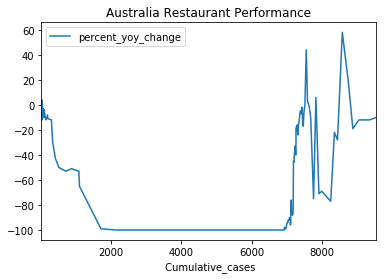

In [57]:
aus_df.plot(" Cumulative_cases", "percent_yoy_change", title="Australia Restaurant Performance")

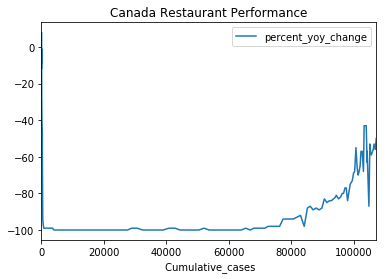

In [58]:
can_df.plot(" Cumulative_cases", "percent_yoy_change", title="Canada Restaurant Performance")

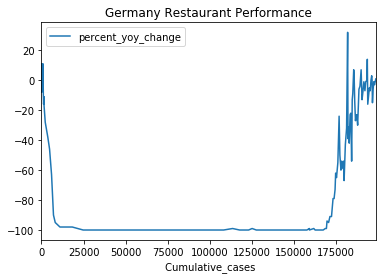

In [59]:
ger_df.plot(" Cumulative_cases", "percent_yoy_change", title="Germany Restaurant Performance")

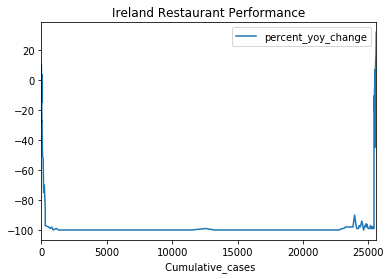

In [60]:
ire_df.plot(" Cumulative_cases", "percent_yoy_change", title="Ireland Restaurant Performance")

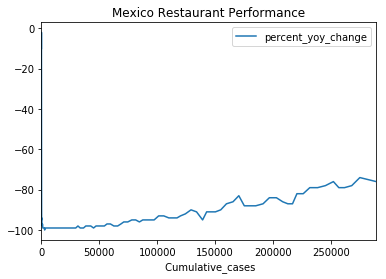

In [61]:
mex_df.plot(" Cumulative_cases", "percent_yoy_change", title="Mexico Restaurant Performance")

The above plots all have similar shapes. This is unsurprising, as restaurant business was best when cumulative cases were very low (before the worst of the pandemic and mandatory closures) and when cumulative cases were at their highest (towards the end of the worst of the pandemic, when restaurants were allowed to reopen).

[]

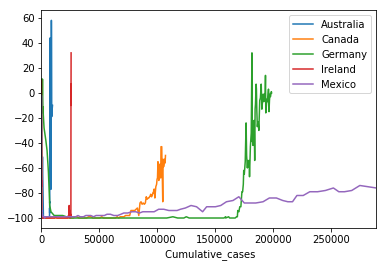

In [62]:
# Let's compare individual countries with respect to cumulative cases and restaurant performance change
ax = aus_df.plot(" Cumulative_cases", "percent_yoy_change")
ax = can_df.plot(" Cumulative_cases", "percent_yoy_change", ax=ax)
ax = ger_df.plot(" Cumulative_cases", "percent_yoy_change", ax=ax)
ax = ire_df.plot(" Cumulative_cases", "percent_yoy_change", ax=ax)
ax = mex_df.plot(" Cumulative_cases", "percent_yoy_change", ax=ax)

ax.legend(['Australia', 'Canada', 'Germany', 'Ireland', 'Mexico'])
ax.plot(figsize=(60,40))

[]

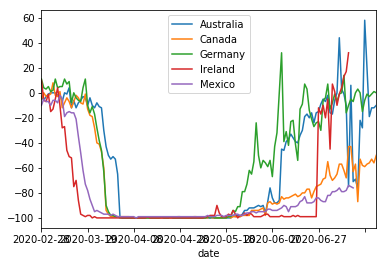

In [63]:
# And now a time series comparison between the countries
ax = aus_df.plot("date", "percent_yoy_change")
ax = can_df.plot("date", "percent_yoy_change", ax=ax)
ax = ger_df.plot("date", "percent_yoy_change", ax=ax)
ax = ire_df.plot("date", "percent_yoy_change", ax=ax)
ax = mex_df.plot("date", "percent_yoy_change", ax=ax)

ax.legend(['Australia', 'Canada', 'Germany', 'Ireland', 'Mexico'])
ax.plot(figsize=(60,40))

[]

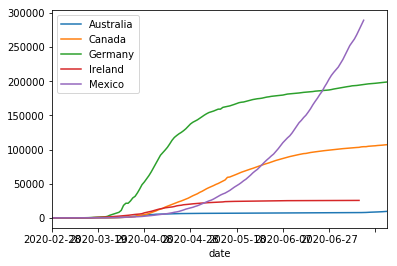

In [64]:
# Now, let's compare cumulative cases across the countries over time
ax = aus_df.plot("date", " Cumulative_cases")
ax = can_df.plot("date", " Cumulative_cases", ax=ax)
ax = ger_df.plot("date", " Cumulative_cases", ax=ax)
ax = ire_df.plot("date", " Cumulative_cases", ax=ax)
ax = mex_df.plot("date", " Cumulative_cases", ax=ax)

ax.legend(['Australia', 'Canada', 'Germany', 'Ireland', 'Mexico'])
ax.plot(figsize=(60,40))

# Mobility/Restaurant Data (Domestic)

In [65]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}


<IPython.core.display.Javascript object>

In [66]:
plt.rcParams.update({'figure.max_open_warning': 0})

In [67]:
cases = pd.read_csv("data/us-states.csv")
cases['date'] = cases['date'].astype('datetime64[ns]') 
cases = cases.drop(["fips"], axis=1)
cases = cases.dropna()
cases

,date,state,cases,deaths
0,2020-01-21,Washington,1,0
1,2020-01-22,Washington,1,0
2,2020-01-23,Washington,1,0
3,2020-01-24,Illinois,1,0
4,2020-01-24,Washington,1,0
5,2020-01-25,California,1,0
6,2020-01-25,Illinois,1,0
7,2020-01-25,Washington,1,0
8,2020-01-26,Arizona,1,0
9,2020-01-26,California,2,0


In [68]:
mob = pd.read_csv("data/Global_Mobility_Report.csv", names=['country_region_code', 'country', 'state', 'sub_region_2','iso_3166_2_code',
                                                            'census_fips_code', 'date', 'retail_recreation', 'grocery_pharmacy', 'parks',
                                                            'transit', 'workplaces', 'residential'], low_memory=False)
mobility = mob.loc[mob['country'] == 'United States']
mobility = mobility.drop(['country_region_code', 'census_fips_code', 'iso_3166_2_code', 'country', 'sub_region_2'], axis=1)
mobility = mobility.dropna()
mobility['date'] = mobility['date'].astype('datetime64[ns]') 
mobility = mobility.reset_index().drop(['index'], axis=1)
mobility.describe()

,state,date,retail_recreation,grocery_pharmacy,parks,transit,workplaces,residential
count,75701,75701,75701,75701,75701,75701,75701,75701
unique,51,149,146,139,514,192,111,45
top,California,2020-02-21 00:00:00,4,1,6,2,2,0
freq,5577,604,1360,2735,805,1405,3136,5125
first,NaN,2020-02-15 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN
last,NaN,2020-07-12 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN


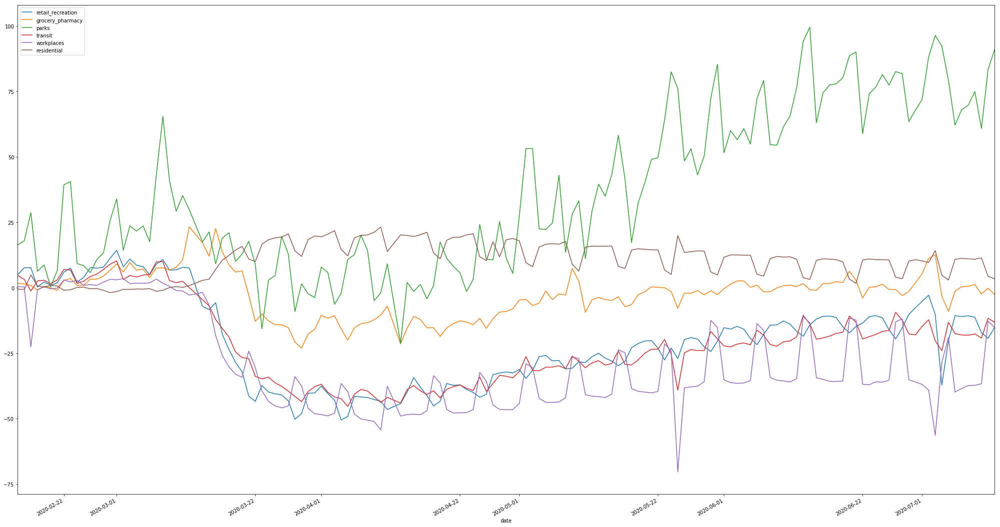

In [69]:
# Visualize the mobility data over time
mob_date = mobility.sort_index(level=['date'])
mob_date['retail_recreation'] = mob_date['retail_recreation'].astype('double') 
mob_date['grocery_pharmacy'] = mob_date['grocery_pharmacy'].astype('double') 
mob_date['parks'] = mob_date['parks'].astype('double') 
mob_date['transit'] = mob_date['transit'].astype('double') 
mob_date['workplaces'] = mob_date['workplaces'].astype('double') 
mob_date['residential'] = mob_date['residential'].astype('double') 
mob_date = mob_date.groupby(['date']).mean()
# Remove any outliers
z_scores = zscore(mob_date)
abs_z_scores = np.abs(z_scores)
filtered_entries = (abs_z_scores < 3).all(axis=1)
mob_date = mob_date[filtered_entries]
# Plot the overall change in mobility over time
mob_date.plot(figsize=(35,20))

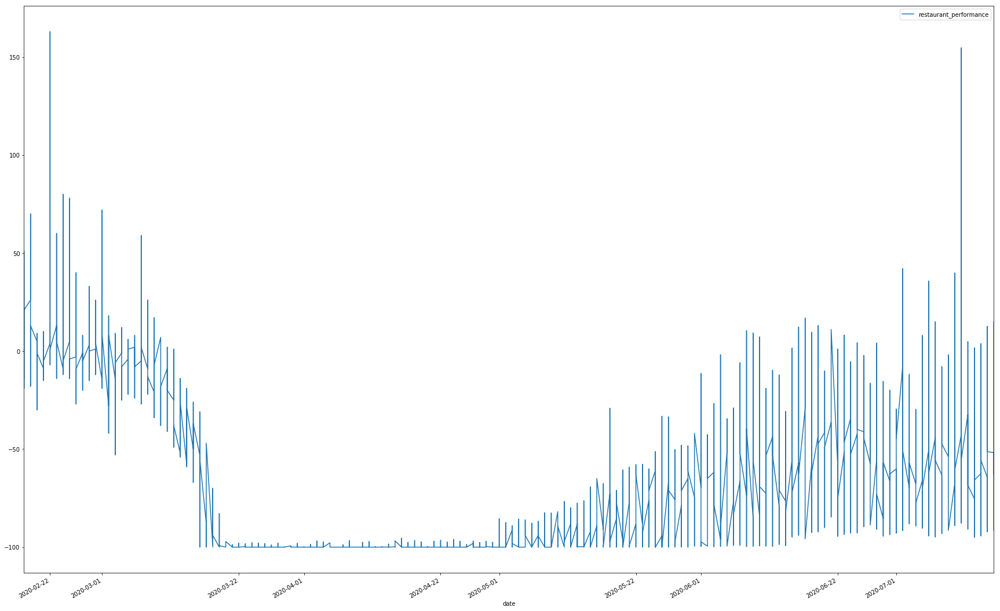

In [70]:
# Restaurant data
rest = pd.read_csv("data/YoY_Seated_Diner_Data.csv")
restaurants = rest[8:57]
restaurants = restaurants.drop([11, 12, 28, 36, 45, 46, 47, 39, 42, 9, 22, 53])
restaurants = restaurants.reset_index().drop(['index', 'Type'], axis=1)
restaurants = restaurants.melt(id_vars=["Name"], var_name="date", value_name="restaurant_performance")
restaurants = restaurants.sort_values(['Name', 'date'], ascending=[True, True])
def add_year(date_in_some_format):
    date_as_string = str(date_in_some_format)
    new_date = date_as_string + '/2020'
    return new_date
restaurants['date'] = restaurants['date'].apply(add_year)
restaurants['date'] = restaurants['date'].astype('datetime64[ns]') 
restaurants = restaurants.rename({'Name':'state'}, axis='columns')
restaurants.plot(x='date', y='restaurant_performance', figsize=(30,20))

In [71]:
restaurants.describe()

,restaurant_performance
count,5550.000000
mean,-68.545553
std,36.498080
min,-100.000000
25%,-100.000000
50%,-81.080000
75%,-49.007500
max,163.000000


In [72]:
# Merge the movbility, case and restaurant data
all_data = pd.merge(mobility, cases, on=["state", "date"], how="left")
all_data = all_data.dropna()
all_data = pd.merge(all_data, restaurants, on=["state", "date"], how="left")
all_data = all_data.dropna()
all_data = all_data.reset_index().drop(['index'], axis=1)
all_data['date'] = all_data['date'].astype('datetime64[ns]') 

all_data['retail_recreation'] = all_data['retail_recreation'].astype('int') 
all_data['grocery_pharmacy'] = all_data['grocery_pharmacy'].astype('int') 
all_data['parks'] = all_data['parks'].astype('int') 
all_data['transit'] = all_data['transit'].astype('int') 
all_data['workplaces'] = all_data['workplaces'].astype('int') 
all_data['residential'] = all_data['residential'].astype('int') 

all_data_new = all_data.copy()

# Print
all_data

,state,date,retail_recreation,grocery_pharmacy,parks,transit,workplaces,residential,cases,deaths,restaurant_performance
0,Alabama,2020-03-13,7,32,26,7,-2,0,6.0,0.0,-24.00
1,Alabama,2020-03-14,1,28,55,12,4,0,12.0,0.0,-28.00
2,Alabama,2020-03-15,-7,16,16,6,-4,2,23.0,0.0,-38.00
3,Alabama,2020-03-16,-2,24,22,2,-10,4,29.0,0.0,-57.00
4,Alabama,2020-03-17,-11,17,25,-1,-17,7,39.0,0.0,-74.00
5,Alabama,2020-03-18,-13,13,39,-3,-22,8,51.0,0.0,-78.00
6,Alabama,2020-03-19,-20,15,27,-8,-25,10,78.0,0.0,-96.77
7,Alabama,2020-03-20,-27,10,7,-14,-29,14,106.0,0.0,-100.00
8,Alabama,2020-03-21,-35,5,10,-13,-16,8,131.0,0.0,-100.00
9,Alabama,2020-03-22,-40,-7,2,-22,-27,9,157.0,0.0,-100.00


In [73]:
all_normalized = all_data.copy()

all_normalized['cases_diff'] = (all_normalized.groupby('date')['cases'].apply(pd.Series.pct_change))

# Normalize the values

scaler = preprocessing.StandardScaler()
all_normalized[['cases', 'deaths', 'restaurant_performance', 'retail_recreation', 'grocery_pharmacy', 'parks', 'transit', 'workplaces', 'residential', 'cases', 'deaths', 'restaurant_performance']] = scaler.fit_transform(all_normalized[['cases', 'deaths', 'restaurant_performance', 'retail_recreation', 'grocery_pharmacy', 'parks', 'transit', 'workplaces', 'residential', 'cases', 'deaths', 'restaurant_performance']])

#drop Nan values
all_normalized = all_normalized.replace([np.inf, -np.inf], np.nan)
all_normalized = all_normalized.dropna()

all_normalized = all_normalized.groupby(['date']).mean()
#all_normalized = all_normalized.loc[all_normalized['cases'] > -0.5]
all_normalized

,retail_recreation,grocery_pharmacy,parks,transit,workplaces,residential,cases,deaths,restaurant_performance,cases_diff
date,,,,,,,,,,
2020-02-18,1.283461,0.280434,-0.280377,1.172683,1.808925,-1.539870,-0.617300,-0.458610,2.493814,0.086108
2020-02-19,1.299567,0.288020,-0.337517,1.129320,1.856543,-1.550126,-0.617299,-0.458610,2.556566,0.085519
2020-02-20,1.334336,0.320521,-0.353005,1.129598,1.827480,-1.532035,-0.617295,-0.458610,2.544220,0.098848
2020-02-21,1.348272,0.273682,-0.306777,1.184425,1.871607,-1.590621,-0.617285,-0.458610,2.450074,0.101562
2020-02-22,1.486680,0.453104,-0.065465,1.201621,1.980912,-1.687321,-0.617284,-0.458610,2.647127,0.109542
2020-02-23,1.640029,0.515321,-0.049337,1.261562,1.968618,-1.675852,-0.617284,-0.458610,2.722611,0.115307
2020-02-24,1.370758,0.429771,-0.294880,1.104315,2.087964,-1.645881,-0.617250,-0.458610,2.471395,0.128276
2020-02-25,1.433415,0.378990,-0.248552,1.150720,1.986538,-1.634892,-0.617256,-0.458610,2.570777,0.149678
2020-02-26,1.620922,0.552107,-0.290068,1.214174,1.964996,-1.684627,-0.617204,-0.458610,2.462273,0.246053


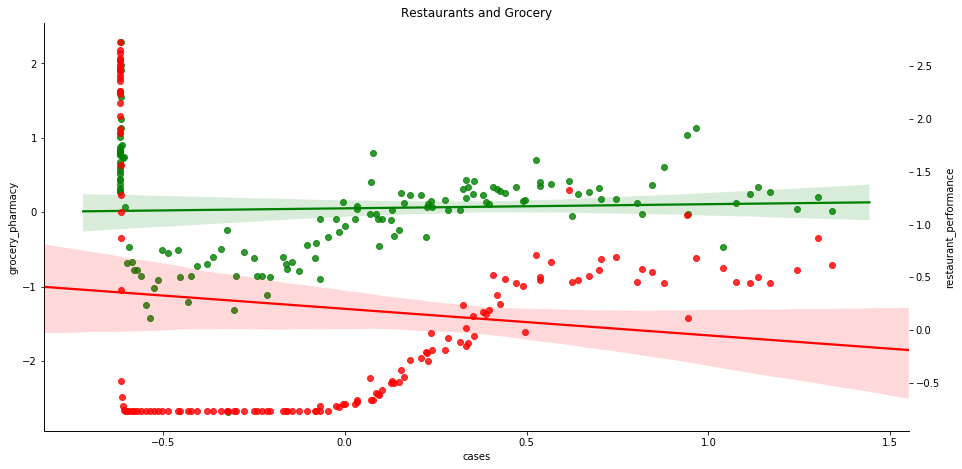

In [74]:
# Plot the relationship between number of cases and restaurant performance and grocery/pharmacy mobility
fig, ax = plt.subplots()
fig.set_size_inches(15.5, 7.5)
sns.regplot(all_normalized['cases'], all_normalized['grocery_pharmacy'], ax=ax, color='g')
ax2 = ax.twinx()
sns.regplot(all_normalized['cases'], all_normalized['restaurant_performance'], ax=ax2, color='r').set_title('Restaurants and Grocery')
sns.despine()

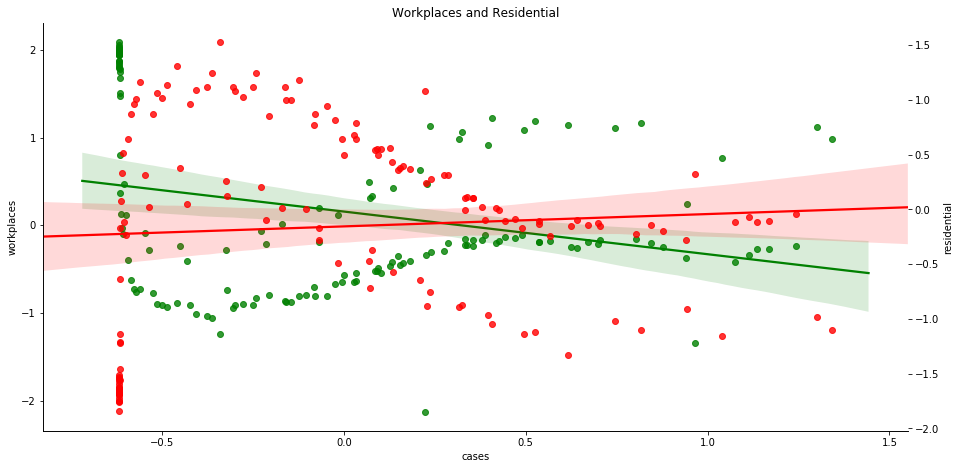

In [75]:
# Plot the relationship between number of cases and workplaces and residential mobility
fig, ax = plt.subplots()
fig.set_size_inches(15.5, 7.5)
sns.regplot(all_normalized['cases'], all_normalized['workplaces'], ax=ax, color='g')
ax2 = ax.twinx()
sns.regplot(all_normalized['cases'], all_normalized['residential'], ax=ax2, color='r').set_title('Workplaces and Residential')
sns.despine()

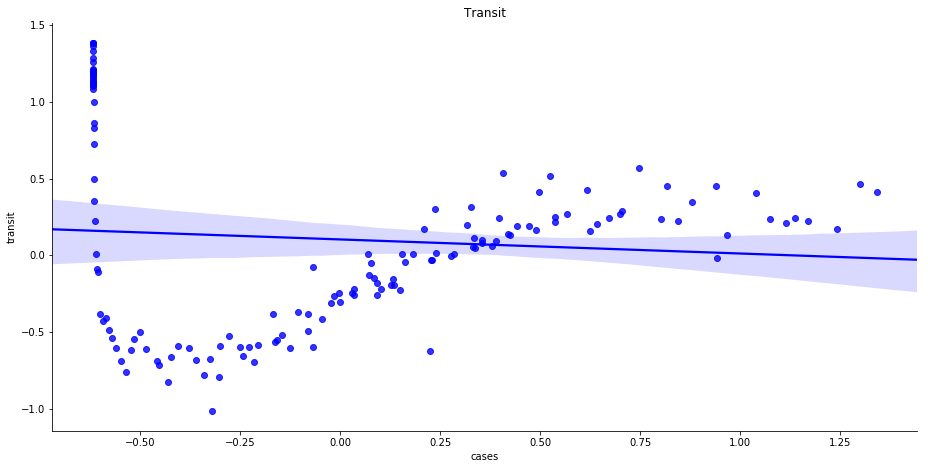

In [76]:
# Plot the relationship between number of cases and transit mobility
fig, ax = plt.subplots()
fig.set_size_inches(15.5, 7.5)
sns.regplot(all_normalized['cases'], all_normalized['transit'], ax=ax, color='b').set_title('Transit')
sns.despine()

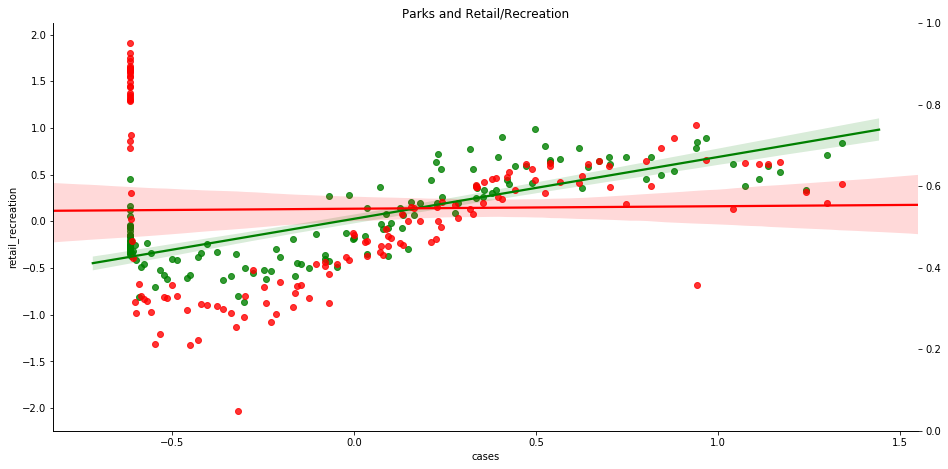

In [77]:
# Plot the relationship between number of cases and parks and retail/recreation mobility
fig, ax = plt.subplots()
fig.set_size_inches(15.5, 7.5)
sns.regplot(all_normalized['cases'], all_normalized['parks'], ax=ax, color='g')
ax2 = ax.twinx()
sns.regplot(all_normalized['cases'], all_normalized['retail_recreation'], ax=ax, color='r').set_title('Parks and Retail/Recreation')
sns.despine()

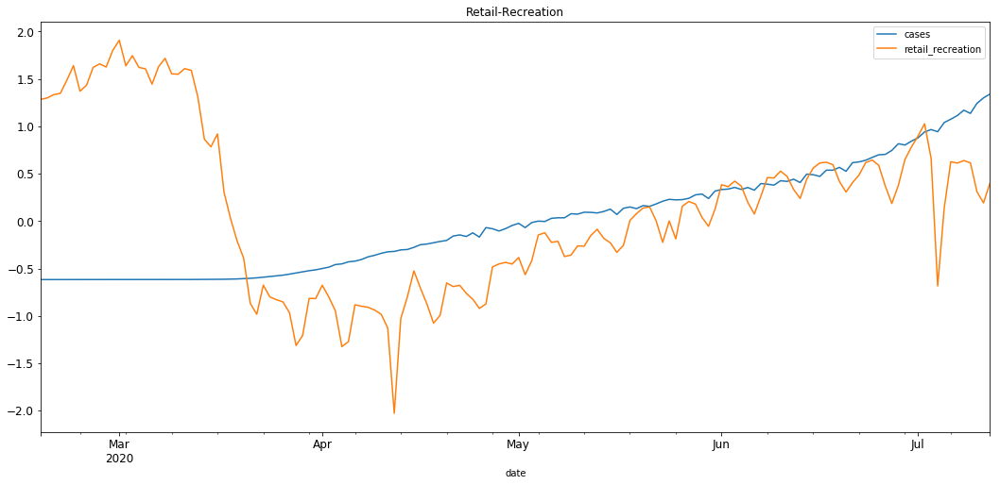

In [78]:
all_normalized.reset_index().plot(x='date', y=['cases', 'retail_recreation'], figsize=(18,8), fontsize=12, title="Retail-Recreation")

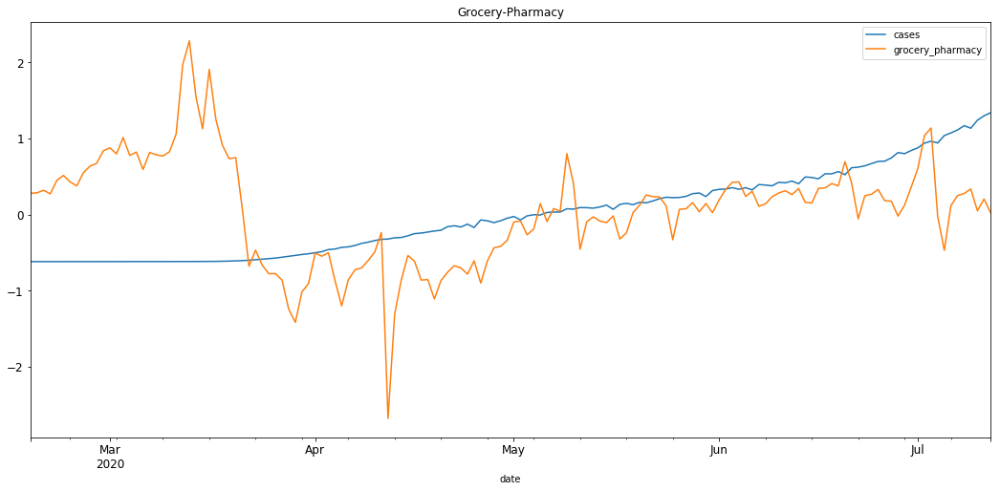

In [79]:
all_normalized.reset_index().plot(x='date', y=['cases', 'grocery_pharmacy'], figsize=(18,8), fontsize=12, title="Grocery-Pharmacy")

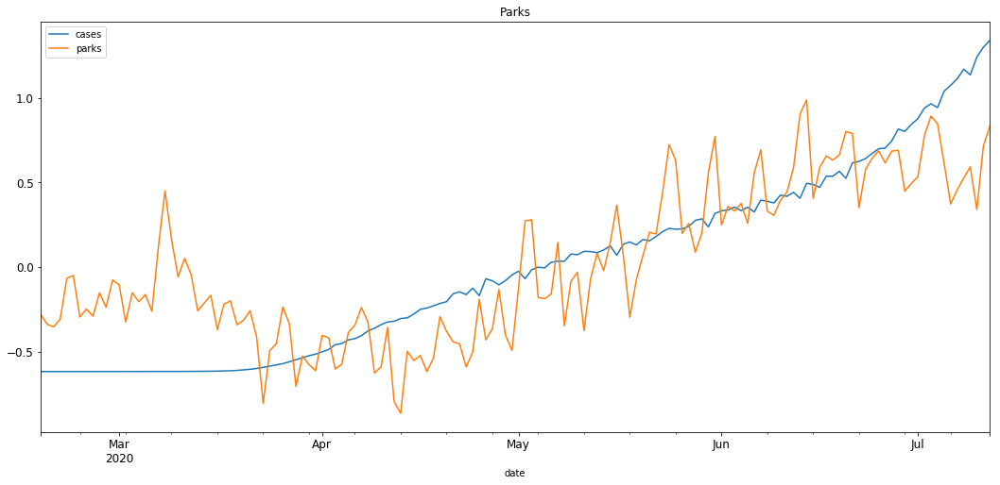

In [80]:
all_normalized.reset_index().plot(x='date', y=['cases', 'parks'], figsize=(18,8), fontsize=12, title="Parks")

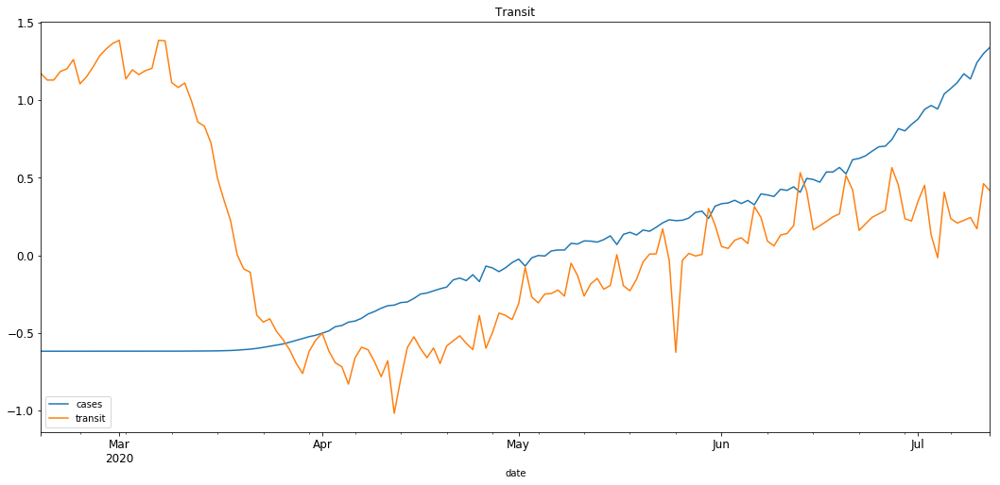

In [81]:
all_normalized.reset_index().plot(x='date', y=['cases', 'transit'], figsize=(18,8), fontsize=12, title="Transit")

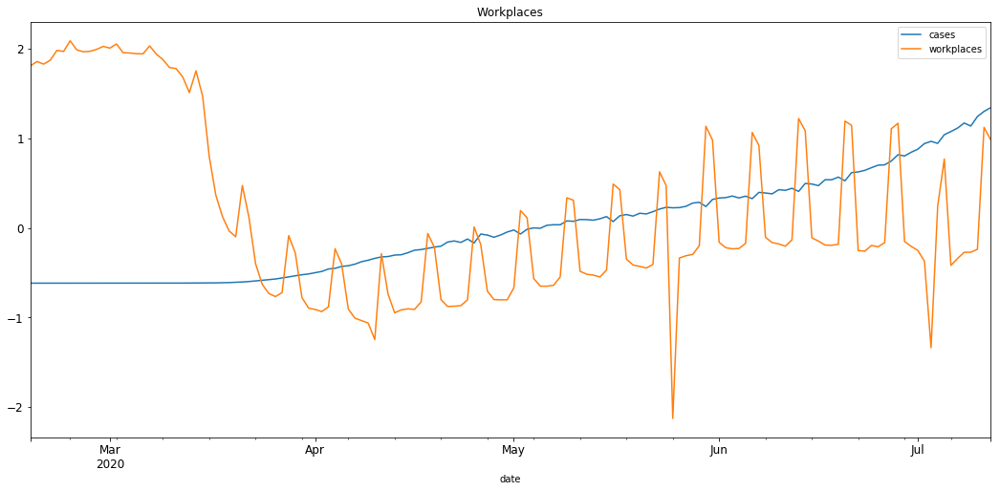

In [82]:
all_normalized.reset_index().plot(x='date', y=['cases', 'workplaces'], figsize=(18,8), fontsize=12, title="Workplaces")

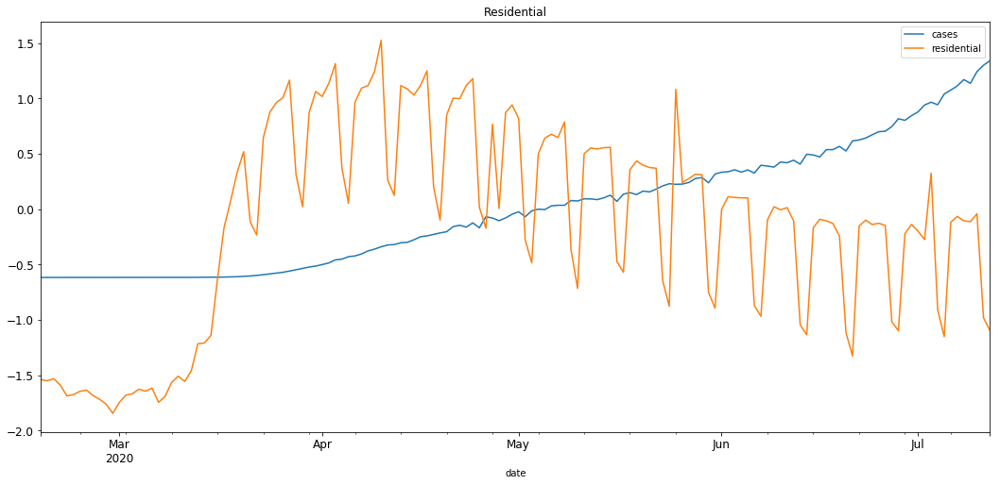

In [83]:
all_normalized.reset_index().plot(x='date', y=['cases', 'residential'], figsize=(18,8), fontsize=12, title="Residential")

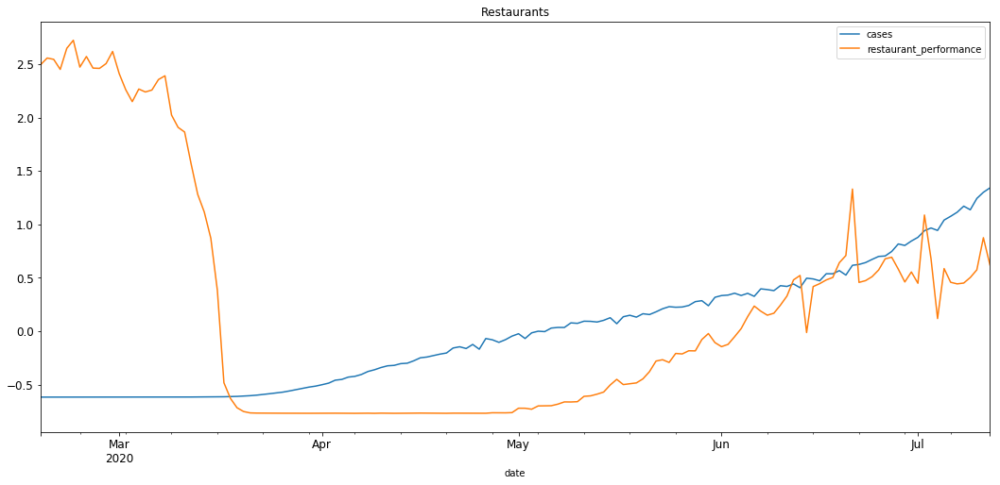

In [84]:
all_normalized.reset_index().plot(x='date', y=['cases', 'restaurant_performance'], figsize=(18,8), fontsize=12, title="Restaurants")

In [85]:
#All Data by state
# Create new dataframe from the percent change in mobility in each area and group by state
change = all_data_new.sort_index(level=['state', 'date'])

change['diff_cases'] = (change.groupby('state')['cases'].apply(pd.Series.diff))

#drop Nan values
change = change.replace([np.inf, -np.inf], np.nan)
change = change.dropna()

change['retail_recreation'] = change['retail_recreation'].astype(int)
change['grocery_pharmacy'] = change['grocery_pharmacy'].astype(int)
change['parks'] = change['parks'].astype(int)
change['transit'] = change['transit'].astype(int)
change['workplaces'] = change['workplaces'].astype(int)
change['residential'] = change['residential'].astype(int)

state = change.groupby(['state']).mean()

state = state.sort_values(['diff_cases'])
state

,retail_recreation,grocery_pharmacy,parks,transit,workplaces,residential,cases,deaths,restaurant_performance,diff_cases
state,,,,,,,,,,
Hawaii,-43.011609,-23.976783,-48.620232,-62.908789,-35.747927,14.431177,548.081260,11.943615,-89.583682,1.990050
Oregon,-19.145726,-0.141136,50.118761,-20.030407,-30.682157,9.322433,3344.050488,101.717728,-78.748290,3.090075
Ohio,-23.394988,-1.938544,80.799523,-15.900955,-34.437947,12.047733,21651.952864,1201.014916,-80.849797,5.431981
Maryland,-28.569112,-11.598456,54.080309,-35.928185,-39.963707,16.210039,28731.347490,1353.592278,-85.688278,5.938996
New Mexico,-21.941176,3.764706,11.664799,-23.900093,-33.004669,11.751634,5527.202614,229.229692,-83.717535,14.028011
Kentucky,-22.298507,2.334992,52.414594,-20.936982,-34.126036,11.709784,6160.822554,260.202322,-77.959386,16.064677
Washington,-18.758506,-0.407469,54.171784,-17.663900,-30.486307,9.756017,14243.557261,654.699170,-76.814282,17.502075
California,-30.258778,-4.725494,5.504755,-28.161668,-31.020483,11.820227,78726.008778,2462.528164,-74.256525,19.574982
Georgia,-18.457043,-1.129089,17.661579,-23.830789,-31.781073,11.164850,31831.810292,1260.059747,-75.705648,21.054514


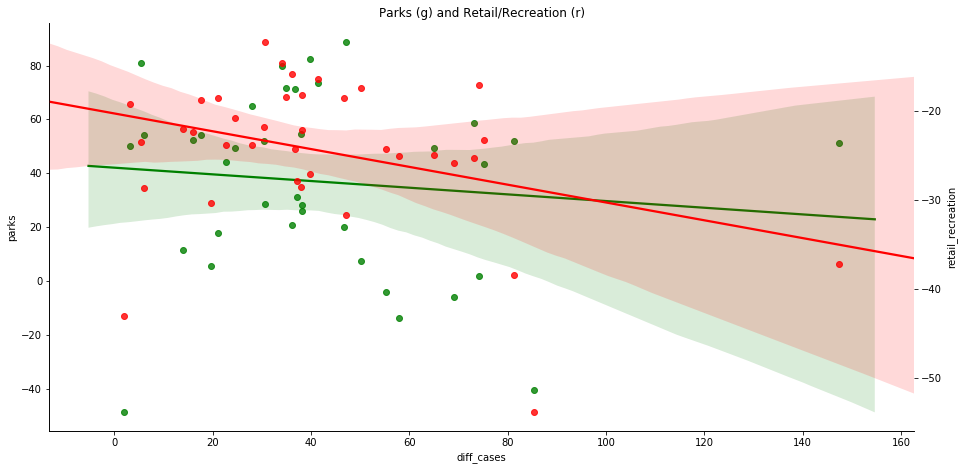

In [86]:
# Plot the relationship between number of cases and parks and retail/recreation mobility
fig, ax = plt.subplots()
fig.set_size_inches(15.5, 7.5)
sns.regplot(state['diff_cases'], state['parks'], ax=ax, color='g')
ax2 = ax.twinx()
sns.regplot(state['diff_cases'], state['retail_recreation'], ax=ax2, color='r').set_title('Parks (g) and Retail/Recreation (r)')
sns.despine()

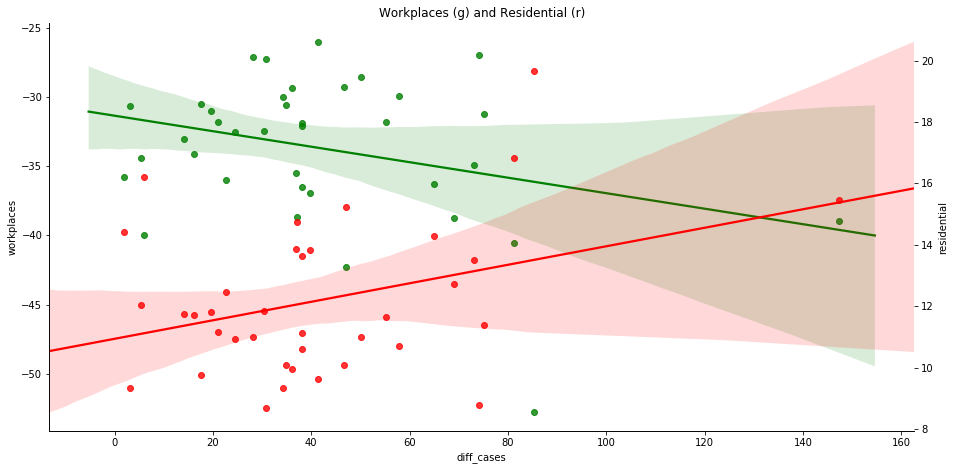

In [87]:
# Plot the relationship between number of cases and workplaces and residential mobility
fig, ax = plt.subplots()
fig.set_size_inches(15.5, 7.5)
sns.regplot(state['diff_cases'], state['workplaces'], ax=ax, color='g')
ax2 = ax.twinx()
sns.regplot(state['diff_cases'], state['residential'], ax=ax2, color='r').set_title('Workplaces (g) and Residential (r)')
sns.despine()

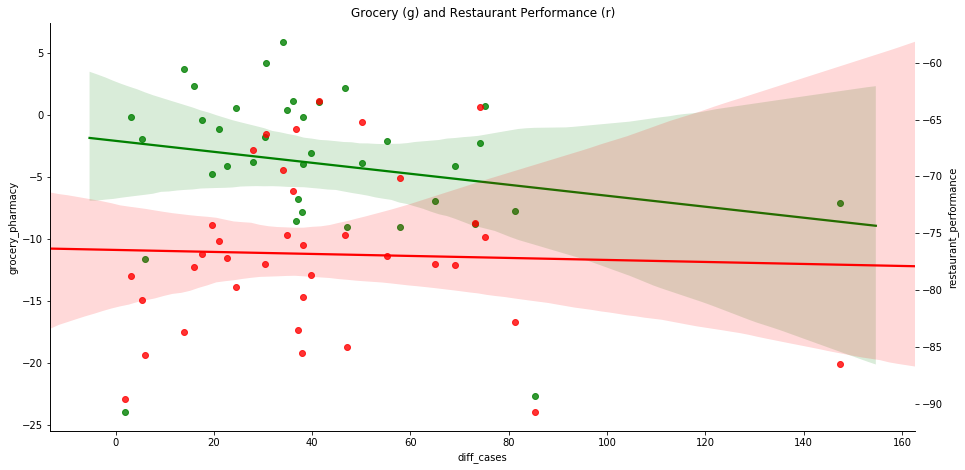

In [88]:
# Plot the relationship between number of cases and parks and retail/recreation mobility
fig, ax = plt.subplots()
fig.set_size_inches(15.5, 7.5)
sns.regplot(state['diff_cases'], state['grocery_pharmacy'], ax=ax, color='g')
ax2 = ax.twinx()
sns.regplot(state['diff_cases'], state['restaurant_performance'], ax=ax2, color='r').set_title('Grocery (g) and Restaurant Performance (r)')
sns.despine()

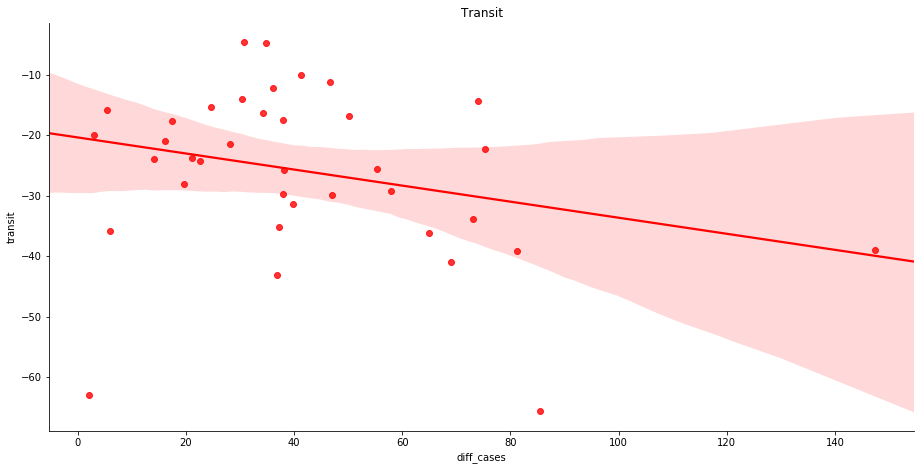

In [89]:
# Plot the relationship between number of cases and parks and retail/recreation mobility
fig, ax = plt.subplots()
fig.set_size_inches(15.5, 7.5)
sns.regplot(state['diff_cases'], state['transit'], ax=ax, color='r').set_title('Transit')
sns.despine()

In [90]:
# Create new dataframe from the percent change in mobility in each area and group by state
change = all_data_new.sort_index(level=['state', 'date'])

change['retail_recreation'] = change['retail_recreation'].astype(int)
change['grocery_pharmacy'] = change['grocery_pharmacy'].astype(int)
change['parks'] = change['parks'].astype(int)
change['transit'] = change['transit'].astype(int)
change['workplaces'] = change['workplaces'].astype(int)
change['residential'] = change['residential'].astype(int)

change['pct_ch_rec'] = (change.groupby('state')['retail_recreation'].apply(pd.Series.pct_change))
change['pct_ch_groc'] = (change.groupby('state')['grocery_pharmacy'].apply(pd.Series.pct_change))
change['pct_ch_parks'] = (change.groupby('state')['parks'].apply(pd.Series.pct_change))
change['pct_ch_transit'] = (change.groupby('state')['transit'].apply(pd.Series.pct_change))
change['pct_ch_work'] = (change.groupby('state')['workplaces'].apply(pd.Series.pct_change))
change['pct_ch_residential'] = (change.groupby('state')['residential'].apply(pd.Series.pct_change))
change['pct_ch_rest'] = (change.groupby('state')['restaurant_performance'].apply(pd.Series.pct_change))
change['pct_ch_cases'] = (change.groupby('state')['cases'].apply(pd.Series.pct_change))

#drop Nan values
change = change.replace([np.inf, -np.inf], np.nan)
change = change.dropna()

date_norm = change.groupby(['state']).mean()

date_norm = date_norm.drop(['cases', 'deaths', 'restaurant_performance'], axis=1)

date_norm  = date_norm.sort_values(['pct_ch_cases'])

date_norm

,retail_recreation,grocery_pharmacy,parks,transit,workplaces,residential,pct_ch_rec,pct_ch_groc,pct_ch_parks,pct_ch_transit,pct_ch_work,pct_ch_residential,pct_ch_rest,pct_ch_cases
state,,,,,,,,,,,,,,
Hawaii,-44.913194,-25.180556,-50.798611,-65.626736,-37.362847,15.041667,0.028645,0.023504,0.082991,-0.017249,0.035083,0.048946,0.013587,0.061123
District of Columbia,-56.545455,-24.107438,-43.214876,-68.595041,-55.157025,20.553719,0.018593,0.052138,0.386738,0.015155,0.080710,0.120525,0.006007,0.064354
Nebraska,-17.509934,0.865342,74.982340,-10.708609,-27.059603,10.064018,0.045233,-0.568611,-0.319389,-0.078857,0.135880,0.131469,-1.018203,0.064665
Washington,-21.419308,-1.186840,54.231988,-20.239193,-33.161864,10.692123,0.071370,-0.102238,0.018537,-0.080737,0.045408,0.105404,-0.057370,0.075155
California,-33.529277,-5.847051,3.734945,-31.057929,-34.087727,13.008127,0.034879,-0.015338,-0.130100,-0.066874,0.085459,0.058904,-0.005226,0.076138
Oregon,-21.124679,-0.930591,49.273136,-21.830334,-32.569409,9.977506,0.003022,-0.006196,-0.225703,0.039258,0.041260,0.067272,-0.002264,0.081859
Illinois,-26.220705,-0.501138,44.436291,-25.232082,-34.479522,12.618316,0.064178,-0.263651,-0.446133,-0.081791,0.092537,0.169491,-0.137003,0.089177
Arizona,-19.544077,-3.375344,0.398760,-16.654270,-29.425620,9.642562,-0.045870,0.028968,-0.025976,-0.025499,0.013811,0.032001,-0.002061,0.089547
Massachusetts,-28.615958,-10.283371,61.702461,-37.565250,-38.413870,14.894109,0.018180,-0.066325,-0.497316,-0.129188,0.095195,0.115392,-0.242940,0.102691


# Airports/International Travel and Stocks

### Airport Traffic

In [91]:
traffic = pd.read_csv('data/airlines_travel/airport-traffic.csv', sep= ',', header= None)

# a summary of the airport traffic file
traffic.head()

,0,1,2,3,4,5,6,7,8,9,10
0,aggregationmethod,date,version,airportname,percentofbaseline,centroid,city,state,iso_3166_2,country,geography
1,Daily,2020-03-31,1,Boston Logan International,71,POINT (-71.0102909977 42.3636330377),Boston,Massachusetts,US-MA,United States of America (the),"POLYGON ((-71.005089283 42.3472534333, -71.003..."
2,Daily,2020-03-31,1,Calgary International,91,POINT (-114.013122872 51.1184753728),Calgary,Alberta,CA-AB,Canada,"POLYGON ((-113.981866837 51.1392131914, -113.9..."
3,Daily,2020-03-31,1,Charlotte Douglas International,81,POINT (-80.9478114283 35.2136892261),Charlotte,North Carolina,US-NC,United States of America (the),"POLYGON ((-80.9332966805 35.2337368341, -80.94..."
4,Daily,2020-03-31,1,Chicago OHare International,77,POINT (-87.910595204 41.9804600429),Chicago,Illinois,US-IL,United States of America (the),"POLYGON ((-87.9397845268 41.9608463705, -87.93..."


In [92]:
new_header = traffic.iloc[0] 
traffic = traffic[1:]
traffic.columns = new_header 
traffic.head()

,aggregationmethod,date,version,airportname,percentofbaseline,centroid,city,state,iso_3166_2,country,geography
1,Daily,2020-03-31,1,Boston Logan International,71,POINT (-71.0102909977 42.3636330377),Boston,Massachusetts,US-MA,United States of America (the),"POLYGON ((-71.005089283 42.3472534333, -71.003..."
2,Daily,2020-03-31,1,Calgary International,91,POINT (-114.013122872 51.1184753728),Calgary,Alberta,CA-AB,Canada,"POLYGON ((-113.981866837 51.1392131914, -113.9..."
3,Daily,2020-03-31,1,Charlotte Douglas International,81,POINT (-80.9478114283 35.2136892261),Charlotte,North Carolina,US-NC,United States of America (the),"POLYGON ((-80.9332966805 35.2337368341, -80.94..."
4,Daily,2020-03-31,1,Chicago OHare International,77,POINT (-87.910595204 41.9804600429),Chicago,Illinois,US-IL,United States of America (the),"POLYGON ((-87.9397845268 41.9608463705, -87.93..."
5,Daily,2020-03-31,1,Dallas/Fort Worth International,68,POINT (-97.0394983969 32.8940590356),Grapevine,Texas,US-TX,United States of America (the),"POLYGON ((-97.0429444313 32.9265900261, -97.04..."


In [93]:
traffic.shape

(50, 11)

In [94]:
traffic.describe(include = 'all')

,aggregationmethod,date,version,airportname,percentofbaseline,centroid,city,state,iso_3166_2,country,geography
count,50,50,50,50,50,50,50,50,50,50,50
unique,1,2,1,26,33,26,25,21,21,2,26
top,Daily,2020-03-31,1,Montreal Trudeau,57,POINT (-104.700315559 39.8643468206),New York,Alberta,CA-ON,United States of America (the),"POLYGON ((-123.136525154 49.1980971491, -123.1..."
freq,50,26,50,2,3,2,4,4,4,33,2


In [95]:
traffic["airportname"].value_counts()

Montreal Trudeau                            2
Seattle-Tacoma International                2
Detroit Metropolitan Wayne County           2
Vancouver International                     2
San Francisco International                 2
Edmonton International                      2
Hamilton International                      2
Boston Logan International                  2
Miami International                         2
Calgary International                       2
LaGuardia                                   2
John F. Kennedy International               2
Dallas/Fort Worth International             2
Los Angeles International                   2
Denver International                        2
Hartsfield-Jackson Atlanta International    2
Charlotte Douglas International             2
Montreal Mirabel                            2
Newark Liberty International                2
McCarran International                      2
Chicago OHare International                 2
Toronto Pearson                   

In [96]:
traffic["date"].value_counts()

2020-03-31    26
2020-03-30    24
Name: date, dtype: int64

In [97]:
taffic = traffic.sort_values(by=['percentofbaseline'], inplace=True, ascending=False)
traffic.head()

,aggregationmethod,date,version,airportname,percentofbaseline,centroid,city,state,iso_3166_2,country,geography
26,Daily,2020-03-31,1,Winnipeg International,98,POINT (-97.2190621862 49.9024712566),Winnipeg,Manitoba,CA-MB,Canada,"POLYGON ((-97.2094345093 49.8979517851, -97.20..."
37,Daily,2020-03-30,1,Hamilton International,98,POINT (-79.9266930702 43.1720360845),Hamilton,Ontario,CA-ON,Canada,"POLYGON ((-79.9327468872 43.1551600162, -79.93..."
6,Daily,2020-03-31,1,Daniel K. Inouye International,92,POINT (-157.918285205 21.3259652489),Urban Honolulu,Hawaii,US-HI,United States of America (the),"POLYGON ((-157.926621437 21.3389395548, -157.9..."
2,Daily,2020-03-31,1,Calgary International,91,POINT (-114.013122872 51.1184753728),Calgary,Alberta,CA-AB,Canada,"POLYGON ((-113.981866837 51.1392131914, -113.9..."
50,Daily,2020-03-30,1,Vancouver International,89,POINT (-123.177541243 49.1935788601),Richmond,British Columbia,CA-BC,Canada,"POLYGON ((-123.136525154 49.1980971491, -123.1..."


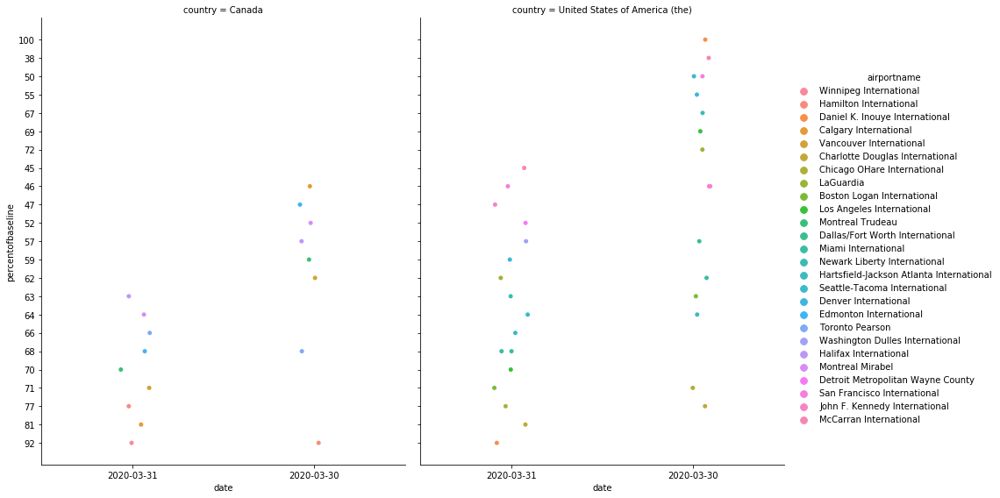

In [98]:
ax = sns.catplot(x="date", y="percentofbaseline", hue="airportname", col="country", data=traffic, 
                 height=8, aspect=.8)

C:\Users\nic_v\Anaconda3\lib\site-packages\seaborn\categorical.py:1243: RuntimeWarning: invalid value encountered in sqrt
  dx = np.sqrt(d ** 2 - dy ** 2) * 1.05


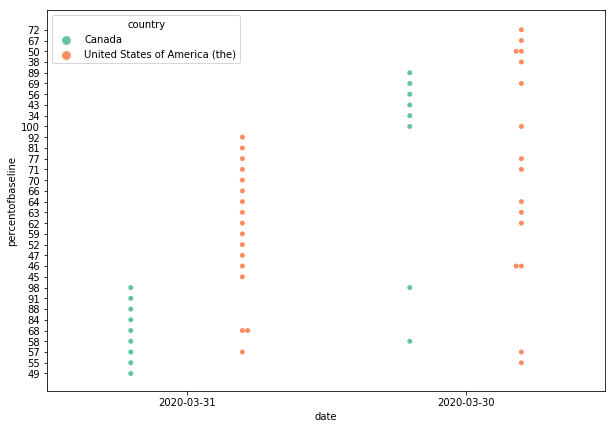

In [99]:
fig_dims = (10, 7)
fig, ax = plt.subplots(figsize=fig_dims)
ax = sns.swarmplot(x="date", y="percentofbaseline", hue="country",
                    data=traffic, palette="Set2", dodge=True)

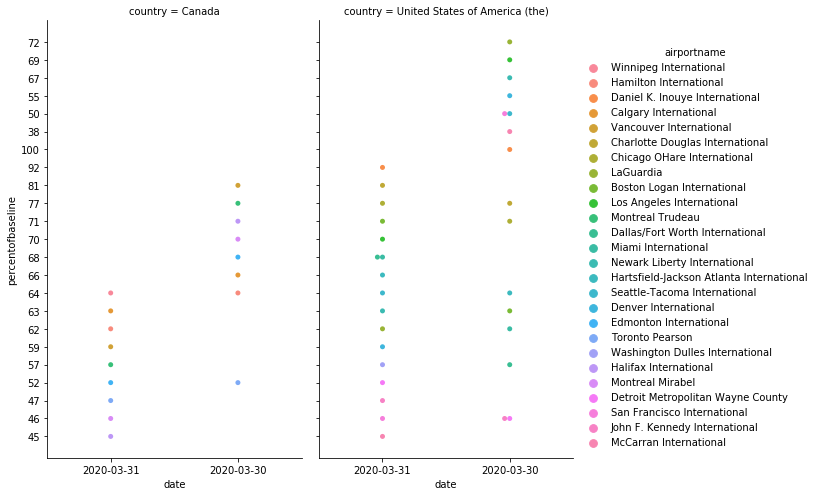

In [100]:
ax = sns.catplot(x="date", y="percentofbaseline",
                 hue="airportname", col="country",
                 data=traffic, kind="swarm",
                 height=7, aspect=.6);

### Airport Stock Data

##### American Airlines

In [101]:
american_air = pd.read_csv('data/airlines_travel/AAL.csv', sep= ',', header= None)

# a summary of the travel restrictions file
american_air.head()

,0,1,2,3,4,5,6
0,Date,Open,High,Low,Close,Adj Close,Volume
1,2019-06-26,31.480000,31.719999,31.070000,31.459999,31.133385,4089700
2,2019-06-27,31.559999,32.549999,31.420000,32.150002,31.816221,4274500
3,2019-06-28,32.230000,32.730000,32.160000,32.610001,32.271446,5238500
4,2019-07-01,33.139999,33.660000,32.529999,32.880001,32.538643,8985600


In [102]:
new_header = american_air.iloc[0] 
american_air = american_air[1:]
american_air.columns = new_header 
american_air.head()

,Date,Open,High,Low,Close,Adj Close,Volume
1,2019-06-26,31.480000,31.719999,31.070000,31.459999,31.133385,4089700
2,2019-06-27,31.559999,32.549999,31.420000,32.150002,31.816221,4274500
3,2019-06-28,32.230000,32.730000,32.160000,32.610001,32.271446,5238500
4,2019-07-01,33.139999,33.660000,32.529999,32.880001,32.538643,8985600
5,2019-07-02,33.090000,33.209999,32.029999,32.189999,31.855806,4765100


In [103]:
american_air.dtypes

0
Date         object
Open         object
High         object
Low          object
Close        object
Adj Close    object
Volume       object
dtype: object

In [104]:
american_air["Volume"] = american_air["Volume"].astype(str).astype(int)
american_air["Open"] = american_air["Open"].astype(str).astype(float)
american_air["High"] = american_air["High"].astype(str).astype(float)
american_air["Low"] = american_air["Low"].astype(str).astype(float)
american_air["Close"] = american_air["Close"].astype(str).astype(float)
american_air.dtypes

0
Date          object
Open         float64
High         float64
Low          float64
Close        float64
Adj Close     object
Volume         int32
dtype: object

In [105]:
american_air = american_air[~american_air.Date.str.contains('2019')]
american_air['Month'] = pd.DatetimeIndex(american_air['Date']).month
american_air['Day'] = pd.DatetimeIndex(american_air['Date']).day
american_air.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Month,Day
132,2020-01-02,28.980000,29.299999,28.650000,29.090000,28.982893,6451100,1,2
133,2020-01-03,28.270000,28.290001,27.340000,27.650000,27.548195,14008900,1,3
134,2020-01-06,27.190001,27.490000,27.080000,27.320000,27.219410,6105800,1,6
135,2020-01-07,27.559999,27.680000,27.059999,27.219999,27.119778,6105900,1,7
136,2020-01-08,27.100000,28.090000,27.070000,27.840000,27.737495,10496800,1,8


##### Delta Airlines

In [106]:
delta = pd.read_csv('data/airlines_travel/DAL.csv', sep= ',', header= None)

# a summary of the travel restrictions file
delta.head()

,0,1,2,3,4,5,6
0,Date,Open,High,Low,Close,Adj Close,Volume
1,2016-05-02,42.110001,42.490002,41.799999,42.169998,38.448864,10701800
2,2016-05-03,42.919998,43.200001,41.830002,42.919998,39.132687,14319500
3,2016-05-04,42.369999,42.560001,41.169998,41.430000,37.774166,14925300
4,2016-05-05,41.590000,42.270000,41.450001,41.750000,38.065926,10271100


In [107]:
new_header = delta.iloc[0] 
delta = delta[1:]
delta.columns = new_header 
delta.head()

,Date,Open,High,Low,Close,Adj Close,Volume
1,2016-05-02,42.110001,42.490002,41.799999,42.169998,38.448864,10701800
2,2016-05-03,42.919998,43.200001,41.830002,42.919998,39.132687,14319500
3,2016-05-04,42.369999,42.560001,41.169998,41.430000,37.774166,14925300
4,2016-05-05,41.590000,42.270000,41.450001,41.750000,38.065926,10271100
5,2016-05-06,41.610001,42.259998,40.950001,42.040001,38.330345,10777200


In [108]:
delta["Volume"] = delta["Volume"].astype(str).astype(int)
delta["Open"] = delta["Open"].astype(str).astype(float)
delta["High"] = delta["High"].astype(str).astype(float)
delta["Low"] = delta["Low"].astype(str).astype(float)
delta["Close"] = delta["Close"].astype(str).astype(float)
delta.dtypes

0
Date          object
Open         float64
High         float64
Low          float64
Close        float64
Adj Close     object
Volume         int32
dtype: object

In [109]:
delta = delta[~delta.Date.str.contains('2016')]
delta = delta[~delta.Date.str.contains('2017')]
delta = delta[~delta.Date.str.contains('2018')]
delta = delta[~delta.Date.str.contains('2019')]
delta['Month'] = pd.DatetimeIndex(delta['Date']).month
delta['Day'] = pd.DatetimeIndex(delta['Date']).day
delta.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Month,Day
925,2020-01-02,58.930000,59.389999,58.450001,59.040001,58.635307,4459200,1,2
926,2020-01-03,57.500000,58.119999,56.910000,58.060001,57.662025,9078100,1,3
927,2020-01-06,56.990002,57.759998,56.660000,57.660000,57.264767,5504300,1,6
928,2020-01-07,57.910000,58.070000,57.470001,57.610001,57.215111,5563000,1,7
929,2020-01-08,57.750000,59.400002,57.730000,58.849998,58.446609,8519000,1,8


##### Southwest Airlines

In [110]:
southwest = pd.read_csv('data/airlines_travel/LUV.csv', sep= ',', header= None)

# a summary of the travel restrictions file
southwest.head()

,0,1,2,3,4,5,6
0,Date,Open,High,Low,Close,Adj Close,Volume
1,2016-05-02,44.630001,45.000000,43.930000,44.009998,42.149231,5482800
2,2016-05-03,44.230000,44.279999,42.939999,43.139999,41.316013,6220500
3,2016-05-04,42.799999,42.810001,41.389999,41.660000,39.898590,7609600
4,2016-05-05,41.759998,42.139999,41.389999,41.529999,39.774086,5969100


In [111]:
new_header = southwest.iloc[0] 
southwest = southwest[1:]
southwest.columns = new_header 
southwest.head()

,Date,Open,High,Low,Close,Adj Close,Volume
1,2016-05-02,44.630001,45.000000,43.930000,44.009998,42.149231,5482800
2,2016-05-03,44.230000,44.279999,42.939999,43.139999,41.316013,6220500
3,2016-05-04,42.799999,42.810001,41.389999,41.660000,39.898590,7609600
4,2016-05-05,41.759998,42.139999,41.389999,41.529999,39.774086,5969100
5,2016-05-06,41.470001,41.939999,40.740002,41.730000,39.965622,6550400


In [112]:
southwest["Volume"] = southwest["Volume"].astype(str).astype(int)
southwest["Open"] = southwest["Open"].astype(str).astype(float)
southwest["High"] = southwest["High"].astype(str).astype(float)
southwest["Low"] = southwest["Low"].astype(str).astype(float)
southwest["Close"] = southwest["Close"].astype(str).astype(float)
southwest.dtypes

0
Date          object
Open         float64
High         float64
Low          float64
Close        float64
Adj Close     object
Volume         int32
dtype: object

In [113]:
southwest = southwest[~southwest.Date.str.contains('2016')]
southwest = southwest[~southwest.Date.str.contains('2017')]
southwest = southwest[~southwest.Date.str.contains('2018')]
southwest = southwest[~southwest.Date.str.contains('2019')]
southwest['Month'] = pd.DatetimeIndex(southwest['Date']).month
southwest['Day'] = pd.DatetimeIndex(southwest['Date']).day
southwest.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Month,Day
925,2020-01-02,54.380001,54.869999,54.290001,54.840000,54.629749,3713000,1,2
926,2020-01-03,53.599998,54.419998,53.040001,54.349998,54.141628,3536100,1,3
927,2020-01-06,53.689999,54.560001,53.480000,54.130001,53.922474,4200300,1,6
928,2020-01-07,54.330002,54.400002,53.880001,54.290001,54.081860,2997600,1,7
929,2020-01-08,53.680000,54.660000,53.639999,54.369999,54.161549,4103100,1,8


##### Spirit Airlines

In [114]:
spirit_air = pd.read_csv('data/airlines_travel/SAVE.csv', sep= ',', header= None)

# a summary of the travel restrictions file
spirit_air.head()

,0,1,2,3,4,5,6
0,Date,Open,High,Low,Close,Adj Close,Volume
1,2016-05-02,45.480000,45.680000,43.570000,43.820000,43.820000,1511900
2,2016-05-03,43.580002,43.990002,42.849998,43.150002,43.150002,1423400
3,2016-05-04,42.730000,43.110001,41.299999,41.349998,41.349998,1190000
4,2016-05-05,41.950001,43.139999,41.450001,41.889999,41.889999,1035400


In [115]:
new_header = spirit_air.iloc[0] 
spirit_air = spirit_air[1:]
spirit_air.columns = new_header 
spirit_air.head()

,Date,Open,High,Low,Close,Adj Close,Volume
1,2016-05-02,45.480000,45.680000,43.570000,43.820000,43.820000,1511900
2,2016-05-03,43.580002,43.990002,42.849998,43.150002,43.150002,1423400
3,2016-05-04,42.730000,43.110001,41.299999,41.349998,41.349998,1190000
4,2016-05-05,41.950001,43.139999,41.450001,41.889999,41.889999,1035400
5,2016-05-06,41.360001,41.919998,40.480000,41.080002,41.080002,1141000


In [116]:
spirit_air["Volume"] = spirit_air["Volume"].astype(str).astype(int)
spirit_air["Open"] = spirit_air["Open"].astype(str).astype(float)
spirit_air["High"] = spirit_air["High"].astype(str).astype(float)
spirit_air["Low"] = spirit_air["Low"].astype(str).astype(float)
spirit_air["Close"] = spirit_air["Close"].astype(str).astype(float)
spirit_air.dtypes

0
Date          object
Open         float64
High         float64
Low          float64
Close        float64
Adj Close     object
Volume         int32
dtype: object

In [117]:
spirit_air = spirit_air[~spirit_air.Date.str.contains('2016')]
spirit_air = spirit_air[~spirit_air.Date.str.contains('2017')]
spirit_air = spirit_air[~spirit_air.Date.str.contains('2018')]
spirit_air = spirit_air[~spirit_air.Date.str.contains('2019')]
spirit_air['Month'] = pd.DatetimeIndex(spirit_air['Date']).month
spirit_air['Day'] = pd.DatetimeIndex(spirit_air['Date']).day
spirit_air.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Month,Day
925,2020-01-02,40.700001,40.930000,40.099998,40.650002,40.650002,1027400,1,2
926,2020-01-03,39.660000,39.930000,38.330002,39.820000,39.820000,1327700,1,3
927,2020-01-06,39.299999,40.540001,39.049999,40.389999,40.389999,1003500,1,6
928,2020-01-07,40.220001,40.380001,39.220001,39.500000,39.500000,866700,1,7
929,2020-01-08,39.119999,40.540001,39.009998,39.939999,39.939999,1193700,1,8


##### United Airlines

In [118]:
united = pd.read_csv('data/airlines_travel/UAL.csv', sep= ',', header= None)

# a summary of the travel restrictions file
united.head()

,0,1,2,3,4,5,6
0,Date,Open,High,Low,Close,Adj Close,Volume
1,2016-05-02,46.610001,46.810001,45.810001,46.660000,46.660000,6626200
2,2016-05-03,47.000000,47.540001,46.150002,47.130001,47.130001,6726600
3,2016-05-04,46.709999,46.759998,45.150002,45.549999,45.549999,7184800
4,2016-05-05,45.599998,46.070000,44.959999,44.990002,44.990002,6037400


In [119]:
new_header = united.iloc[0] 
united = united[1:]
united.columns = new_header 
united.head()

,Date,Open,High,Low,Close,Adj Close,Volume
1,2016-05-02,46.610001,46.810001,45.810001,46.660000,46.660000,6626200
2,2016-05-03,47.000000,47.540001,46.150002,47.130001,47.130001,6726600
3,2016-05-04,46.709999,46.759998,45.150002,45.549999,45.549999,7184800
4,2016-05-05,45.599998,46.070000,44.959999,44.990002,44.990002,6037400
5,2016-05-06,44.799999,45.730000,44.009998,45.700001,45.700001,9247300


In [120]:
united["Volume"] = united["Volume"].astype(str).astype(int)
united["Open"] = united["Open"].astype(str).astype(float)
united["High"] = united["High"].astype(str).astype(float)
united["Low"] = united["Low"].astype(str).astype(float)
united["Close"] = united["Close"].astype(str).astype(float)
united.dtypes

0
Date          object
Open         float64
High         float64
Low          float64
Close        float64
Adj Close     object
Volume         int32
dtype: object

In [121]:
united = united[~united.Date.str.contains('2016')]
united = united[~united.Date.str.contains('2017')]
united = united[~united.Date.str.contains('2018')]
united = united[~united.Date.str.contains('2019')]
united['Month'] = pd.DatetimeIndex(united['Date']).month
united['Day'] = pd.DatetimeIndex(united['Date']).day
united.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Month,Day
925,2020-01-02,89.570000,90.570000,89.110001,89.739998,89.739998,2769800,1,2
926,2020-01-03,86.800003,88.160004,86.260002,87.900002,87.900002,3562900,1,3
927,2020-01-06,86.720001,88.070000,86.650002,87.699997,87.699997,2652700,1,6
928,2020-01-07,87.410004,88.160004,86.739998,86.769997,86.769997,2581300,1,7
929,2020-01-08,86.900002,88.449997,86.300003,87.300003,87.300003,4152500,1,8


##### Amazon Stock - as a comparison

In [122]:
amazon = pd.read_csv('data/airlines_travel/amazon.csv', sep= ',', thousands=',', header= None)

# a summary of the travel restrictions file
amazon.head()

,0,1,2,3,4,5,6,7
0,NaN,Date,Open,High,Low,Close,Adj. Close,Volume
1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.0,"Jul 14, 2020","3,089.00","3,125.50","2,950.00","3,031.57","3,031.57","3,745,145"
3,2.0,"Jul 13, 2020","3,251.06","3,344.29","3,068.39","3,104.00","3,104.00","7,689,300"
4,3.0,"Jul 10, 2020","3,191.76","3,215.00","3,135.70","3,200.00","3,200.00","5,486,000"


In [123]:
new_header = amazon.iloc[0] 
amazon = amazon[2:]
amazon.columns = new_header
amazon.head()

,nan,Date,Open,High,Low,Close,Adj. Close,Volume
2,1.0,"Jul 14, 2020","3,089.00","3,125.50","2,950.00","3,031.57","3,031.57","3,745,145"
3,2.0,"Jul 13, 2020","3,251.06","3,344.29","3,068.39","3,104.00","3,104.00","7,689,300"
4,3.0,"Jul 10, 2020","3,191.76","3,215.00","3,135.70","3,200.00","3,200.00","5,486,000"
5,4.0,"Jul 09, 2020","3,115.99","3,193.88","3,074.00","3,182.63","3,182.63","6,388,700"
6,5.0,"Jul 08, 2020","3,022.61","3,083.97","3,012.43","3,081.11","3,081.11","5,037,600"


In [124]:
amazon["Volume"] = amazon["Volume"].str.replace(",","").astype(float)
amazon["Open"] = amazon["Open"].str.replace(",","").astype(float)
amazon["High"] = amazon["High"].str.replace(",","").astype(float)
amazon["Low"] = amazon["Low"].str.replace(",","").astype(float)
amazon["Close"] = amazon["Close"].str.replace(",","").astype(float)
amazon.dtypes

0
NaN           float64
Date           object
Open          float64
High          float64
Low           float64
Close         float64
Adj. Close     object
Volume        float64
dtype: object

In [125]:
amazon = amazon[amazon.Date.str.contains('2020')]
amazon['Month'] = pd.DatetimeIndex(amazon['Date']).month
amazon['Day'] = pd.DatetimeIndex(amazon['Date']).day
amazon.head()

,nan,Date,Open,High,Low,Close,Adj. Close,Volume,Month,Day
2,1.0,"Jul 14, 2020",3089.00,3125.50,2950.00,3031.57,"3,031.57",3745145.0,7,14
3,2.0,"Jul 13, 2020",3251.06,3344.29,3068.39,3104.00,"3,104.00",7689300.0,7,13
4,3.0,"Jul 10, 2020",3191.76,3215.00,3135.70,3200.00,"3,200.00",5486000.0,7,10
5,4.0,"Jul 09, 2020",3115.99,3193.88,3074.00,3182.63,"3,182.63",6388700.0,7,9
6,5.0,"Jul 08, 2020",3022.61,3083.97,3012.43,3081.11,"3,081.11",5037600.0,7,8


##### S&P 500 Stock data - as a comparison

In [126]:
sp500 = pd.read_csv('data/airlines_travel/SP500.csv', sep= ',', header= None)

# a summary of the travel restrictions file
sp500.head()

,0,1,2,3,4,5,6
0,Date,Open,High,Low,Close,Adj Close,Volume
1,2000-01-03,1469.250000,1478.000000,1438.359985,1455.219971,1455.219971,931800000
2,2000-01-04,1455.219971,1455.219971,1397.430054,1399.420044,1399.420044,1009000000
3,2000-01-05,1399.420044,1413.270020,1377.680054,1402.109985,1402.109985,1085500000
4,2000-01-06,1402.109985,1411.900024,1392.099976,1403.449951,1403.449951,1092300000


In [127]:
new_header = sp500.iloc[0] 
sp500 = sp500[1:]
sp500.columns = new_header
sp500.head()

,Date,Open,High,Low,Close,Adj Close,Volume
1,2000-01-03,1469.250000,1478.000000,1438.359985,1455.219971,1455.219971,931800000
2,2000-01-04,1455.219971,1455.219971,1397.430054,1399.420044,1399.420044,1009000000
3,2000-01-05,1399.420044,1413.270020,1377.680054,1402.109985,1402.109985,1085500000
4,2000-01-06,1402.109985,1411.900024,1392.099976,1403.449951,1403.449951,1092300000
5,2000-01-07,1403.449951,1441.469971,1400.729980,1441.469971,1441.469971,1225200000


In [128]:
sp500["Volume"] = sp500["Volume"].astype(str).astype(np.int64)
sp500["Open"] = sp500["Open"].astype(str).astype(float)
sp500["High"] = sp500["High"].astype(str).astype(float)
sp500["Low"] = sp500["Low"].astype(str).astype(float)
sp500["Close"] = sp500["Close"].astype(str).astype(float)
sp500.dtypes

0
Date          object
Open         float64
High         float64
Low          float64
Close        float64
Adj Close     object
Volume         int64
dtype: object

In [129]:
sp500 = sp500[sp500.Date.str.contains('2020')]
sp500['Month'] = pd.DatetimeIndex(sp500['Date']).month
sp500['Day'] = pd.DatetimeIndex(sp500['Date']).day
sp500.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Month,Day
5032,2020-01-02,3244.669922,3258.139893,3235.530029,3257.850098,3257.850098,3458250000,1,2
5033,2020-01-03,3226.360107,3246.149902,3222.340088,3234.850098,3234.850098,3461290000,1,3
5034,2020-01-06,3217.550049,3246.840088,3214.639893,3246.280029,3246.280029,3674070000,1,6
5035,2020-01-07,3241.860107,3244.909912,3232.429932,3237.179932,3237.179932,3420380000,1,7
5036,2020-01-08,3238.590088,3267.070068,3236.669922,3253.050049,3253.050049,3720890000,1,8


##### Stock Market Graphs

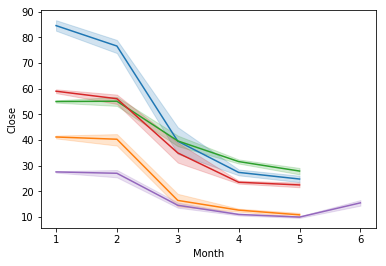

In [130]:
# five airlines
ax = sns.lineplot(x="Month", y="Close", data=united)
ax = sns.lineplot(x="Month", y="Close", data=spirit_air)
ax = sns.lineplot(x="Month", y="Close", data=southwest)
ax = sns.lineplot(x="Month", y="Close", data=delta)
ax = sns.lineplot(x="Month", y="Close", data=american_air)

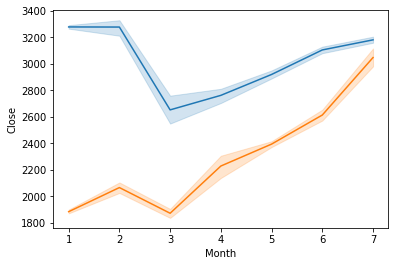

In [131]:
# comparison
ax = sns.lineplot(x="Month", y="Close", data=sp500)
ax = sns.lineplot(x="Month", y="Close", data=amazon)

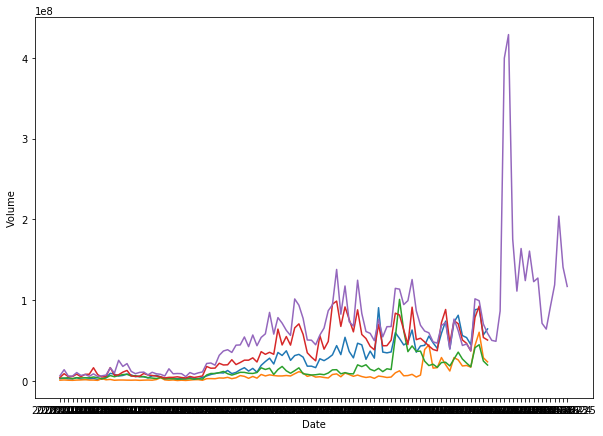

In [132]:
fig, ax = plt.subplots(figsize=fig_dims)
ax = sns.lineplot(x="Date", y="Volume", data=united)
ax = sns.lineplot(x="Date", y="Volume", data=spirit_air)
ax = sns.lineplot(x="Date", y="Volume", data=southwest)
ax = sns.lineplot(x="Date", y="Volume", data=delta)
ax = sns.lineplot(x="Date", y="Volume", data=american_air)

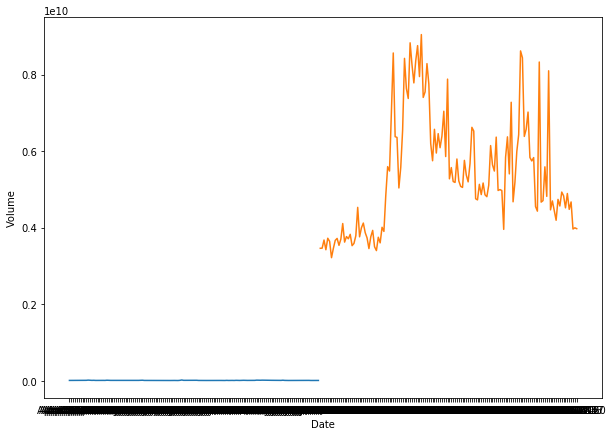

In [133]:
fig, ax = plt.subplots(figsize=fig_dims)
ax = sns.lineplot(x="Date", y="Volume", data=amazon)
ax = sns.lineplot(x="Date", y="Volume", data=sp500)

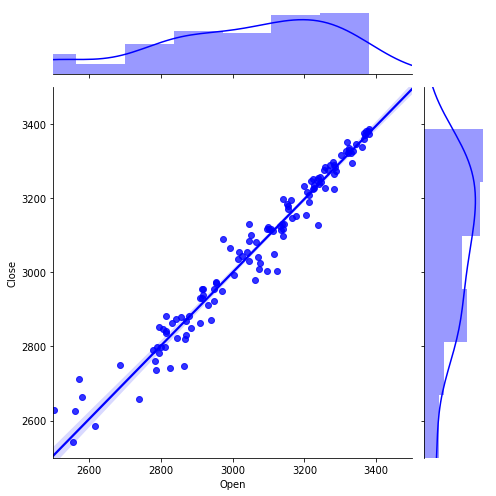

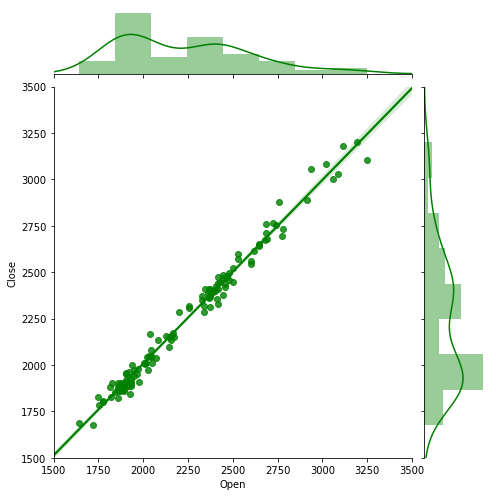

In [134]:
ax = sns.jointplot("Open", "Close", data=sp500,
                  kind="reg", truncate=False,
                  xlim=(2500, 3500), ylim=(2500, 3500),
                  color="b", height=7)
ax = sns.jointplot("Open", "Close", data=amazon,
                  kind="reg", truncate=False,
                  xlim=(1500, 3500), ylim=(1500, 3500),
                  color="g", height=7)

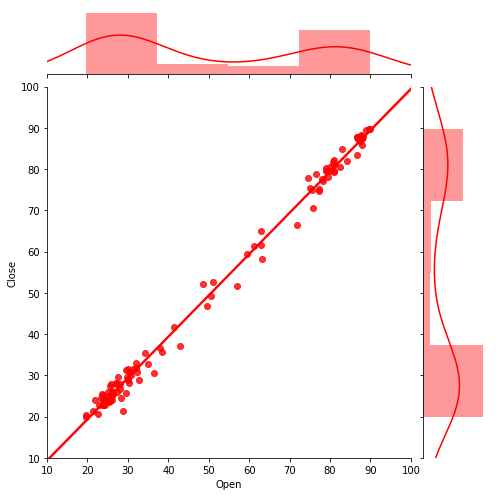

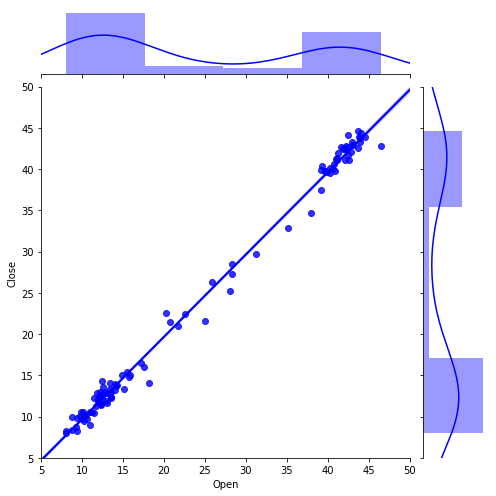

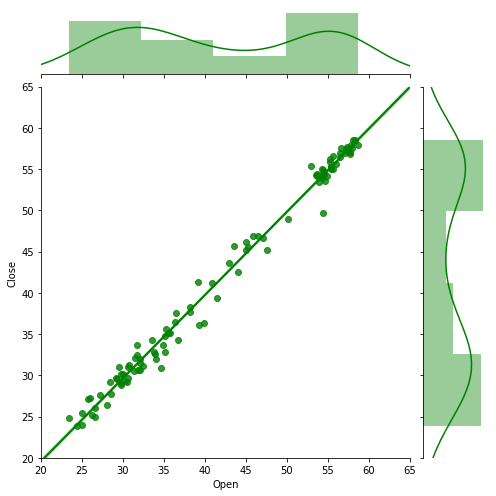

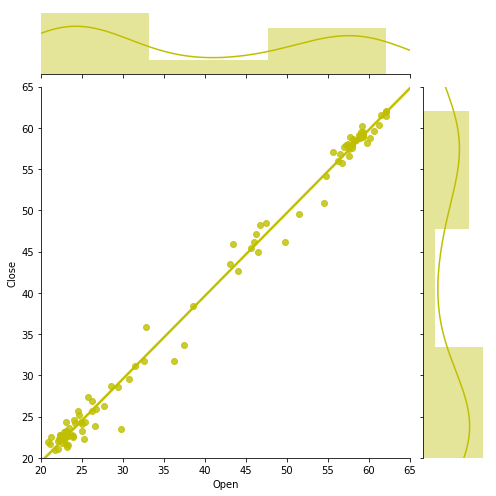

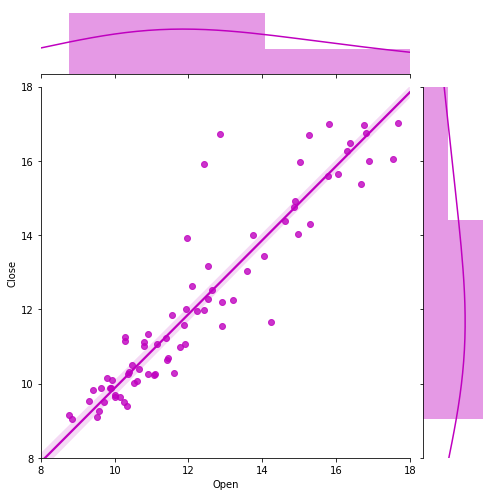

In [135]:
ax = sns.jointplot("Open", "Close", data=united,
                  kind="reg", truncate=False,
                  xlim=(10, 100), ylim=(10, 100),
                  color="r", height=7)
ax = sns.jointplot("Open", "Close", data=spirit_air,
                  kind="reg", truncate=False,
                  xlim=(5, 50), ylim=(5, 50),
                  color="b", height=7)
ax = sns.jointplot("Open", "Close", data=southwest,
                  kind="reg", truncate=False,
                  xlim=(20, 65), ylim=(20, 65),
                  color="g", height=7)
ax = sns.jointplot("Open", "Close", data=delta,
                  kind="reg", truncate=False,
                  xlim=(20, 65), ylim=(20, 65),
                  color="y", height=7)
ax = sns.jointplot("Open", "Close", data=american_air,
                  kind="reg", truncate=False,
                  xlim=(8, 18), ylim=(8, 18),
                  color="m", height=7)

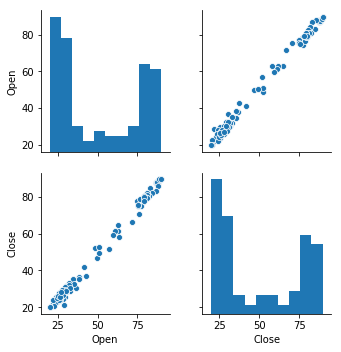

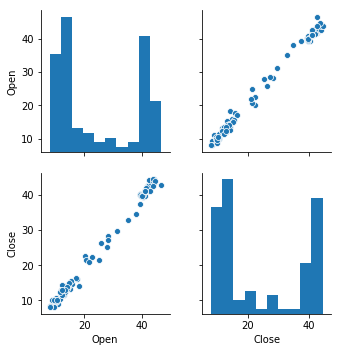

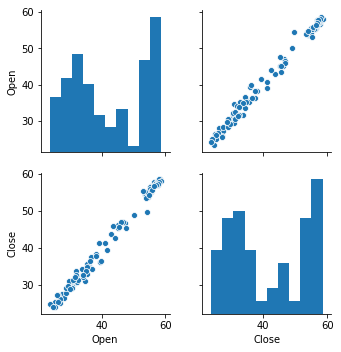

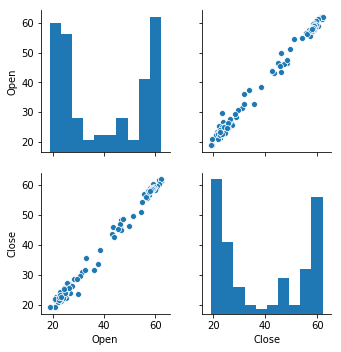

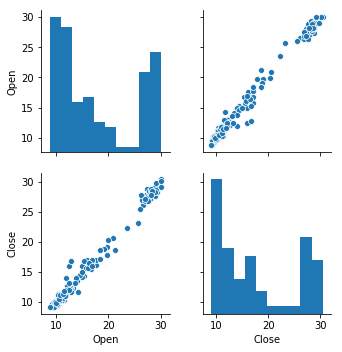

In [136]:
ax = sns.pairplot(data=united, vars=["Open", "Close"])
ax = sns.pairplot(data=spirit_air, vars=["Open", "Close"])
ax = sns.pairplot(data=southwest, vars=["Open", "Close"])
ax = sns.pairplot(data=delta, vars=["Open", "Close"])
ax = sns.pairplot(data=american_air, vars=["Open", "Close"])

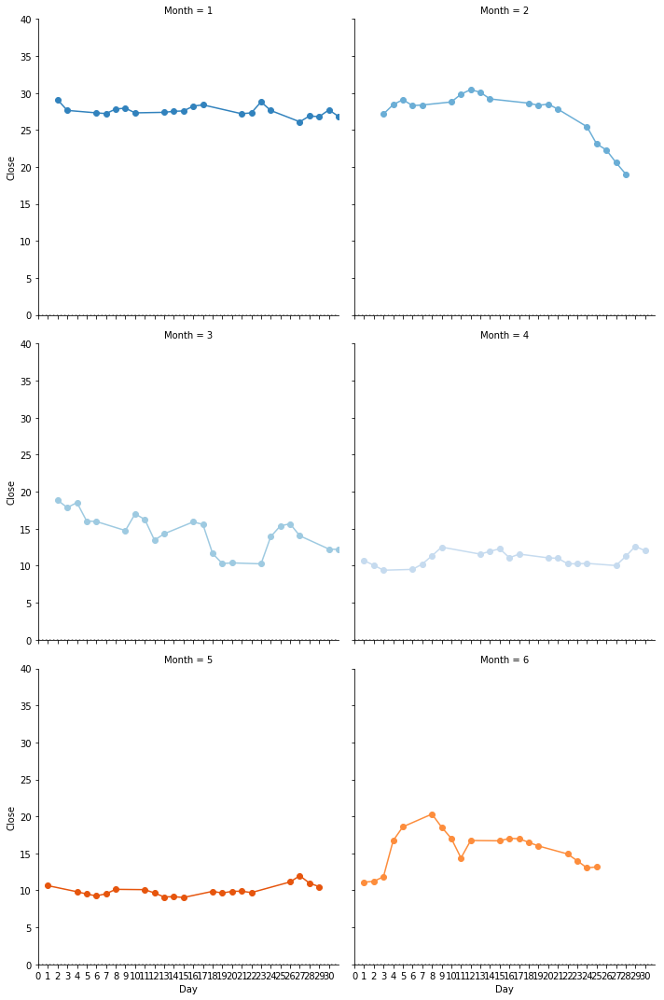

In [137]:
# American air stocks by day and month
grid = sns.FacetGrid(american_air, col="Month", hue="Month", palette="tab20c",
                     col_wrap=2, height=5)
# Draw a horizontal line to show the starting point
grid.map(plt.axhline, y=0, ls=":", c=".5")

# Draw a line plot to show the trajectory of each random walk
grid.map(plt.plot, "Day", "Close", marker="o")

# Adjust the tick positions and labels
grid.set(xticks=np.arange(31), yticks=[0, 5, 10, 15, 20, 25, 30, 35, 40],
         xlim=(0, 31), ylim=(0, 40))

# Adjust the arrangement of the plots
grid.fig.tight_layout(w_pad=1)

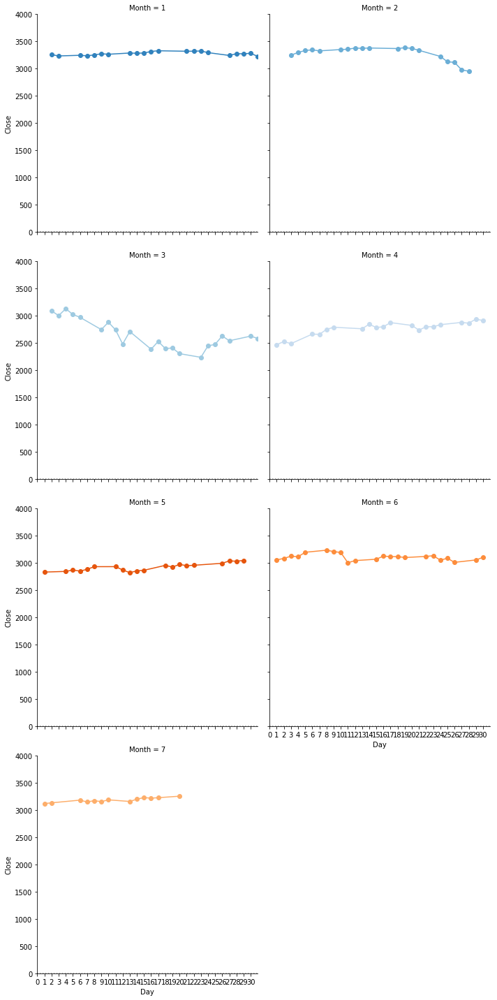

In [138]:
# S&P 500 by day and month
grid = sns.FacetGrid(sp500, col="Month", hue="Month", palette="tab20c",
                     col_wrap=2, height=5)
# Draw a horizontal line to show the starting point
grid.map(plt.axhline, y=0, ls=":", c=".5")

# Draw a line plot to show the trajectory of each random walk
grid.map(plt.plot, "Day", "Close", marker="o")

# Adjust the tick positions and labels
grid.set(xticks=np.arange(31), yticks=[0, 500, 1000, 1500, 2000, 2500, 3000, 3500, 4000],
         xlim=(0, 31), ylim=(0, 4000))

# Adjust the arrangement of the plots
grid.fig.tight_layout(w_pad=1)

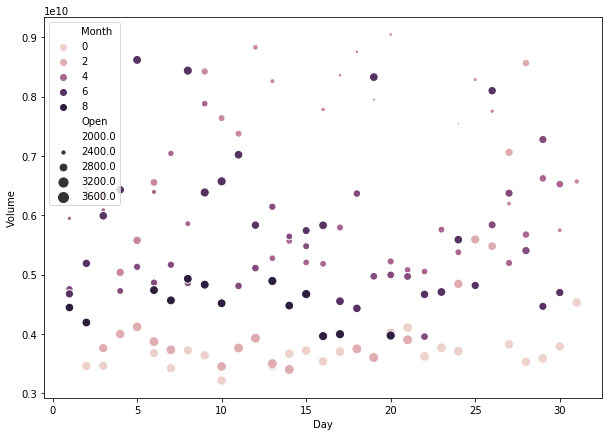

In [139]:
fig, ax = plt.subplots(figsize=fig_dims)
ax = sns.scatterplot(x="Day", y="Volume", hue="Month", size="Open",
                 sizes=(0,100), linewidth=1, data=sp500)

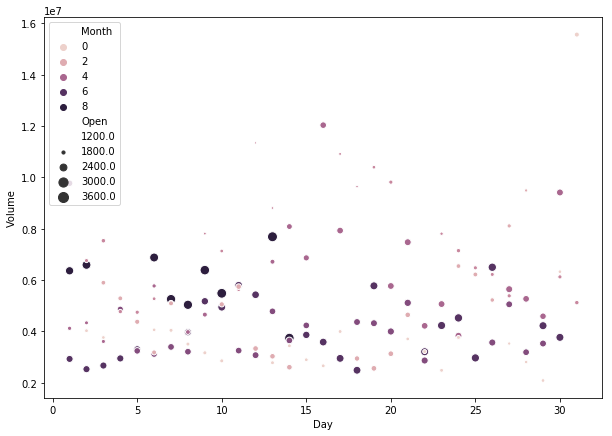

In [140]:
fig, ax = plt.subplots(figsize=fig_dims)
ax = sns.scatterplot(x="Day", y="Volume", hue="Month", size="Open",
                 sizes=(0,100), linewidth=1, data=amazon)

##### Stat Analysis

In [141]:
close_px = sp500['Close']
mavg = close_px.rolling(window=10).mean()
print(mavg)

5032            NaN
5033            NaN
5034            NaN
5035            NaN
5036            NaN
5037            NaN
5038            NaN
5039            NaN
5040            NaN
5041    3262.983008
5042    3268.879004
5043    3278.356006
5044    3285.807007
5045    3294.264014
5046    3301.513013
5047    3303.590015
5048    3301.417993
5049    3300.229004
5050    3299.254004
5051    3298.690991
5052    3289.561987
5053    3281.491968
5054    3279.171973
5055    3280.465967
5056    3282.489966
5057    3285.713965
5058    3296.559985
5059    3304.710986
5060    3315.315991
5061    3324.343994
           ...     
5140    3090.003003
5141    3111.543994
5142    3126.944995
5143    3124.182007
5144    3123.882007
5145    3124.968018
5146    3129.360010
5147    3128.421997
5148    3128.720996
5149    3119.102002
5150    3107.649024
5151    3100.060034
5152    3086.079053
5153    3094.245044
5154    3091.019043
5155    3089.684033
5156    3087.239038
5157    3087.476050
5158    3088.943042


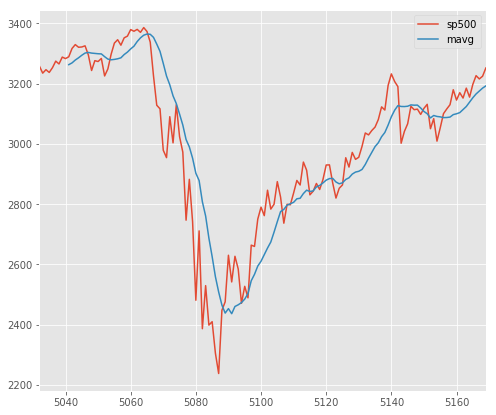

In [142]:
%matplotlib inline

# Adjusting the size of matplotlib
mpl.rc('figure', figsize=(8, 7))
mpl.__version__

# Adjusting the style of matplotlib
style.use('ggplot')

close_px.plot(label='sp500')
mavg.plot(label='mavg')
plt.legend()

In [143]:
close_px = american_air['Close']
mavg = close_px.rolling(window=10).mean()
print(mavg)

132       NaN
133       NaN
134       NaN
135       NaN
136       NaN
137       NaN
138       NaN
139       NaN
140       NaN
141    27.689
142    27.603
143    27.678
144    27.666
145    27.676
146    27.772
147    27.741
148    27.620
149    27.571
150    27.498
151    27.512
152    27.373
153    27.249
154    27.372
155    27.550
156    27.500
157    27.574
158    27.842
159    28.136
160    28.503
161    28.740
        ...  
224     9.691
225     9.531
226     9.536
227     9.549
228     9.611
229     9.646
230     9.602
231     9.706
232     9.939
233    10.126
234    10.261
235    10.468
236    10.603
237    10.824
238    11.509
239    12.379
240    13.440
241    14.181
242    14.685
243    15.025
244    15.649
245    16.208
246    16.789
247    17.302
248    17.279
249    17.020
250    16.481
251    16.026
252    15.628
253    15.507
Name: Close, Length: 122, dtype: float64


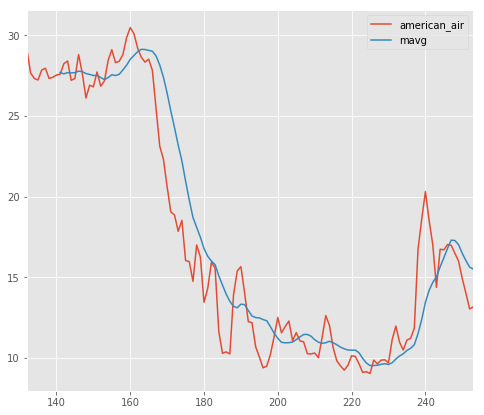

In [144]:
%matplotlib inline

# Adjusting the size of matplotlib
mpl.rc('figure', figsize=(8, 7))
mpl.__version__

# Adjusting the style of matplotlib
style.use('ggplot')

close_px.plot(label='american_air')
mavg.plot(label='mavg')
plt.legend()

# COVID Tests

In [145]:
#Import WHO data for COVID Cases and deaths
filePathWHO = 'data/WHO-COVID-19-global-data.csv'
who = pd.read_csv(filePathWHO)
#includes new cases, new deaths, total cases, and total deaths for most countries

In [146]:
#Import data from Our World in Data for COVID Tests
filePathTestsFull = 'data/full-list-total-tests-for-covid-19.csv'
covid_tests = pd.read_csv(filePathTestsFull)

#source: https://ourworldindata.org/grapher/full-list-total-tests-for-covid-19

In [147]:
#Display the data format of the WHO dataset
who.head()

,Date_reported,Country_code,Country,WHO_region,New_cases,Cumulative_cases,New_deaths,Cumulative_deaths
0,2020-02-24,AF,Afghanistan,EMRO,1,1,0,0
1,2020-02-25,AF,Afghanistan,EMRO,0,1,0,0
2,2020-02-26,AF,Afghanistan,EMRO,0,1,0,0
3,2020-02-27,AF,Afghanistan,EMRO,0,1,0,0
4,2020-02-28,AF,Afghanistan,EMRO,0,1,0,0


In [148]:
#Display the data format of the COVID Tests dataset
covid_tests.head()

,Entity,Code,Date,Total tests
0,Argentina,ARG,"Apr 8, 2020",13330
1,Argentina,ARG,"Apr 9, 2020",14850
2,Argentina,ARG,"Apr 10, 2020",16379
3,Argentina,ARG,"Apr 11, 2020",18027
4,Argentina,ARG,"Apr 13, 2020",19758


In [149]:
who['Date_reported'] =  pd.to_datetime(who['Date_reported'], format='%Y/%m/%d')
covid_tests['Date'] = pd.to_datetime(covid_tests.Date)
#convert the date format of covid_tests to be the same as in WHO data

In [150]:
#Change the country naming scheme to be identical between the two datasets
who = who.replace(['United States of America',
                   'Bolivia (Plurinational State of)',
                   'Czechia','Iran (Islamic Republic of)',
                   'Russian Federation', 'Republic of Korea',
                   'The United Kingdom',
                   'Viet Nam'], ['United States',
                                 'Bolivia',
                                 'Czech Republic',
                                 'Iran',
                                 'Russia',
                                 'South Korea',
                                 'United Kingdom',
                                 'Vietnam'])
covid_tests = covid_tests.replace(['France, tests performed',
 'Ghana, people tested',
 'India, people tested',
 'Singapore, samples tested',
 'Thailand, people tested'], ['France',
                              'Ghana',
                              'India',
                              'Singapore',
                              'Thailand'])

In [151]:
#Merge the WHO dataset and the COVID Tests dataset into one table, linked on the name of the country and the date reported
who_tests_merged = covid_tests.merge(who, left_on=['Entity','Date'], right_on=[' Country','Date_reported'])
who_tests_merged = who_tests_merged.drop(['Entity', 'Date_reported', ' Country_code'], axis=1)
#Add a "new tests" category because only cumulative tests are in the dataset
who_tests_merged['New tests'] = 0

In [152]:
#Using the total tests field to check for the number of new tests on each day in the table
for i in range(who_tests_merged[' Country'].size):
    if i>0:
        if (who_tests_merged[' Country'][i-1] == who_tests_merged[' Country'][i]):
            who_tests_merged['New tests'][i] = (who_tests_merged['Total tests'][i]-who_tests_merged['Total tests'][i-1])
#Note, takes ~3 min to run as is

C:\Users\nic_v\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


In [153]:
#Output Pearson and Spearman values for a variety of combinations from the merged table generated
#Checking correlation of testing to both overall/new cases and deaths
xs = who_tests_merged[' Cumulative_cases']
ys = who_tests_merged['Total tests']
print('Pearson value for total cases and total tests of all countries:')
print(stats.pearsonr(xs,ys)[0])
print('Spearman value for total cases and total tests of all countries:')
print(stats.spearmanr(xs,ys)[0])

Pearson value for total cases and total tests of all countries:
0.9222211340936356
Spearman value for total cases and total tests of all countries:
0.8751822769092304


In [154]:
xsr = who_tests_merged[' New_cases']
ysr = who_tests_merged['New tests']
print('Pearson value for new cases and new tests of all countries:')
print(stats.pearsonr(xsr,ysr)[0])
print('Spearman value for new cases and new tests of all countries:')
print(stats.spearmanr(xsr,ysr)[0])

Pearson value for new cases and new tests of all countries:
0.7691987665230835
Spearman value for new cases and new tests of all countries:
0.6607317347947645


In [155]:
xus = who_tests_merged.loc[who_tests_merged[' Country'] == 'United States'][' Cumulative_cases']
yus = who_tests_merged.loc[who_tests_merged[' Country'] == 'United States']['Total tests']
print('Pearson value for total cases and total tests in the US:')
print(stats.pearsonr(xus,yus)[0])
print('Spearman value for total cases and total tests in the US:')
print(stats.spearmanr(xus,yus)[0])

Pearson value for total cases and total tests in the US:
0.9741862456385783
Spearman value for total cases and total tests in the US:
0.9999871245279883


In [156]:
xus2 = who_tests_merged.loc[who_tests_merged[' Country'] == 'United States'][' New_cases']
yus2 = who_tests_merged.loc[who_tests_merged[' Country'] == 'United States']['New tests']
print('Pearson value for new cases and new tests in the US:')
print(stats.pearsonr(xus2,yus2)[0])
print('Spearman value for new cases and new tests in the US:')
print(stats.spearmanr(xus2,yus2)[0])

Pearson value for new cases and new tests in the US:
0.6854279491935551
Spearman value for new cases and new tests in the US:
0.5318661294857983


In [157]:
xnz = who_tests_merged.loc[who_tests_merged[' Country'] == 'New Zealand'][' Cumulative_cases']
ynz = who_tests_merged.loc[who_tests_merged[' Country'] == 'New Zealand']['Total tests']
print('Pearson value for total cases and total tests in New Zealand:')
print(stats.pearsonr(xnz,ynz)[0])
print('Spearman value for total cases and total tests in New Zealand:')
print(stats.spearmanr(xnz,ynz)[0])

Pearson value for total cases and total tests in New Zealand:
0.7141574962311737
Spearman value for total cases and total tests in New Zealand:
0.99601154367086


In [158]:
xnz2 = who_tests_merged.loc[who_tests_merged[' Country'] == 'New Zealand'][' New_cases']
ynz2 = who_tests_merged.loc[who_tests_merged[' Country'] == 'New Zealand']['New tests']
print('Pearson value for new cases and new tests in New Zealand:')
print(stats.pearsonr(xnz2,ynz2)[0])
print('Spearman value for new cases and new tests in New Zealand:')
print(stats.spearmanr(xnz2,ynz2)[0])

Pearson value for new cases and new tests in New Zealand:
-0.1821895929177977
Spearman value for new cases and new tests in New Zealand:
0.0021873867473263258


In [159]:
xs5 = who_tests_merged[' Cumulative_deaths']
ys5 = who_tests_merged['Total tests']
print('Pearson value for total deaths and total tests of all countries:')
print(stats.pearsonr(xs5,ys5)[0])
print('Spearman value for total deaths and total tests of all countries:')
print(stats.spearmanr(xs5,ys5)[0])

Pearson value for total deaths and total tests of all countries:
0.8133920066782202
Spearman value for total deaths and total tests of all countries:
0.8153897403814283


In [160]:
xus3 = who_tests_merged.loc[who_tests_merged[' Country'] == 'United States'][' Cumulative_deaths']
yus3 = who_tests_merged.loc[who_tests_merged[' Country'] == 'United States']['Total tests']
print('Pearson value for total deaths and total tests in the US:')
print(stats.pearsonr(xus3,yus3)[0])
print('Spearman value for total deaths and total tests in the US:')
print(stats.spearmanr(xus3,yus3)[0])

Pearson value for total deaths and total tests in the US:
0.9253135434226868
Spearman value for total deaths and total tests in the US:
0.9999656651869272


In [161]:
xnz3 = who_tests_merged.loc[who_tests_merged[' Country'] == 'New Zealand'][' Cumulative_deaths']
ynz3 = who_tests_merged.loc[who_tests_merged[' Country'] == 'New Zealand']['Total tests']
print('Pearson value for total deaths and total tests in NZ:')
print(stats.pearsonr(xus3,yus3)[0])
print('Spearman value for total deaths and total tests in NZ:')
print(stats.spearmanr(xus3,yus3)[0])

Pearson value for total deaths and total tests in NZ:
0.9253135434226868
Spearman value for total deaths and total tests in NZ:
0.9999656651869272


In [162]:
xs6 = who_tests_merged[' New_deaths']
ys6 = who_tests_merged['New tests']
print('Pearson value for new deaths and new tests of all countries:')
print(stats.pearsonr(xs6,ys6)[0])
print('Spearman value for new deaths and new tests of all countries:')
print(stats.spearmanr(xs6,ys6)[0])

Pearson value for new deaths and new tests of all countries:
0.4895687353190168
Spearman value for new deaths and new tests of all countries:
0.6094366621575511


In [163]:
xus4 = who_tests_merged.loc[who_tests_merged[' Country'] == 'United States'][' New_deaths']
yus4 = who_tests_merged.loc[who_tests_merged[' Country'] == 'United States']['New tests']
print('Pearson value for new deaths and new tests in the US:')
print(stats.pearsonr(xus4,yus4)[0])
print('Spearman value for new deaths and new tests in the US:')
print(stats.spearmanr(xus4,yus4)[0])

Pearson value for new deaths and new tests in the US:
0.012489536454235192
Spearman value for new deaths and new tests in the US:
0.1562605549975788


In [164]:
xnz4 = who_tests_merged.loc[who_tests_merged[' Country'] == 'New Zealand'][' New_deaths']
ynz4 = who_tests_merged.loc[who_tests_merged[' Country'] == 'New Zealand']['New tests']
print('Pearson value for new deaths and new tests in NZ:')
print(stats.pearsonr(xnz4,ynz4)[0])
print('Spearman value for new deaths and new tests in NZ:')
print(stats.spearmanr(xnz4,ynz4)[0])

Pearson value for new deaths and new tests in NZ:
0.07801255653290888
Spearman value for new deaths and new tests in NZ:
0.15602532849567644


In [165]:
#Create a variable with all of the data for US cases
output_US = who_tests_merged.loc[who_tests_merged[' Country'] == 'United States'][[' Cumulative_cases', 'Total tests', ' New_cases', 'New tests']]

In [166]:
#Create a variable with all of the data for NZ cases
output_NZ = who_tests_merged.loc[who_tests_merged[' Country'] == 'New Zealand'][[' Cumulative_cases', 'Total tests', ' New_cases', 'New tests']]

Text(0.5, 1.0, 'Total COVID Cases and Tests in the US')

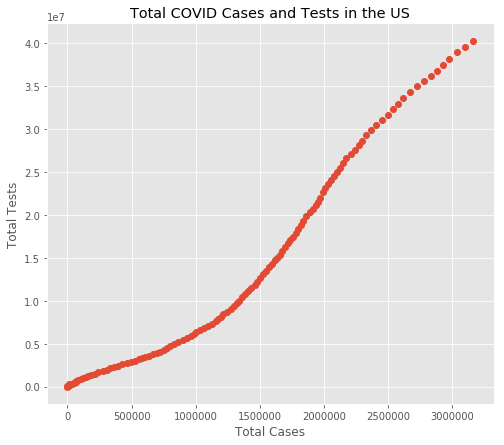

In [167]:
#Create a plot with the cumulative cases against the total tests in the US
x1 = output_US[' Cumulative_cases']
y1 = output_US['Total tests']
plt.plot(x1, y1,'o')
plt.ylabel('Total Tests')
plt.xlabel('Total Cases')
plt.title('Total COVID Cases and Tests in the US')

Text(0.5, 1.0, 'New COVID Cases and Tests in the US')

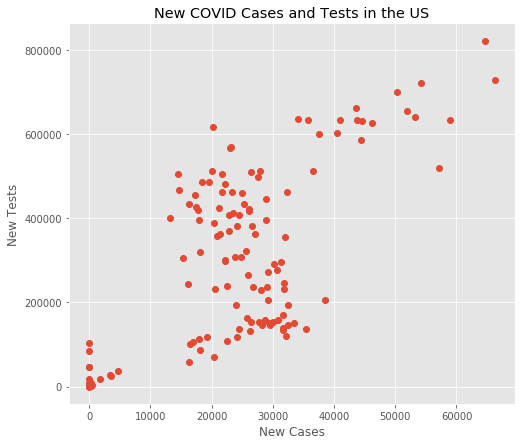

In [168]:
#Create a plot with the new cases against the new tests in the US
x2 = output_US[' New_cases']
y2 = output_US['New tests']
plt.plot(x2, y2,'o')
plt.ylabel('New Tests')
plt.xlabel('New Cases')
plt.title('New COVID Cases and Tests in the US')

Text(0.5, 1.0, 'Total COVID Cases and Tests in NZ')

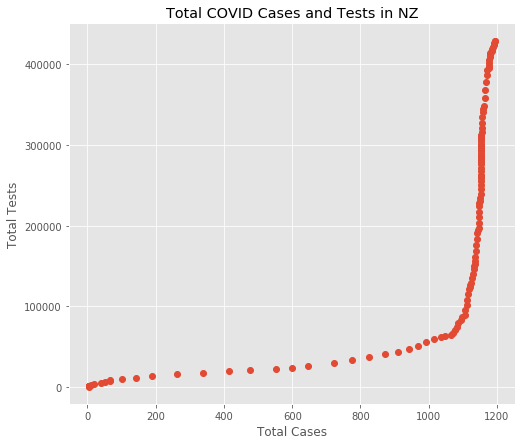

In [169]:
#Create a plot with the cumulative cases against the total tests in New Zealand
x3 = output_NZ[' Cumulative_cases']
y3 = output_NZ['Total tests']
plt.plot(x3, y3,'o')
plt.ylabel('Total Tests')
plt.xlabel('Total Cases')
plt.title('Total COVID Cases and Tests in NZ')

Text(0.5, 1.0, 'New COVID Cases and Tests in NZ')

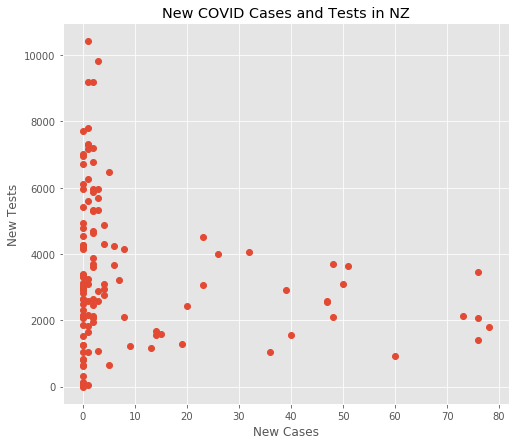

In [170]:
#Create a plot with the new cases against the new tests in New Zealand
x4 = output_NZ[' New_cases']
y4 = output_NZ['New tests']
plt.plot(x4, y4,'o')
plt.ylabel('New Tests')
plt.xlabel('New Cases')
plt.title('New COVID Cases and Tests in NZ')

# Government Measures and School Closures

In [171]:
with open('data/covid_impact_education.csv', newline='') as csvfile:
    reader = csv.reader(csvfile, delimiter=',')
    next(reader)
    edu_data=[]
    for row in reader:
        row[0]=datetime.strptime(row[0], '%d/%m/%Y')
        edu_data.append(row)
        
edu_data=pd.DataFrame(edu_data,columns=['Date', 'ISO', 'Country', 'Scale', 'Note'])
edu_data.head(5)

,Date,ISO,Country,Scale,Note
0,2020-02-16,CHN,China,Localized,
1,2020-02-16,MNG,Mongolia,National,The government mandated school closures on 27 ...
2,2020-02-17,CHN,China,Localized,
3,2020-02-17,MNG,Mongolia,National,The government mandated school closures on 27 ...
4,2020-02-18,CHN,China,Localized,


In [172]:
edu_data.describe()

,Date,ISO,Country,Scale,Note
count,25546,25546,25546,25546,25546
unique,151,210,211,3,23
top,2020-06-05 00:00:00,CHN,Mongolia,National,
freq,210,151,151,18788,23017
first,2020-02-16 00:00:00,NaN,NaN,NaN,NaN
last,2020-07-15 00:00:00,NaN,NaN,NaN,NaN


The dataset for global school closure contains 24456 pieces of school closure/reopen records in 211 countries from 2020-02-16 to 2020-07-15. This dataset contains five features: dates of data aquisition, ISO codes for countries, country names, scale of measure(localized/national), and optional notes. There are five different school measures in total: national closure, localized closure, national reopen, localized reopen, and open.

In [173]:
edu_data=edu_data.sort_values(['ISO','Date'])

In [174]:
with open('WHO-COVID-19-global-data.csv', newline='') as csvfile:
    reader = csv.reader(csvfile, delimiter=',')
    next(reader)
    who_data=[]
    for row in reader:
        row[0]=datetime.strptime(row[0], '%Y-%m-%d')
        who_data.append(row)
        
who_data=pd.DataFrame(who_data,columns=['Date_reported','Country_code','Country','WHO_region','New_cases','Cumulative_cases','New_deaths','Cumulative_deaths'])
who_data.head(5)

,Date_reported,Country_code,Country,WHO_region,New_cases,Cumulative_cases,New_deaths,Cumulative_deaths
0,2020-02-24,AF,Afghanistan,EMRO,1,1,0,0
1,2020-02-25,AF,Afghanistan,EMRO,0,1,0,0
2,2020-02-26,AF,Afghanistan,EMRO,0,1,0,0
3,2020-02-27,AF,Afghanistan,EMRO,0,1,0,0
4,2020-02-28,AF,Afghanistan,EMRO,0,1,0,0


In [175]:
who_data.describe()

,Date_reported,Country_code,Country,WHO_region,New_cases,Cumulative_cases,New_deaths,Cumulative_deaths
count,27772,27772,27772,27772,27772,27772,27772,27772
unique,184,216,216,7,2541,9258,631,3110
top,2020-05-23 00:00:00,CN,China,EURO,0,1,0,0
freq,216,184,184,8235,9752,969,18160,7526
first,2020-01-11 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,2020-07-12 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN


The dataset of global cases from WHO contains 27772 pieces of case/death data in 216 countries from 2020-01-11 to 2020-07-12. This dataset contains date reported, ISO country code, WHO region, country name, new cases, cumulative cases, new deaths, cumulative deaths.

In [176]:
with open('data/acaps_covid19_government_measures_dataset_0.csv', newline='\n',encoding='utf-8') as csvfile:
    reader = csv.reader(csvfile, delimiter=',')
    next(reader)
    gov_data=[]
    for row in reader:
        row[-2]=datetime.strptime(row[-2], '%Y-%m-%d')
        gov_data.append(row)
        
gov_data=pd.DataFrame(gov_data,columns=['ID','COUNTRY','ISO','ADMIN_LEVEL_NAME','PCODE','REGION','LOG_TYPE','CATEGORY','MEASURE','TARGETED_POP_GROUP','COMMENTS','NON_COMPLIANCE','DATE_IMPLEMENTED','SOURCE','SOURCE_TYPE','LINK','ENTRY_DATE','Alternative source'])
gov_data.head(5)

,ID,COUNTRY,ISO,ADMIN_LEVEL_NAME,PCODE,REGION,LOG_TYPE,CATEGORY,MEASURE,TARGETED_POP_GROUP,COMMENTS,NON_COMPLIANCE,DATE_IMPLEMENTED,SOURCE,SOURCE_TYPE,LINK,ENTRY_DATE,Alternative source
0,1,Afghanistan,AFG,,,Asia,Introduction / extension of measures,Public health measures,Health screenings in airports and border cross...,No,,,2020-02-12,Ministry of Health,Government,https://moph.gov.af/en/moph-held-emergency-mee...,2020-03-14,
1,2,Afghanistan,AFG,Kabul,,Asia,Introduction / extension of measures,Public health measures,Isolation and quarantine policies,No,,,2020-02-12,Ministry of Health,Government,https://moph.gov.af/en/moph-held-emergency-mee...,2020-03-14,
2,3,Afghanistan,AFG,,,Asia,Introduction / extension of measures,Public health measures,Awareness campaigns,No,,,2020-02-12,Ministry of Health,Government,https://moph.gov.af/en/moph-held-emergency-mee...,2020-03-14,
3,4,Afghanistan,AFG,,,Asia,Introduction / extension of measures,Governance and socio-economic measures,Emergency administrative structures activated ...,No,,,2020-02-12,Ministry of Health,Government,https://moph.gov.af/en/moph-held-emergency-mee...,2020-03-14,
4,5,Afghanistan,AFG,,,Asia,Introduction / extension of measures,Social distancing,Limit public gatherings,No,Nevruz festival cancelled,,2020-03-12,AA,Media,https://www.aa.com.tr/en/asia-pacific/coronavi...,2020-03-14,


In [177]:
gov_data.describe()

,ID,COUNTRY,ISO,ADMIN_LEVEL_NAME,PCODE,REGION,LOG_TYPE,CATEGORY,MEASURE,TARGETED_POP_GROUP,COMMENTS,NON_COMPLIANCE,DATE_IMPLEMENTED,SOURCE,SOURCE_TYPE,LINK,ENTRY_DATE,Alternative source
count,14852,14852,14852,14852,14852,14852,14852,14852,14852,14852,14852,14852,14852,14852,14852,14852,14852,14852
unique,14852,194,193,777,1,6,2,6,42,4,14432,13,198,1422,8,8724,104,845
top,10037,Philippines,PHL,,,Europe,Introduction / extension of measures,Public health measures,Economic measures,No,,Not applicable,2020-03-16,Government,Government,https://pandemic.internationalsos.com/2019-nco...,2020-04-21 00:00:00,
freq,1,356,356,13188,14852,4619,12121,4690,2047,8911,149,10565,339,1310,9849,431,492,13720
first,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-03-04 00:00:00,NaN
last,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-07-09 00:00:00,NaN


In [178]:
gov_data=gov_data.sort_values(['ISO','ENTRY_DATE'])

- Categories of measures: Governance and socio-economic measures, Humanitarian exemption,Lockdown,Movement restrictions,Public health measures,Social distancing
- More detailed measures in measure column.
- Date implemented column for the effective date of the measure.
- Non Compliance column for punishment of this measure.

In [179]:
iso_dict={}
f = open("data/countrycode.txt", "r")
for x in f:
    words=x.split("	")
    if len(words)<5:
        continue
    else:
        iso_dict[words[0]]=(words[1],words[4])

In [180]:
who_data=who_data.sort_values(['Country_code','Date_reported'])
who_data=np.array(who_data)

In [181]:
who_dict={}
u, indices = np.unique(who_data[:,1], return_index=True)
np.append(indices,[len(who_data)])
for i in range(len(indices)-1):
    key=who_data[indices[i]][1]
    who_dict[key]={}
    who_dict[key]['Date_reported']=who_data[indices[i]:indices[i+1],0]
    who_dict[key]['New_cases']=np.array( [int(i) for i in who_data[indices[i]:indices[i+1],4]])
    who_dict[key]['Cumulative_cases']=np.array( [int(i) for i in who_data[indices[i]:indices[i+1],5]])
    who_dict[key]['New_deaths']=np.array( [int(i) for i in who_data[indices[i]:indices[i+1],6]])
    who_dict[key]['Cumulative_deaths']=np.array( [int(i) for i in who_data[indices[i]:indices[i+1],7]])

In [182]:

# reorganize data by country/measure, only record ealiest pushing date
edu_data=np.array(edu_data)
edu_by_country={}
edu_by_measure={"national close":{},"localized close":{},"localized reopen":{},"national reopen":{},"open":{}}
for datum in edu_data:
    if datum[1] not in edu_by_country.keys():
        edu_by_country[datum[1]]={}
    if(datum[3]=="National"):
        if len(datum[4])>0 and ("open" in datum[4]):
            if "national close" in edu_by_country[datum[1]].keys() or "localized close" in edu_by_country[datum[1]].keys():
                if "national reopen" not in edu_by_country[datum[1]].keys():
                    edu_by_country[datum[1]]["national reopen"]=datum[0]
                    edu_by_measure["national reopen"][datum[1]]=datum[0]
            else:
                if "open" not in edu_by_country[datum[1]].keys():
                    edu_by_country[datum[1]]["open"]=datum[0]
                    edu_by_measure["open"][datum[1]]=datum[0]
        else:
            if "national close" not in edu_by_country[datum[1]].keys():
                edu_by_country[datum[1]]["national close"]=datum[0]
                edu_by_measure["national close"][datum[1]]=datum[0]
    else:
        if len(datum[4])>0 and ("open" in datum[4]):
            if "national close" in edu_by_country[datum[1]].keys() or "localized close" in edu_by_country[datum[1]].keys():
                if "localized reopen" not in edu_by_country[datum[1]].keys():
                    edu_by_country[datum[1]]["localized reopen"]=datum[0]
                    edu_by_measure["localized reopen"][datum[1]]=datum[0]
            else:
                 if "open" not in edu_by_country[datum[1]].keys():
                    edu_by_country[datum[1]]["open"]=datum[0]
                    edu_by_measure["open"][datum[1]]=datum[0]
        else:
            if "localized close" not in edu_by_country[datum[1]].keys():
                edu_by_country[datum[1]]["localized close"]=datum[0]
                edu_by_measure["localized close"][datum[1]]=datum[0]



### Education Measures Adopted by Countries

[198, 114, 8, 3, 1]


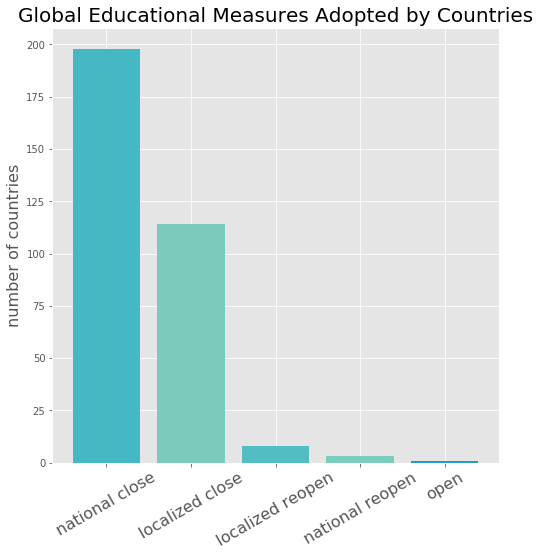

In [183]:
measure_count=[]
tags=tuple(edu_by_measure.keys())
for key in tags:
    measure_count.append(len(edu_by_measure[key].keys()))

ind = np.arange(len(tags))
plt.figure(figsize=(8,8))
my_cmap = cm.get_cmap('YlGnBu')
color=[random.uniform(0.1, 0.6) for i in range(len(tags))]
print(measure_count)
p1 = plt.bar(ind, measure_count,color=my_cmap(color))
plt.ylabel('number of countries',fontsize=16)
plt.title('Global Educational Measures Adopted by Countries',fontsize=20)
plt.xticks(ind, tags)
plt.xticks(rotation=30,fontsize=16)
plt.show() 


### visualization of cases/deaths curves and educational measures

In [184]:
def draw_edu_graph_for_country(country_iso):
    date= who_dict[country_iso]['Date_reported']
    ind = np.arange(len(who_dict[country_iso]['Date_reported']))
    series_tag=['New_cases','Cumulative_cases','New_deaths','Cumulative_deaths']
    for i in range(len(series_tag)):
        legend_line=[]
        legend_tag=[]
        plt.figure(figsize=(48,8))
        series=series_tag[i]
        maxv=who_dict[country_iso][series].max()
        data=who_dict[country_iso][series]
        plt.step(ind, data,label=series.replace("_"," ").lower())
        for key in edu_by_country[iso_dict[country_iso][0]]:
            if key=='national close':
                line='r-'
            elif key == "localized close":
                line='g-'
            elif key=='national reopen':
                line='black'
            elif key == "localized reopen":
                line='c-'
            else:
                line='m-'
            x=[(edu_by_country[iso_dict[country_iso][0]][key]-date[0]).days for i in range(21)]
            y=[i for i in range(0,(maxv//10+1)*10, maxv//20)][:21]
            plt.plot(x,y,line,label=key)
        plt.ylabel('number reported')
        plt.title(series.replace("_"," "))
        if i==len(series_tag)-1:
            plt.xticks(ind,date)
            plt.xticks(rotation=90,fontsize=16)
        else:
            plt.xticks([], [])
            
        handles, labels = plt.gca().get_legend_handles_labels()
        for h,l in zip(handles,labels):
            if l not in legend_tag:
                legend_line.append(h)
                legend_tag.append(l)
        plt.yticks(np.arange(0, (maxv//10+1)*10, step=maxv//20),fontsize=16)
        plt.legend(legend_line,legend_tag,loc='upper right',fontsize=10)
        plt.show() 



United States


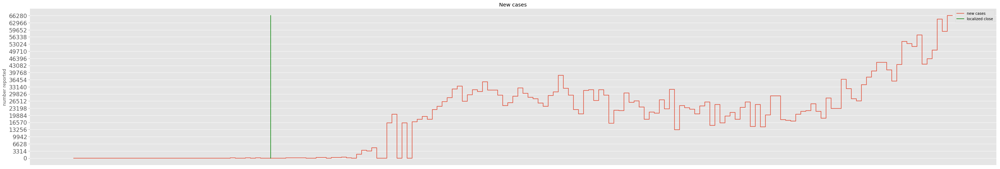

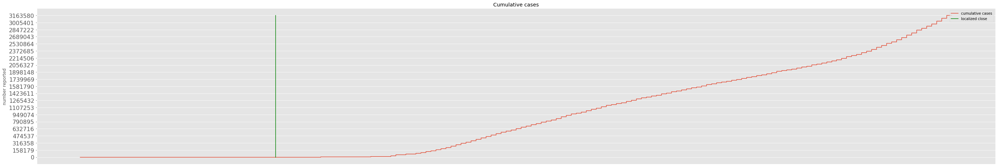

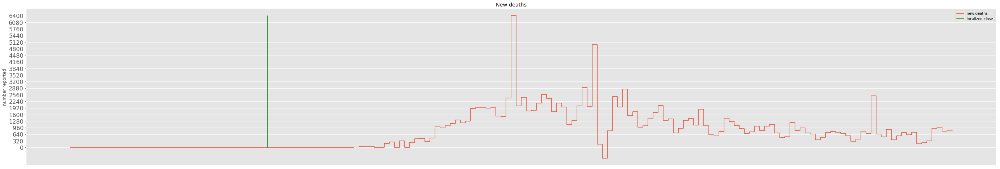

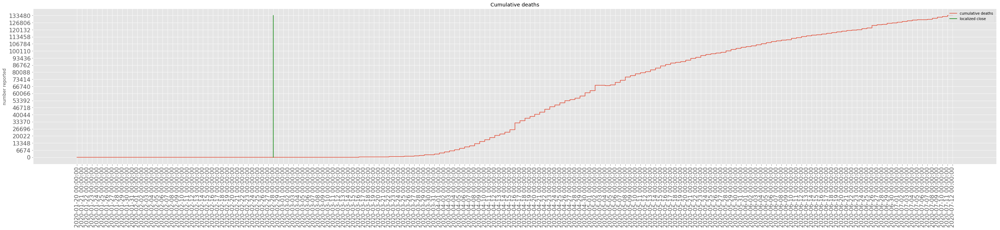

China


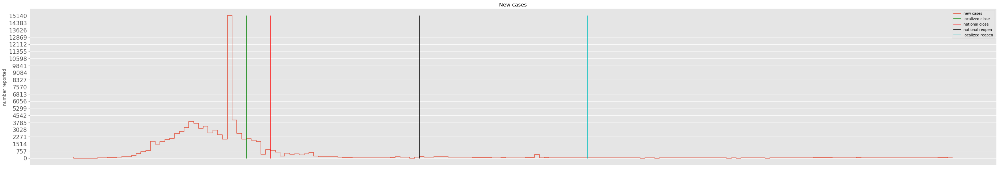

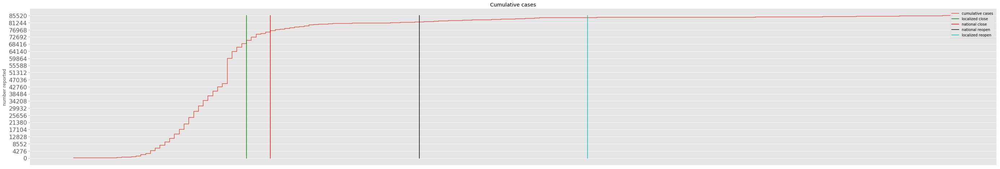

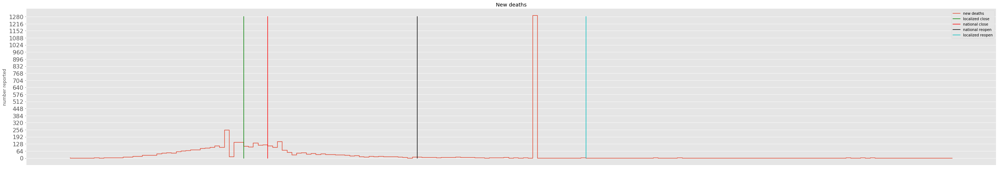

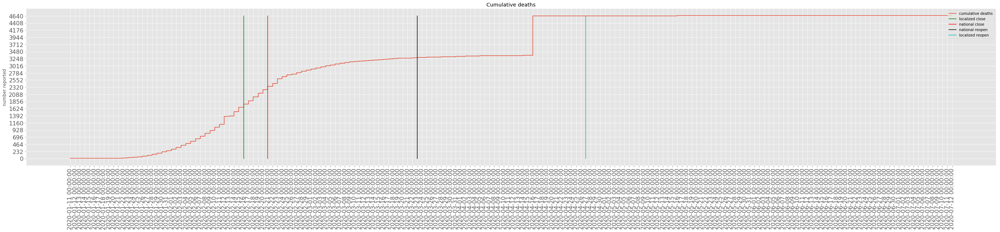

Italy


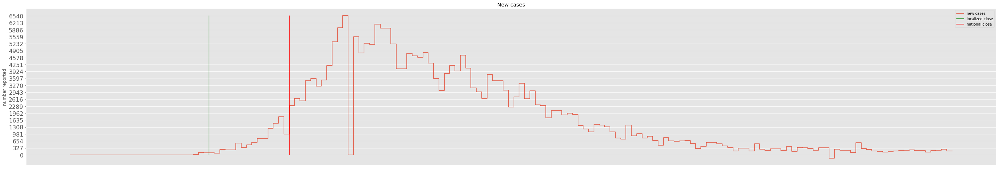

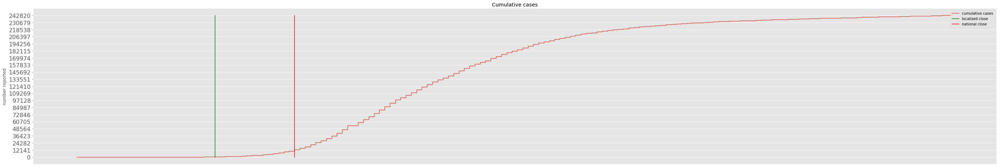

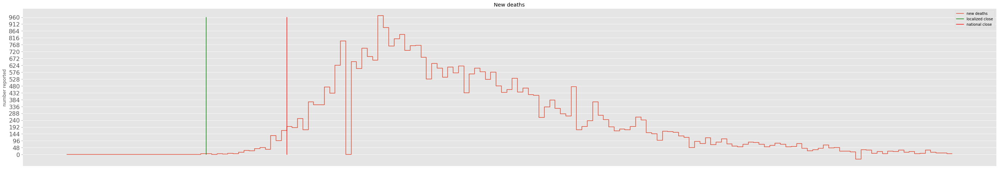

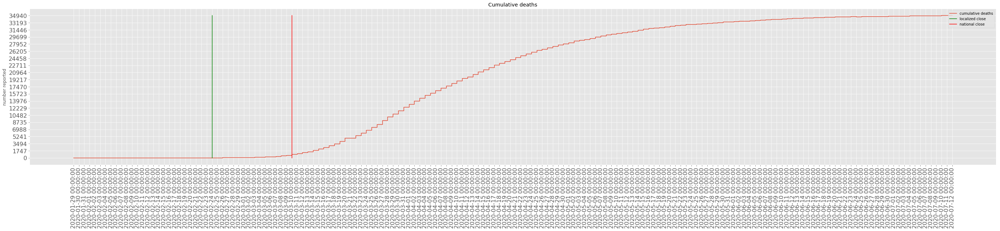

Brazil


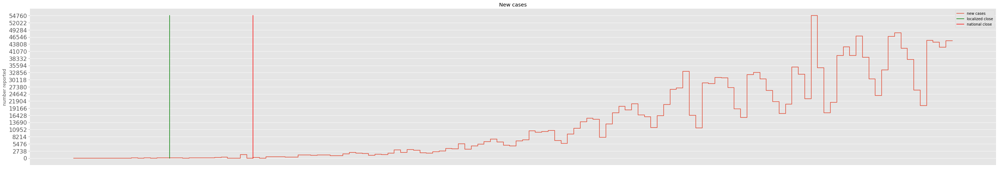

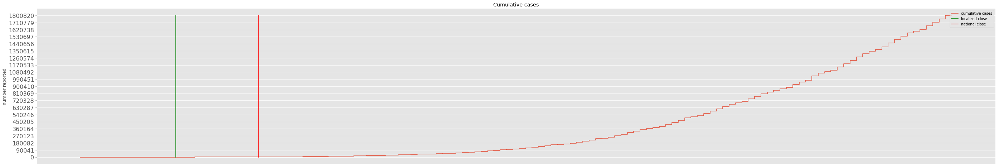

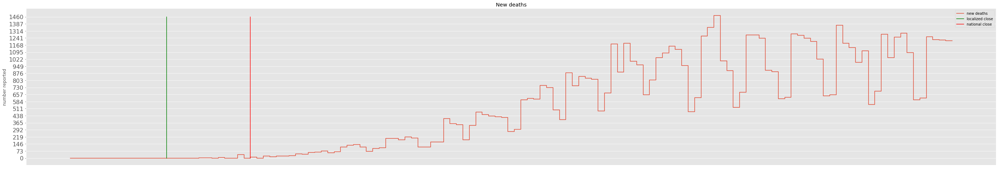

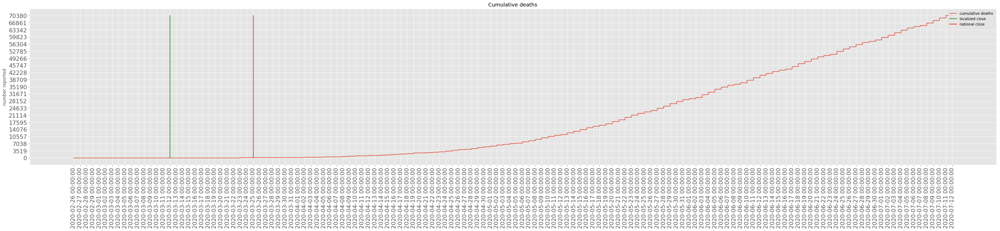

India


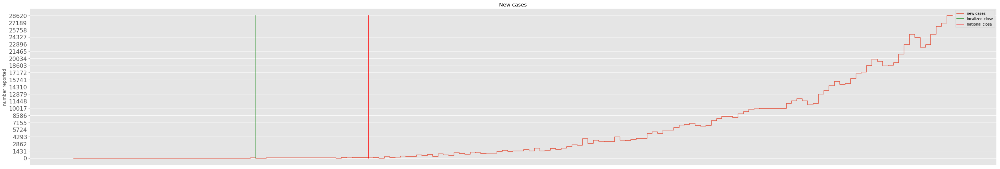

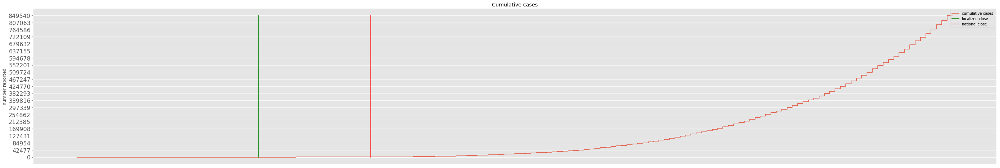

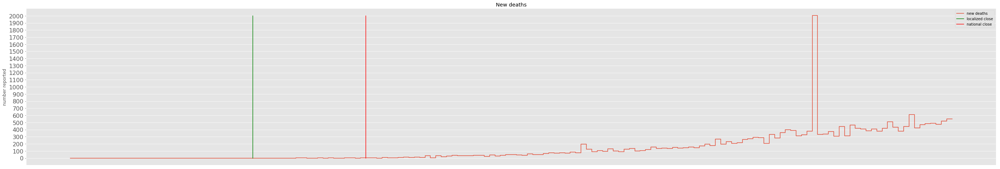

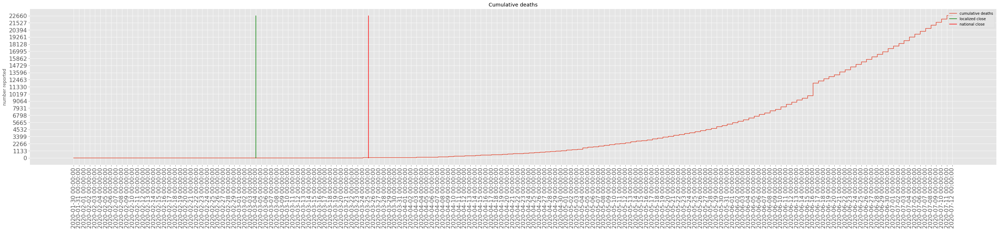

Russia


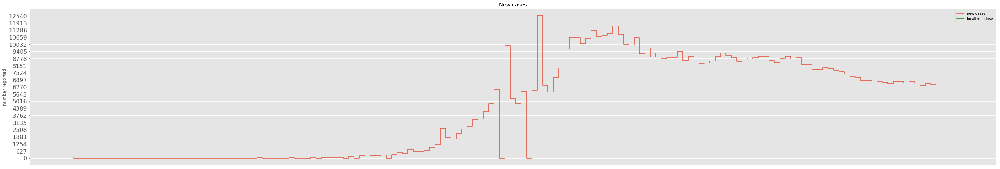

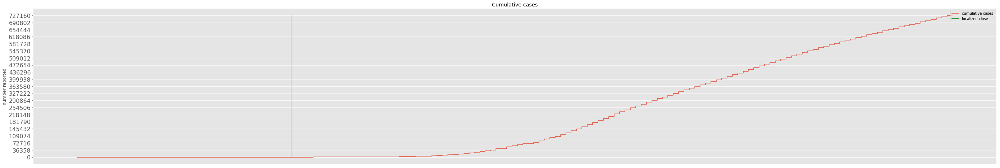

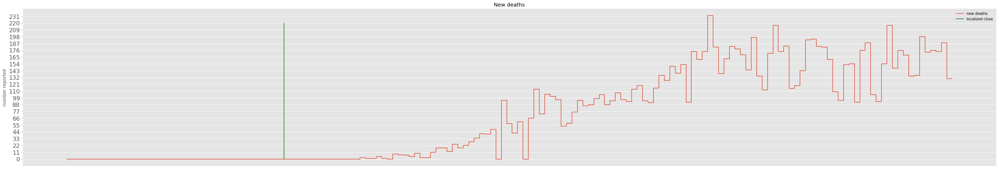

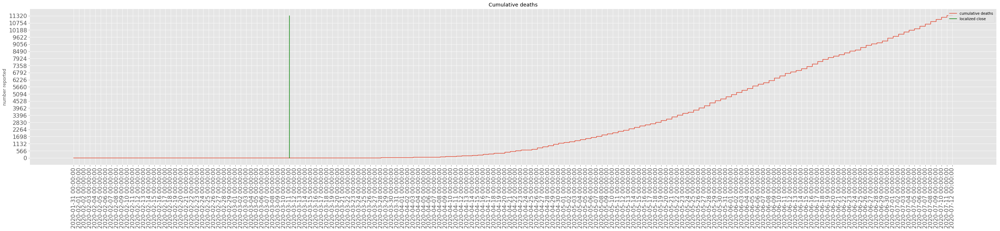

South Africa


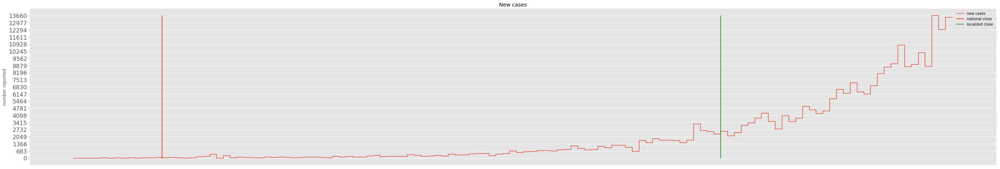

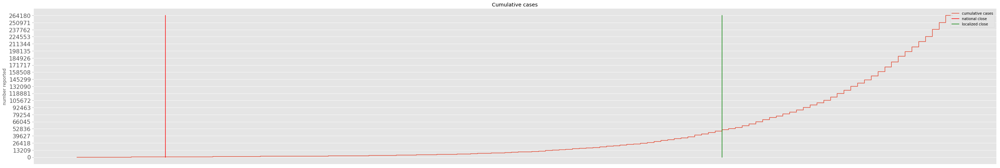

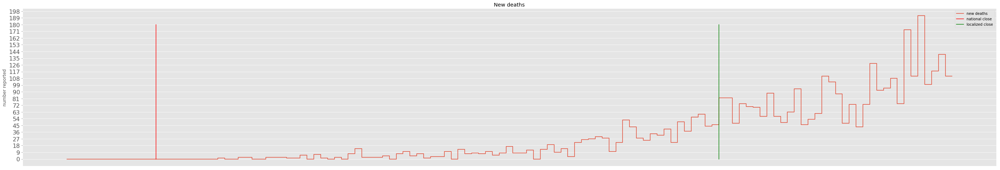

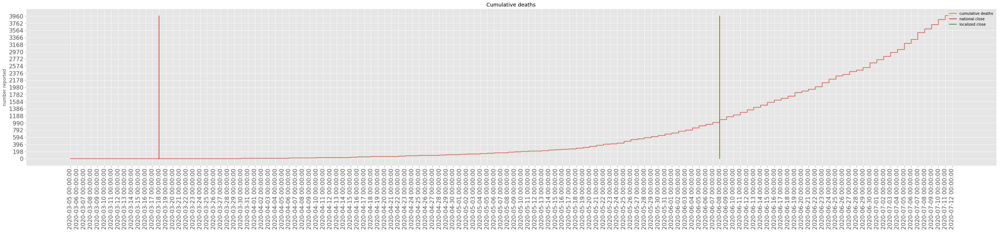

In [185]:
country_list=["US","CN","IT","BR","IN","RU","ZA"]
for iso in country_list:
    print(iso_dict[iso][1])
    draw_edu_graph_for_country(iso)
    print("=====================================================")

In [186]:
gov_data=np.array(gov_data)

In [187]:
#ID','COUNTRY','ISO','ADMIN_LEVEL_NAME','PCODE','REGION','LOG_TYPE','CATEGORY','MEASURE','TARGETED_POP_GROUP','COMMENTS','NON_COMPLIANCE','DATE_IMPLEMENTED','SOURCE','SOURCE_TYPE','LINK','ENTRY_DATE','Alternative source'])
#preserve only earliest record if a measure, indexed by country and category
gov_by_country={}
gov_by_measure={"Governance and socio-economic measures":{}, "Lockdown":{},"Humanitarian exemption":{},"Movement restrictions":{},"Public health measures":{},"Social distancing":{}}
for datum in gov_data:
    if datum[3]:
        continue #only count country level
    if datum[2] not in gov_by_country.keys():
        gov_by_country[datum[2]]={}
    if datum[7] not in gov_by_country[datum[2]].keys():
        gov_by_country[datum[2]][datum[7]]={}
    if datum[2] not in gov_by_measure[datum[7]].keys():
        gov_by_measure[datum[7]][datum[2]]={}
    if datum[8] not in gov_by_country[datum[2]][datum[7]].keys():
        date= datum[-2]
        if datum[-6]!="":
            date=min(datetime.strptime(datum[-6], '%Y-%m-%d'),date)
        gov_by_country[datum[2]][datum[7]][datum[8].strip("\xa0")]=[date,datum[-7]]
        gov_by_measure[datum[7]][datum[2]][datum[8].strip("\xa0")]=[date,datum[-7]]

### government measures adopted by countries

[186, 128, 9, 192, 192, 189]


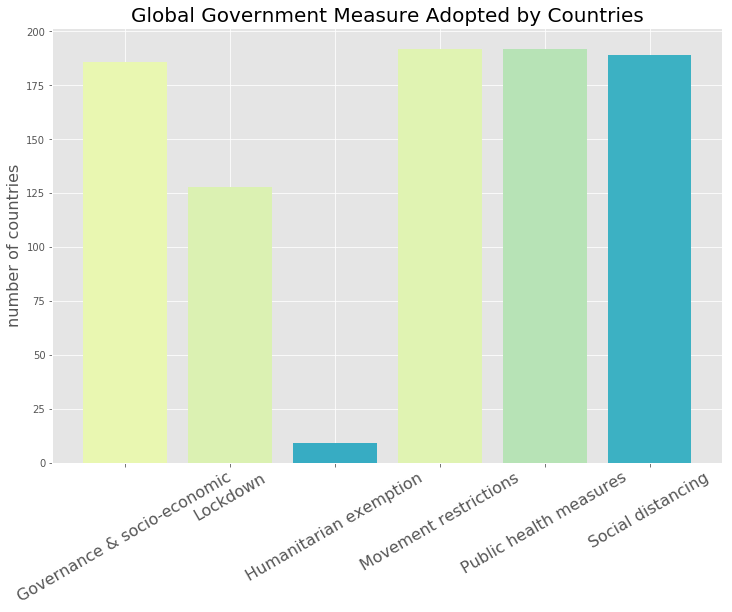

In [188]:
measure_count=[]
keyset=list(gov_by_measure.keys())
keyset[keyset.index('Governance and socio-economic measures')] = 'Governance & socio-economic'
tags=tuple(gov_by_measure.keys())
for key in tags:
    measure_count.append(len(gov_by_measure[key].keys()))        
ind = np.arange(len(tags))
plt.figure(figsize=(12,8))
my_cmap = cm.get_cmap('YlGnBu')
print(measure_count)
color=[random.uniform(0.1, 0.65) for i in range(len(tags))]
p1 = plt.bar(ind, measure_count,color=my_cmap(color))
plt.ylabel('number of countries',fontsize=16)
plt.title('Global Government Measure Adopted by Countries',fontsize=20)
plt.xticks(ind, tuple(keyset))
plt.xticks(rotation=30,fontsize=16)
plt.show() 

### visualization of cases/deaths curves and educational measures

In [189]:
def draw_gov_graph_for_country(iso):
    date= who_dict[iso]['Date_reported']
    ind = np.arange(len(who_dict[iso]['Date_reported']))
    series_tag=["Governance and socio-economic measures", "Lockdown","Humanitarian exemption","Movement restrictions","Public health measures","Social distancing"]
    series_tag=['New_cases','Cumulative_cases','New_deaths','Cumulative_deaths']
    
    for i in range(len(series_tag)):
        legend_line=[]
        legend_tag=[]
        plt.figure(figsize=(48,8))
        series=series_tag[i]
        maxv=who_dict[iso][series].max()
        data=who_dict[iso][series]
        plt.step(ind, data,label=series.replace("_"," ").lower())
        for key in gov_by_country[iso_dict[iso][0]]:
            if key=='Governance and socio-economic measures':
                line='r-'
            elif key == "Lockdown":
                line='g-'
            elif key=='Humanitarian exemption':
                line='black'
            elif key == "Movement restrictions":
                line='c-'
            elif key== 'Public health measures':
                line='m-'
            else:
                line='y-'
            for sub in gov_by_country[iso_dict[iso][0]][key].keys():
                x=[(gov_by_country[iso_dict[iso][0]][key][sub][0]-date[0]).days for i in range(21)]
                y=[i for i in range(0,(maxv//10+1)*10, maxv//20)][:21]
                plt.plot(x,y,line,label=key)
                
        plt.ylabel('number reported')
        plt.title(series.replace("_"," "),fontsize=32)
        if i==len(series_tag)-1:
            plt.xticks(ind,date)
            plt.xticks(rotation=90,fontsize=16)
        else:
            plt.xticks([], [])
            
        handles, labels = plt.gca().get_legend_handles_labels()
        for h,l in zip(handles,labels):
            if l not in legend_tag:
                legend_line.append(h)
                legend_tag.append(l)
        plt.yticks(np.arange(0, (maxv//10+1)*10, step=maxv//20),fontsize=16)
        plt.legend(legend_line,legend_tag,loc='upper right',fontsize=10)
        plt.show()

United States


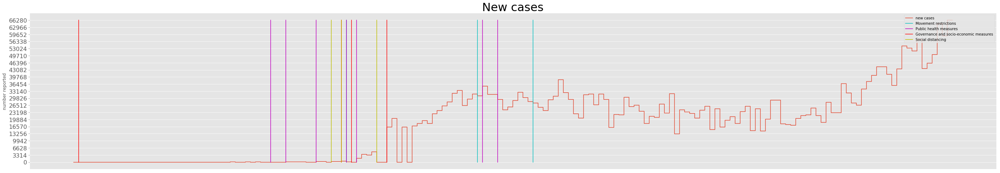

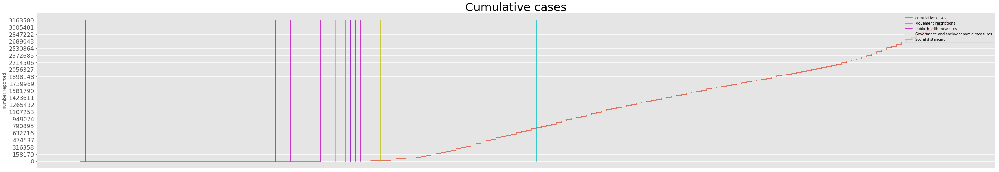

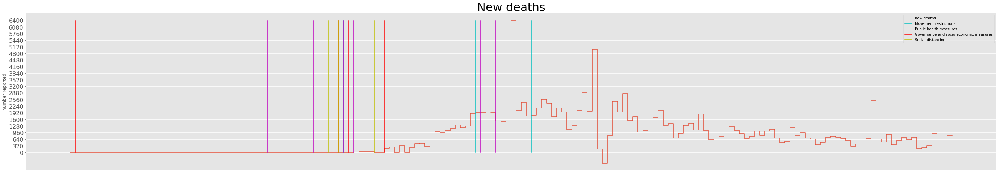

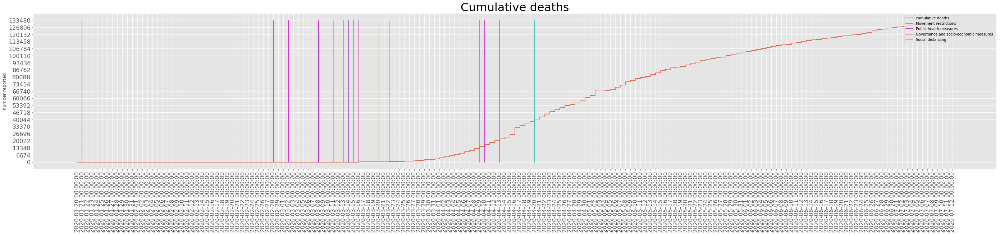

China


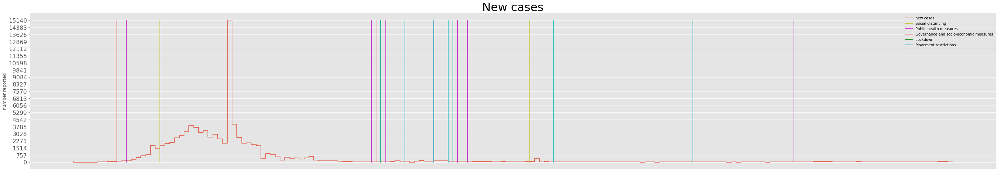

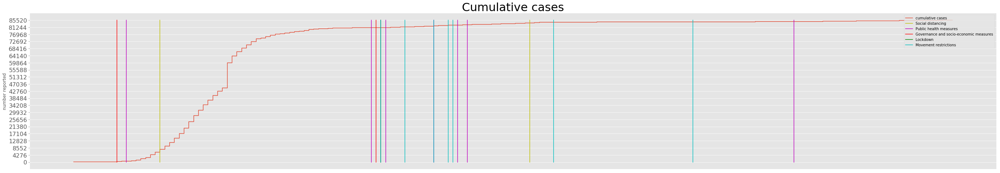

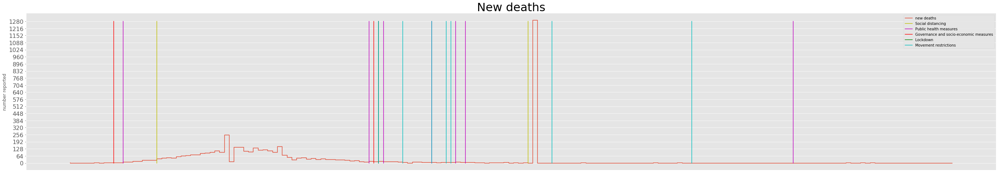

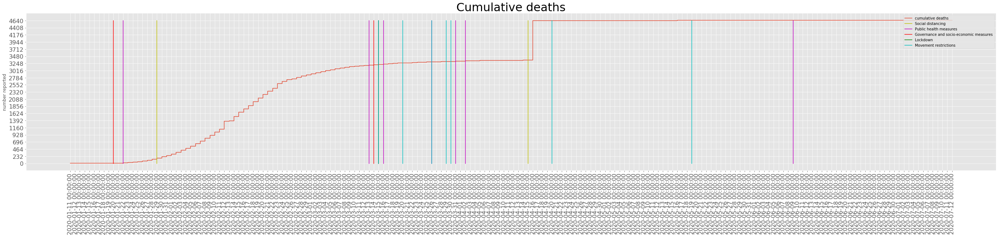

Italy


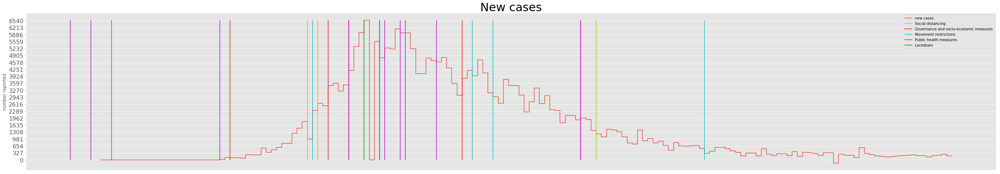

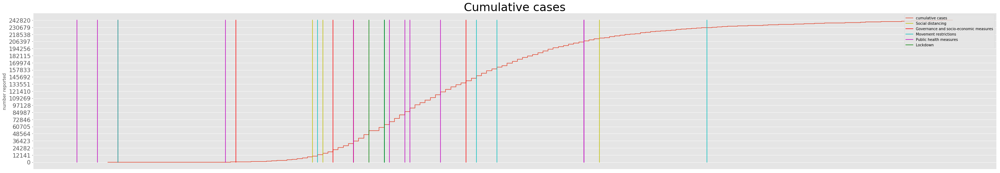

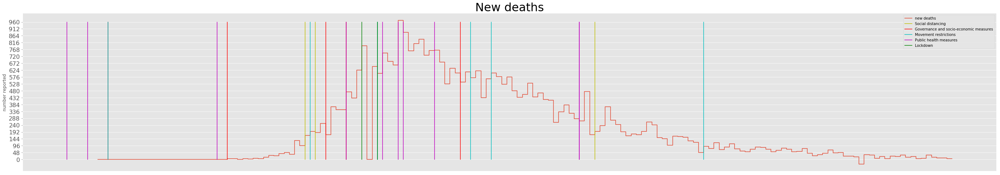

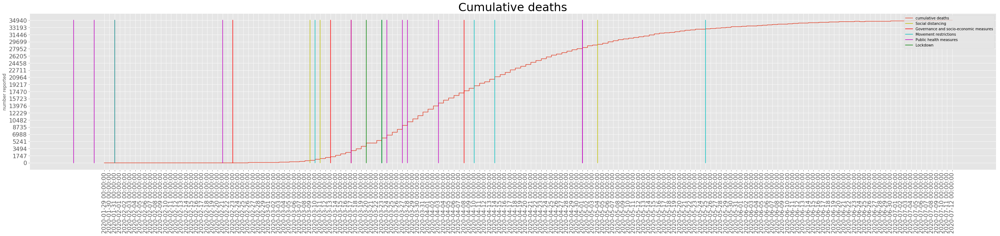

Brazil


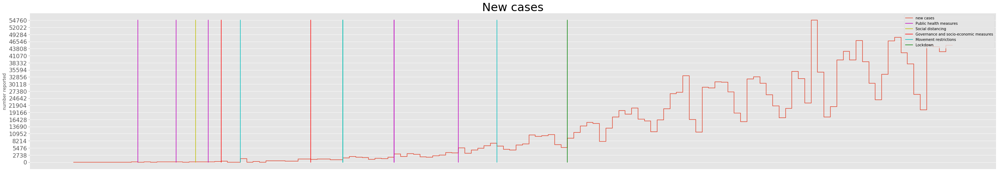

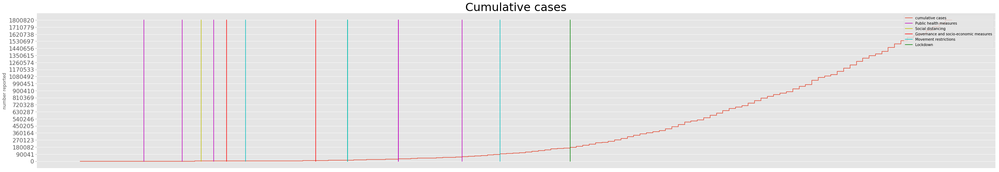

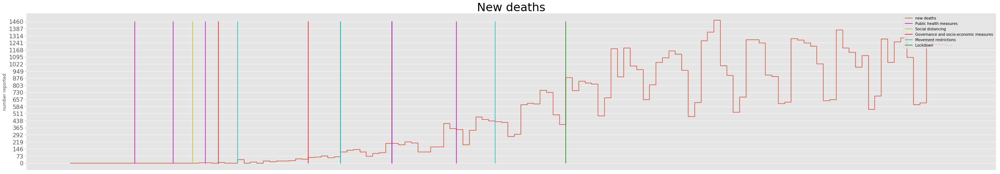

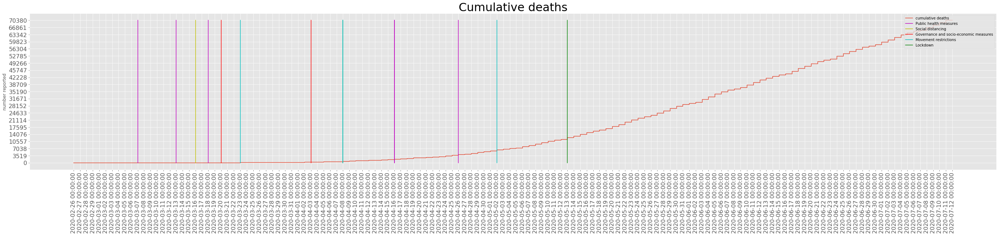

India


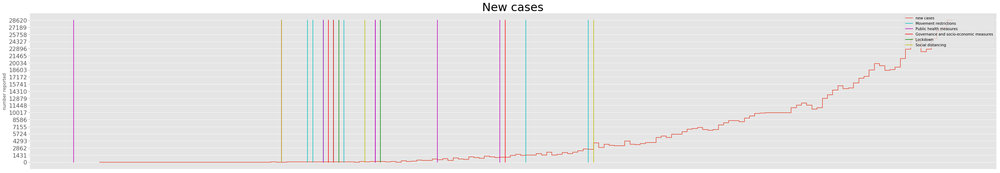

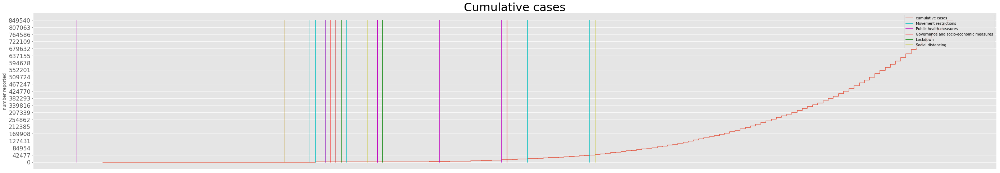

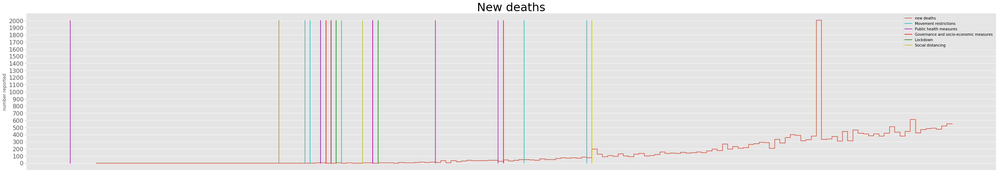

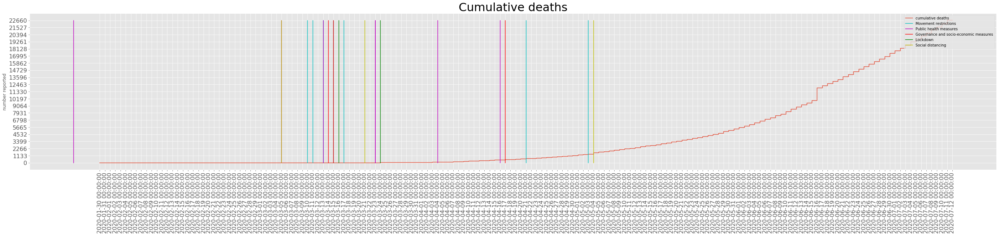

Russia


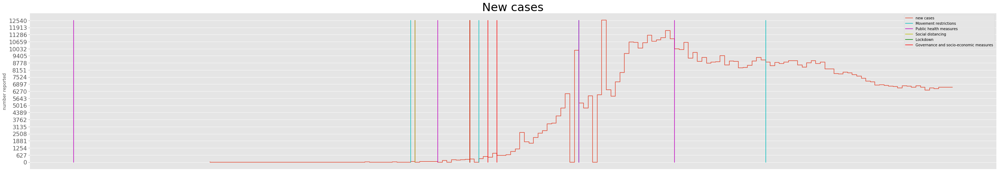

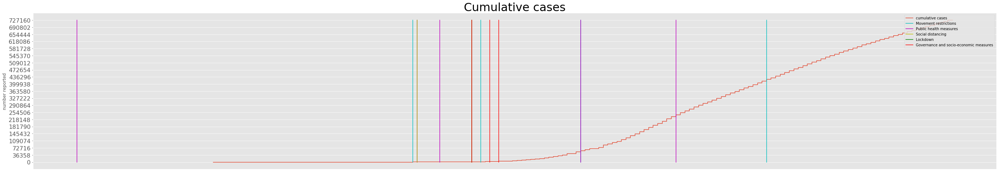

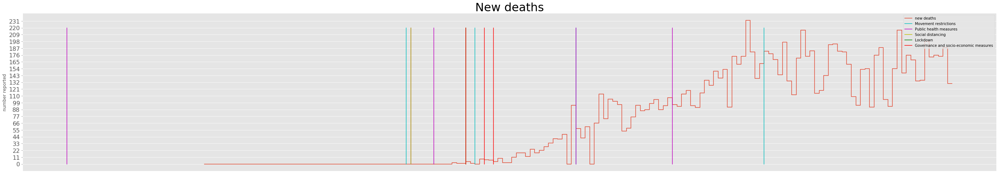

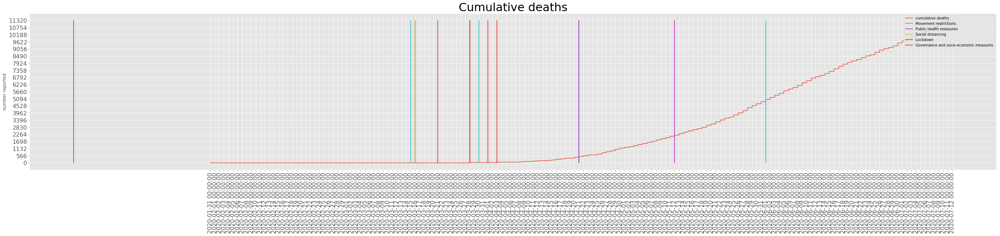

South Africa


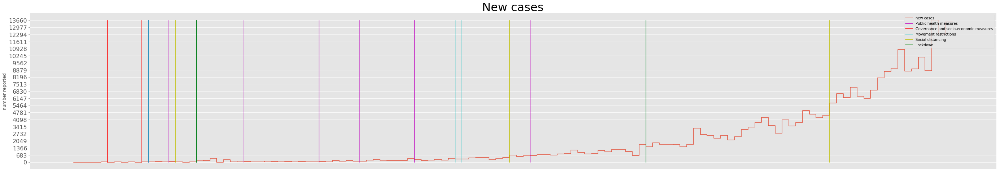

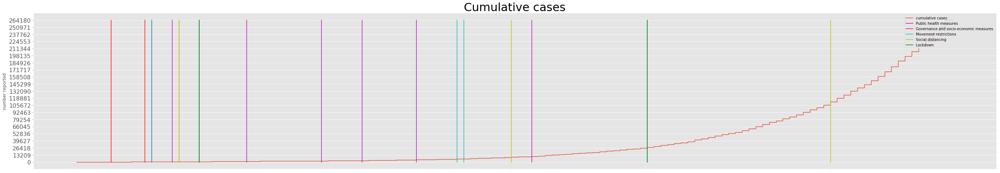

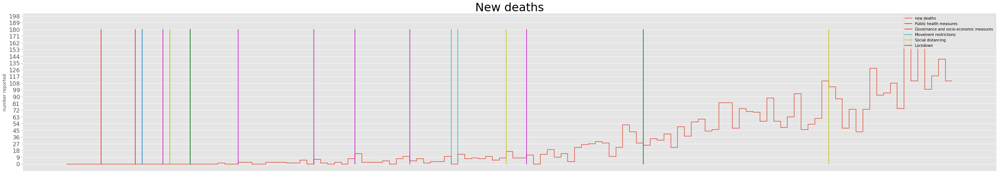

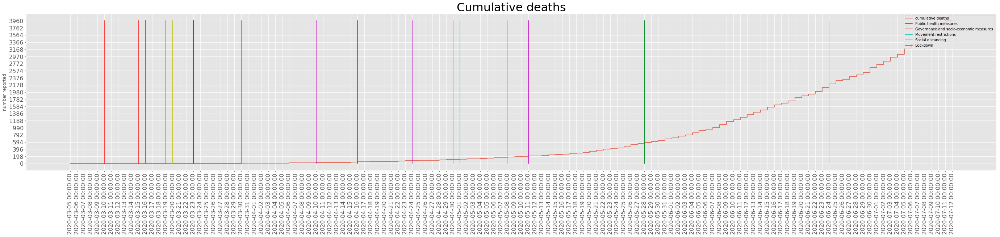

In [190]:
country_list=["US","CN","IT","BR","IN","RU","ZA"]
for iso in country_list:
    print(iso_dict[iso][1])
    draw_gov_graph_for_country(iso)
    print("=====================================================")

### Analysis of the effectiveness of government measures

In [191]:
def gov_correlation(shift_v,show_pic=False,print_res=False):
    cor_result={}
    cor_min={}
    cor_ratio={}
    series_tag=['New_cases','New_deaths']
    measure_tag=["Governance and socio-economic measures", "Lockdown","Humanitarian exemption","Movement restrictions","Public health measures","Social distancing"]
    keyset=list(gov_by_measure.keys())
    keyset[keyset.index('Governance and socio-economic measures')] = 'Governance & socio-economic'
    for series in series_tag:
        cor_result[series]={}
        cor_min[series]={}
        cor_ratio[series]=[]
    for series in series_tag:
        for tag in measure_tag:
            cor_result[series][tag]=[]
            cor_min[series][tag]=(1,"")
    for country in who_dict.keys():
        if country.strip() == "" or (iso_dict[country][0] not in gov_by_country.keys()):
            continue
        date= who_dict[country]['Date_reported']

        ind = np.arange(len(who_dict[country]['Date_reported']))
        for i in range(len(series_tag)):
            series=series_tag[i]
            data=who_dict[country][series]
            delta=[data[0]]
            for i in range(1,len(data)):
                delta.append(data[i]-data[i-1])
            delta=np.array(delta)
            for key in gov_by_country[iso_dict[country][0]]:
                x=[0 for j in range(len(who_dict[country]['Date_reported']))]
                count=0
                # form the time series of the current number of measures in a categories on day i for all days
                for sub in gov_by_country[iso_dict[country][0]][key].keys():
                    shift=min((gov_by_country[iso_dict[country][0]][key][sub][0]-date[0]).days+shift_v,len(x)-1)
                    shift=max(shift,0)
                    count+=1
                    for d in range(shift,len(x)):
                        x[d]=count
                x=np.array(x)
                res=stats.pearsonr(x, delta)
                if key in measure_tag:
                    if not math.isnan(res[0]):
                        if res[0]<cor_min[series][key][0]:
                            cor_min[series][key]=(res[0],country)
                        cor_result[series][key].append(res[0])
    for series in series_tag:
        for tag in measure_tag:
            pos=np.sum(np.array(cor_result[series][tag]) > 0, axis=0)
            neg=np.sum(np.array(cor_result[series][tag]) < 0, axis=0)
            cor_ratio[series].append(neg/(pos+neg))
            if print_res:
                print(tag+"'s affects on "+' '.join(series.split('_')).lower())
                print("positive correlation countries: "+str(pos))
                print("negative correlation countries: "+str(neg))
                if cor_min[series][tag][1]!="":
                    print("measure works best in: "+str(iso_dict[cor_min[series][tag][1]][1]))
                else:
                    print("no best countries found")
                print("")
    if show_pic==True:
        cm_dict={'New_cases':'YlGnBu','New_deaths':"PuBuGn"}
        for series in series_tag:
            plt.figure(figsize=(12,8))
            ind = np.arange(len(cor_ratio[series]))
            my_cmap = cm.get_cmap(cm_dict[series])
            color=[random.uniform(0.1, 0.6) for i in range(len(tags))]
            p1 = plt.bar(ind, cor_ratio[series],color=my_cmap(color))
            plt.ylabel('effective rates')
            plt.title('Global Government Measure Effective Rates on '+' '.join(series.split('_')).title(),fontsize=20)
            plt.xticks(ind, keyset)
            plt.xticks(rotation=30,fontsize=16)
            plt.show() 
    return cor_ratio


C:\Users\nic_v\Anaconda3\lib\site-packages\scipy\stats\stats.py:3038: RuntimeWarning: invalid value encountered in double_scalars
  r = r_num / r_den


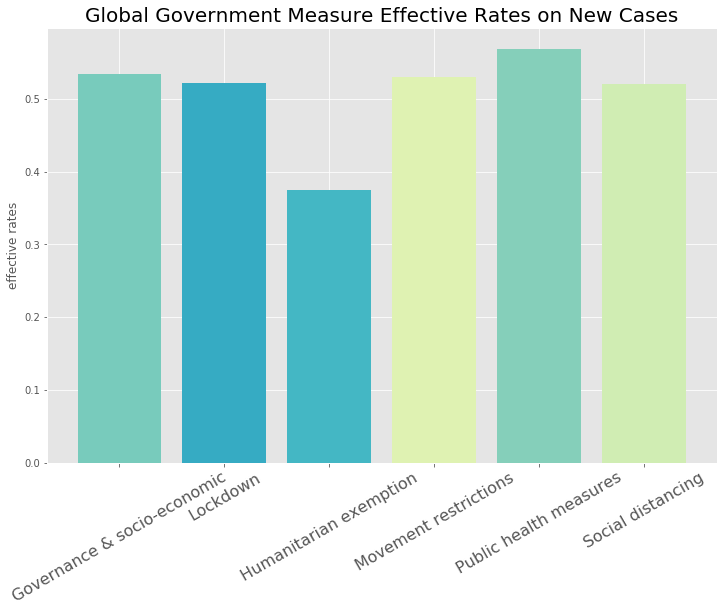

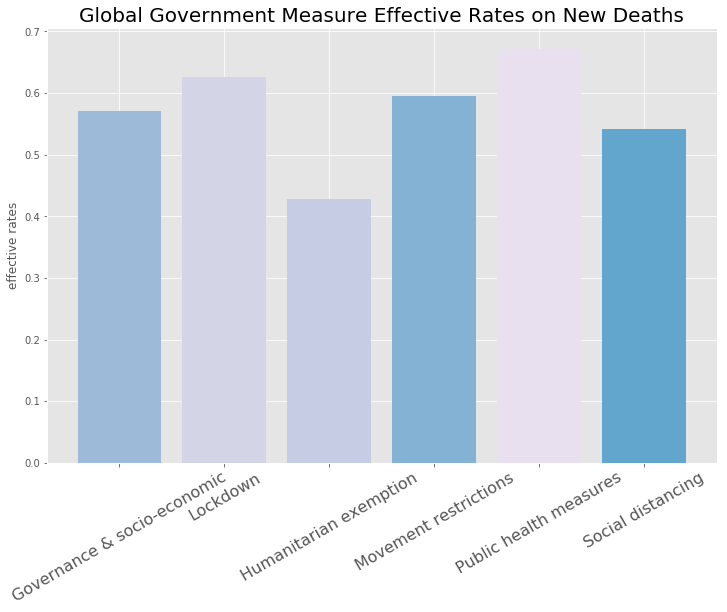

{'New_cases': [0.5337423312883436,
  0.5210084033613446,
  0.375,
  0.5297619047619048,
  0.5688622754491018,
  0.5209580838323353],
 'New_deaths': [0.5702479338842975,
  0.6265060240963856,
  0.42857142857142855,
  0.5952380952380952,
  0.671875,
  0.5416666666666666]}

In [192]:
gov_correlation(14,True)

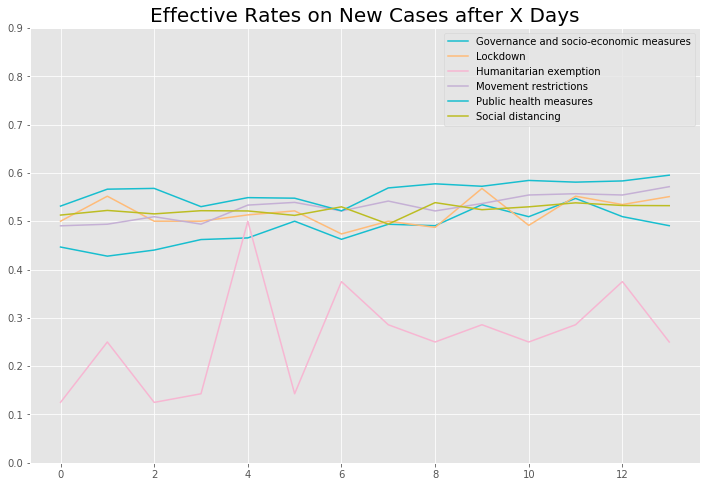

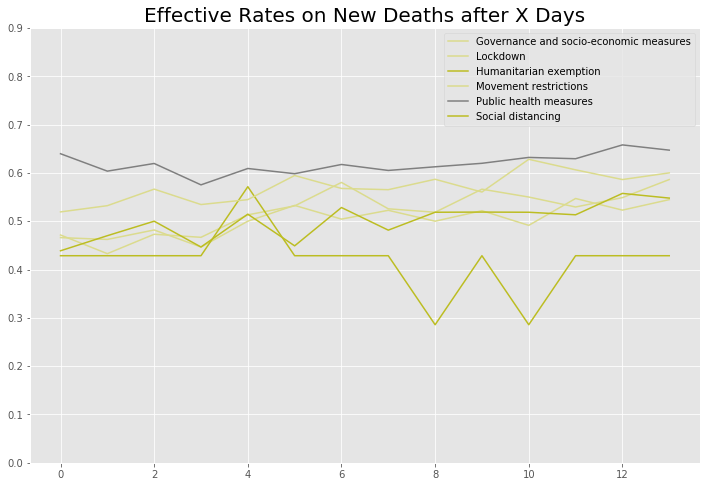

In [193]:
cor_ratio={}
series_tag=['New_cases','New_deaths']
measure_tag=["Governance and socio-economic measures", "Lockdown","Humanitarian exemption","Movement restrictions","Public health measures","Social distancing"]
for series in series_tag:
    cor_ratio[series]={}
for series in series_tag:
    for tag in measure_tag:
        cor_ratio[series][tag]=[]

for i in range(14):
    dict_c=gov_correlation(i)
    for series in series_tag:
        for j in range(len(measure_tag)):
            tag=measure_tag[j]
            cor_ratio[series][tag].append(dict_c[series][j])

my_cmap = cm.get_cmap('tab20')
for series in series_tag:
    plt.figure(figsize=(12,8))
    for tag in measure_tag:
        ind = np.arange(len(cor_ratio[series][tag]))
        color=random.uniform(0, 1)
        plt.plot(ind, cor_ratio[series][tag],color=my_cmap(color),label=tag)
    plt.yticks(np.arange(0, 1, 0.1))
    plt.title("Effective Rates on "+' '.join(series.split('_')).title()+" after X Days",fontsize=20)
    plt.legend(loc='upper right')
    plt.show()
        

### Analysis of the effectiveness of educational measures

In [194]:
def edu_correlation(shift_v,show_pic=False,print_result=False):
    cor_result={}
    cor_min={}
    cor_ratio={}
    series_tag=['New_cases','New_deaths']
    measure_tag=["national close","localized close","localized reopen","national reopen","open"]
    for series in series_tag:
        cor_result[series]={}
        cor_min[series]={}
        cor_ratio[series]=[]
    for series in series_tag:
        for tag in measure_tag:
            cor_result[series][tag]=[]
            cor_min[series][tag]=(1,"")
    

    for country in who_dict.keys():

        if country.strip() == "" or (iso_dict[country][0] not in edu_by_country.keys()):
            continue
        date= who_dict[country]['Date_reported']

        ind = np.arange(len(who_dict[country]['Date_reported']))
        for i in range(len(series_tag)):
            series=series_tag[i]
            data=who_dict[country][series]
            delta=[data[0]]
            for i in range(1,len(data)):
                delta.append(data[i]-data[i-1])
            delta=np.array(delta)
            for key in edu_by_country[iso_dict[country][0]]:

                x=[False for j in range(len(who_dict[country]['Date_reported']))]
                shift=min((edu_by_country[iso_dict[country][0]][key]-date[0]).days+shift_v,len(x)-1)
                shift=max(shift,0)
                x[shift]=True
                x=np.array(x)
                res=stats.pearsonr(x, delta)
                if key in measure_tag:
                    if not math.isnan(res[0]):
                        if res[0]<cor_min[series][key][0]:
                            cor_min[series][key]=(res[0],country)
                        cor_result[series][key].append(res[0])

    for series in series_tag:
        for tag in measure_tag:
            pos=np.sum(np.array(cor_result[series][tag]) > 0, axis=0)
            neg=np.sum(np.array(cor_result[series][tag]) < 0, axis=0)
            cor_ratio[series].append(neg/(pos+neg))
            if print_result:
                print("============================================")
                print(tag+"'s affects on "+' '.join(series.split('_')).lower())
                print("positive correlation countries: "+str(pos))
                print("negative correlation countries: "+str(neg))
                print("measure works best in: "+str(iso_dict[cor_min[series][tag][1]][1]))
                print("")
    
    if show_pic==True:
        for series in series_tag:
            cm_dict={'New_cases':'YlGnBu','New_deaths':"PuBuGn"}
            plt.figure(figsize=(12,8))
            ind = np.arange(len(cor_ratio[series]))
            color=[random.uniform(0.1, 0.6) for i in range(len(tags))]
            my_cmap = cm.get_cmap(cm_dict[series])
            p1 = plt.bar(ind, cor_ratio[series],color=my_cmap(color))
            plt.ylabel('effective rates')
            plt.title('Global Educational Measure Effective Rates on '+' '.join(series.split('_')).title(),fontsize=20)
            plt.xticks(ind, measure_tag)
            plt.xticks(rotation=30,fontsize=16)
            plt.show() 
    return cor_ratio


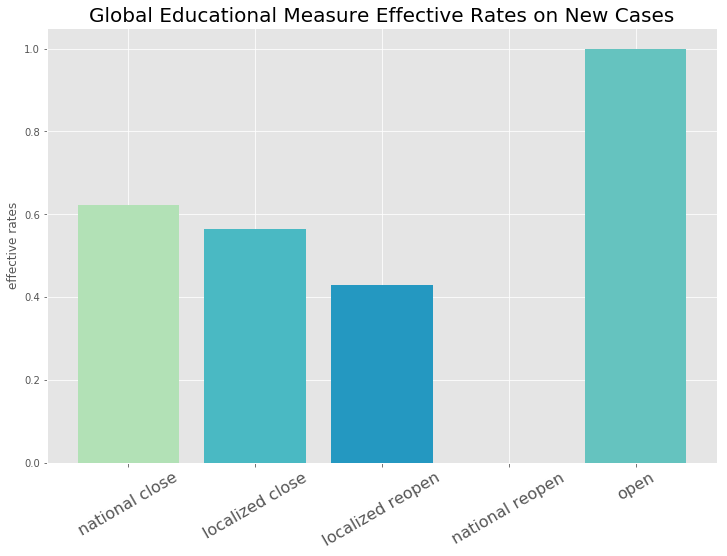

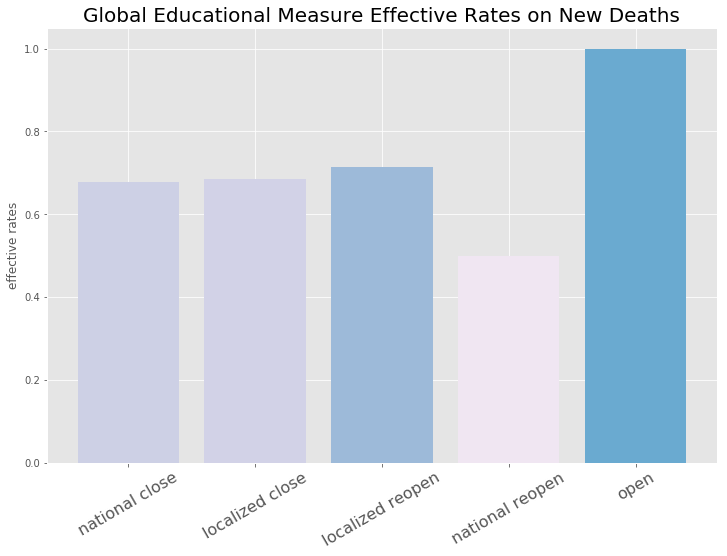

{'New_cases': [0.6222222222222222,
  0.5638297872340425,
  0.42857142857142855,
  0.0,
  1.0],
 'New_deaths': [0.6774193548387096,
  0.6842105263157895,
  0.7142857142857143,
  0.5,
  1.0]}

In [195]:
edu_correlation(14,show_pic=True)

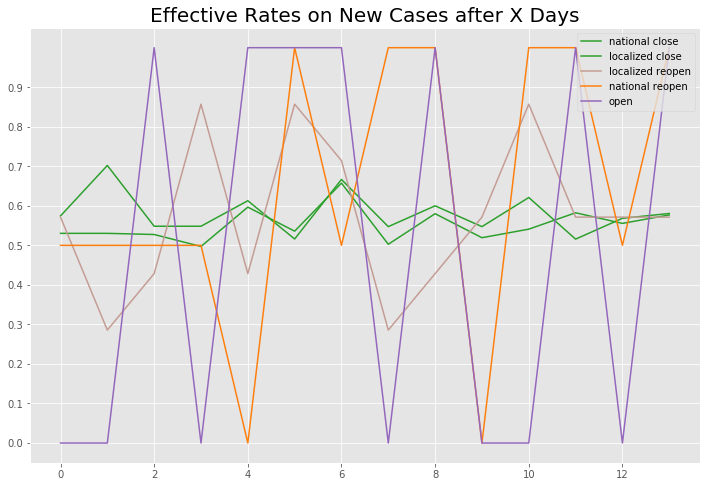

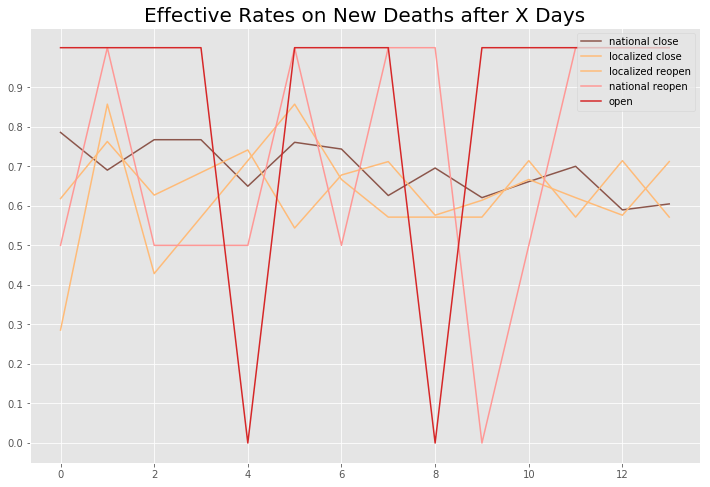

In [196]:
cor_ratio={}
series_tag=['New_cases','New_deaths']
measure_tag=["national close","localized close","localized reopen","national reopen","open"]
for series in series_tag:
    cor_ratio[series]={}
for series in series_tag:
    for tag in measure_tag:
        cor_ratio[series][tag]=[]

for i in range(14):
    dict_c=edu_correlation(i)
    for series in series_tag:
        for j in range(len(measure_tag)):
            tag=measure_tag[j]
            cor_ratio[series][tag].append(dict_c[series][j])

my_cmap = cm.get_cmap('tab20')
for series in series_tag:
    plt.figure(figsize=(12,8))
    for tag in measure_tag:
        ind = np.arange(len(cor_ratio[series][tag]))
        color=random.uniform(0.1, 0.6)
        plt.plot(ind, cor_ratio[series][tag],color=my_cmap(color),label=tag)
    plt.yticks(np.arange(0, 1, 0.1))
    plt.title("Effective Rates on "+' '.join(series.split('_')).title()+" after X Days",fontsize=20)
    plt.legend(loc='upper right')
    plt.show()
        